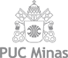
<B>PONTIFÍCIA UNIVERSIDADE CATÓLICA DE MINAS GERAIS

NÚCLEO DE EDUCAÇÃO A DISTÂNCIA

Pós-graduação Lato Sensu em Ciência de Dados e Big Data

Título: Segmentação de Vendedores do marketplace Olist Store em 2017

Aluno: Alexandre Luís Nunes Cardiga</B>


<B>Nome:</B> 02_Analise_e_Exploracao_Dados.ipynb

<B>Data:</B> 15/02/2022
    
<a class="anchor" id="etapas"></a>
## Indice

1. [Análise e Exploração dos Dados](#aexpd)<br>
&emsp;1.1 [Classificação das Features](#ifeat)<br>
&emsp;1.2 [Estatistica Descritiva](#edesc)<br>
&emsp;&emsp;1.2.1 [Features Continuas](#feacon)<br>
&emsp;&emsp;1.2.2 [Features Discretas](#feadis)<br>
&emsp;&emsp;1.2.3 [Features Categóricas](#feacat)<br>
&emsp;1.3 [Análises Features](#analise)<br>
&emsp;&emsp;1.3.1 [Univariadas](#univar)<br>
&emsp;&emsp;&emsp;1.3.1.1 [Continuas](#unicon)<br>
&emsp;&emsp;&emsp;1.3.1.2 [Discretas](#unidis)<br>
&emsp;&emsp;&emsp;1.3.1.3 [Categóricas](#unicat)<br>
&emsp;&emsp;1.3.2 [Bivariadas](#bivvar)<br>
&emsp;&emsp;1.3.3 [Multivariadas](#multivar)<br>
&emsp;1.4 [Estatística Inferencial](#grarel)<br>
&emsp;1.5 [Matriz de Correlação](#matcor)<br>
&emsp;1.6 [Multicolinearidade](#multcol)<br>
&emsp;1.7 [Variância](#variancia)<br>
&emsp;1.8 [Teste de Hopkins](#testeh)<br>


<p><b>Localização Projeto: </b> <a href = 'https://github.com/Alexandre-316/Projeto_Ciencia_de_Dados' target = "_blank">Git Hub</a></p>

## <a class="anchor" id="aexpd">1. Análise e Exploração dos Dados</a>

In [706]:
# Apaga todas as variáveis
%reset

Once deleted, variables cannot be recovered. Proceed (y/[n])? y


In [707]:
#recursos alocados
%whos

Interactive namespace is empty.


In [708]:
import sys
import os
import pandas as pd
import numpy as np
import requests
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

import seaborn as sns
#import datetime

from datetime import datetime as dt


from scipy import stats
from scipy.stats    import normaltest, kstest,norm
from sklearn.feature_selection import VarianceThreshold
from sklearn.neighbors import NearestNeighbors
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter

from random import sample
from numpy.random import uniform
from math import isnan

import warnings 
if not sys.warnoptions:
    #warnings.filterwarnings('ignore')
    warnings.simplefilter('ignore')

# Define a pasta onde está o arquivo minhas_funcoes.py
sys.path.insert(0, '../Lib')

# Importar minhas_funcoes.py
import minhas_funcoes as mf

import locale
locale.setlocale(locale.LC_ALL, 'pt_BR.utf8')

caminho = '../Data/'
caminho_temp = '../Template/'

#exibe todas as colunas
#pd.set_option('display.max_columns', None)
pd.set_option('display.max_columns', 150)
#pd.set_option('display.max_columns', 999999999)
#pd.set_option('display.max_rows', 999999999)
pd.set_option('display.max_rows', 150)

In [709]:
lista_meses=['Jan', 'Fev', 'Mar', 'Abr', 'Mai','Jun','Jul','Ago','Set','Out','Nov','Dez']

## <a class="anchor" id="ifeat">1.1 Classificação das Features</a>
[Retorna ao Indice](#etapas)

In [710]:
df_abt = pd.read_excel(caminho_temp+'01_Coleta_Processamento_df_Analytic_Base_Table.xlsx')

In [711]:
df_abt

,vendedor_id,vendedor_cidade,vendedor_estado,vendedor_cidade_id,vendedor_estado_id,vendedor_grande_regiao_id,vendedor_grande_regiao_nome,review_score_moda,plano,plano_valor,plano_comissao,valor_taxa,valor_comissao,custo_frete,distancia_cliente_vendedor_mediana,qtd_clientes,qtd_clientes_repete,qtd_itens_pedido_mediana,preco,frete_valor,preco_frete,qtd_pedidos,qtd_produtos,produto_peso_g_mediana,produto_volume_cm3_mediana,densidade_produto_mediana,produto_categoria_nome_moda,produto_categoria_id_moda,Area(km2)_mediana,populacao_mediana,habit_km2_mediana,tempo_entrega_compra_mediana,tempo_aprovado_compra_mediana,tempo_estimado_compra_mediana,tempo_postagem_compra_mediana,tempo_entrega_aprovado_LeadTime_mediana,tempo_postagem_aprovado_mediana,tempo_entrega_postagem_mediana,postagem_limiteparceiro_variacao_mediana,postagem_limiteparceiro_dias_atraso_mediana,postagem_limiteparceiro_atrasado_moda,entrega_estimado_variacao_mediana,entrega_estimado_dias_atraso_mediana,entrega_estimado_atrasado_moda,qtd_pedidos_Nacional_Estadual_Comemorativa,qtd_clientes_capital,qtd_clientes_estado,"PIB_percapita_(11000,19000]","PIB_percapita_(19000,27000]","PIB_percapita_(27000,35000]","PIB_percapita_(3285,11000]","PIB_percapita_(35000,43000]","PIB_percapita_(43000,51000]","PIB_percapita_(51000,344847]",pagamento_tipo_boleto,pagamento_tipo_cartao_credito,pagamento_tipo_cartao_debito,pagamento_tipo_voucher,pagamento_parcelas_boleto,pagamento_parcelas_cartao_credito,pagamento_parcelas_cartao_debito,pagamento_parcelas_voucher,pagamento_sequencia_boleto,pagamento_sequencia_cartao_credito,pagamento_sequencia_cartao_debito,pagamento_sequencia_voucher,pagamento_valor_boleto,pagamento_valor_cartao_credito,pagamento_valor_cartao_debito,pagamento_valor_voucher,custo_reviews,qtd_clientes_fora_capital,qtd_clientes_fora_estado,qtd_mes_01,qtd_mes_02,qtd_mes_03,qtd_mes_04,qtd_mes_05,qtd_mes_06,qtd_mes_07,qtd_mes_08,qtd_mes_09,qtd_mes_10,qtd_mes_11,qtd_mes_12,vlr_mes_01,vlr_mes_02,vlr_mes_03,vlr_mes_04,vlr_mes_05,vlr_mes_06,vlr_mes_07,vlr_mes_08,vlr_mes_09,vlr_mes_10,vlr_mes_11,vlr_mes_12,meses_olist,dias_olist,qtd_pedidos_pontos,preco_pontos,review_score_pontos,tempo_postagem_compra_pontos,vendedor_pontuacao,vendedor_score,receitas,adm_custos,lucro,velocidade_km_dias,pedidos_por_dia_media,dias_entre_pedidos,vlr_medio_pedido,razao_frete_preco,vlr_frete_por_pedido_media
0,0015a82c2db000af6aaaf3ae2ecb0532,santo andre,SP,3547809,35,3,Sudeste,5,Lite,18.99,0.21,0,563.85,31.53,687.8890,3,3,1,2685.00,63.06,2748.06,3,3,11800.0,61920.0,0.190,eletroportateis,15,1234.5370,92386.002,33.480,10,0,24,2,9,1,7,-5,0,0,-13,0,0,1,0,0,1,0,1,0,1,0,0,0,3,0,0,0,22,0,0,0,3,0,0,0.00,2748.06,0.0,0.00,40,3,3,0,0,0,0,0,0,0,0,1,2,0,0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,916.02,1832.04,0.00,0.00,1,21,2,4,2,3,2423,11,582.84,230.68,280.63,76.43,0.142857,7,916.02,0.02,21.02
1,001cca7ae9ae17fb1caed9dfb1094831,cariacica,ES,3201308,32,3,Sudeste,5,Pro,173.99,0.19,25,3868.42,3399.56,735.3060,166,166,1,20360.23,6963.92,27324.15,166,167,9000.0,19656.0,0.460,ferramentas_jardim,17,520.8070,402027.039,1465.140,10,0,25,2,10,1,8,-5,0,0,-14,0,0,10,60,5,15,36,15,4,25,21,50,38,127,0,2,38,533,0,3,38,127,0,3,6434.32,20761.86,0.0,213.94,1285,106,161,0,5,10,12,23,21,21,11,11,22,18,12,0.00,1295.40,1594.08,1952.31,3616.97,2980.17,3536.03,1709.54,2223.27,3625.65,2968.72,1822.01,11,326,4,4,2,3,4423,13,5807.31,1715.94,-593.19,73.53,0.509202,2,164.60,0.34,41.95
2,002100f778ceb8431b7a1020ff7ab48f,franca,SP,3516200,35,3,Sudeste,5,Basic,68.99,0.20,210,156.36,0.00,353.5575,38,38,1,781.80,593.53,1375.33,38,42,300.0,9600.0,0.030,moveis_decoracao,26,539.7165,399307.051,843.435,13,0,22,4,13,3,9,-3,0,0,-9,0,0,4,12,18,4,7,1,1,4,8,13,16,20,0,5,16,35,0,5,16,20,0,5,611.49,677.63,0.0,139.68,305,26,20,0,0,0,0,0,0,0,0,3,9,11,15,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,98.25,367.30,445.78,464.00,3,105,4,3,2,2,4322,11,573.33,820.99,-552.66,27.20,0.361905,3,36.19,0.76,15.62
3,003554e2dce176b5555353e4f3555ac8,goiania,GO,5208707,52,5,Centro-oes

In [712]:
df_abt.shape

(1658, 114)

In [713]:
#mantendo cópia do dataframe original e lista das features
df_abt_orig=df_abt.copy(deep=True)
features_orig=df_abt.columns
len(features_orig)

114

In [714]:
df_abt.head(3)

,vendedor_id,vendedor_cidade,vendedor_estado,vendedor_cidade_id,vendedor_estado_id,vendedor_grande_regiao_id,vendedor_grande_regiao_nome,review_score_moda,plano,plano_valor,plano_comissao,valor_taxa,valor_comissao,custo_frete,distancia_cliente_vendedor_mediana,qtd_clientes,qtd_clientes_repete,qtd_itens_pedido_mediana,preco,frete_valor,preco_frete,qtd_pedidos,qtd_produtos,produto_peso_g_mediana,produto_volume_cm3_mediana,densidade_produto_mediana,produto_categoria_nome_moda,produto_categoria_id_moda,Area(km2)_mediana,populacao_mediana,habit_km2_mediana,tempo_entrega_compra_mediana,tempo_aprovado_compra_mediana,tempo_estimado_compra_mediana,tempo_postagem_compra_mediana,tempo_entrega_aprovado_LeadTime_mediana,tempo_postagem_aprovado_mediana,tempo_entrega_postagem_mediana,postagem_limiteparceiro_variacao_mediana,postagem_limiteparceiro_dias_atraso_mediana,postagem_limiteparceiro_atrasado_moda,entrega_estimado_variacao_mediana,entrega_estimado_dias_atraso_mediana,entrega_estimado_atrasado_moda,qtd_pedidos_Nacional_Estadual_Comemorativa,qtd_clientes_capital,qtd_clientes_estado,"PIB_percapita_(11000,19000]","PIB_percapita_(19000,27000]","PIB_percapita_(27000,35000]","PIB_percapita_(3285,11000]","PIB_percapita_(35000,43000]","PIB_percapita_(43000,51000]","PIB_percapita_(51000,344847]",pagamento_tipo_boleto,pagamento_tipo_cartao_credito,pagamento_tipo_cartao_debito,pagamento_tipo_voucher,pagamento_parcelas_boleto,pagamento_parcelas_cartao_credito,pagamento_parcelas_cartao_debito,pagamento_parcelas_voucher,pagamento_sequencia_boleto,pagamento_sequencia_cartao_credito,pagamento_sequencia_cartao_debito,pagamento_sequencia_voucher,pagamento_valor_boleto,pagamento_valor_cartao_credito,pagamento_valor_cartao_debito,pagamento_valor_voucher,custo_reviews,qtd_clientes_fora_capital,qtd_clientes_fora_estado,qtd_mes_01,qtd_mes_02,qtd_mes_03,qtd_mes_04,qtd_mes_05,qtd_mes_06,qtd_mes_07,qtd_mes_08,qtd_mes_09,qtd_mes_10,qtd_mes_11,qtd_mes_12,vlr_mes_01,vlr_mes_02,vlr_mes_03,vlr_mes_04,vlr_mes_05,vlr_mes_06,vlr_mes_07,vlr_mes_08,vlr_mes_09,vlr_mes_10,vlr_mes_11,vlr_mes_12,meses_olist,dias_olist,qtd_pedidos_pontos,preco_pontos,review_score_pontos,tempo_postagem_compra_pontos,vendedor_pontuacao,vendedor_score,receitas,adm_custos,lucro,velocidade_km_dias,pedidos_por_dia_media,dias_entre_pedidos,vlr_medio_pedido,razao_frete_preco,vlr_frete_por_pedido_media
0,0015a82c2db000af6aaaf3ae2ecb0532,santo andre,SP,3547809,35,3,Sudeste,5,Lite,18.99,0.21,0,563.85,31.53,687.8890,3,3,1,2685.00,63.06,2748.06,3,3,11800.0,61920.0,0.19,eletroportateis,15,1234.5370,92386.002,33.480,10,0,24,2,9,1,7,-5,0,0,-13,0,0,1,0,0,1,0,1,0,1,0,0,0,3,0,0,0,22,0,0,0,3,0,0,0.00,2748.06,0.0,0.00,40,3,3,0,0,0,0,0,0,0,0,1,2,0,0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,916.02,1832.04,0.00,0.00,1,21,2,4,2,3,2423,11,582.84,230.68,280.63,76.43,0.142857,7,916.02,0.02,21.02
1,001cca7ae9ae17fb1caed9dfb1094831,cariacica,ES,3201308,32,3,Sudeste,5,Pro,173.99,0.19,25,3868.42,3399.56,735.3060,166,166,1,20360.23,6963.92,27324.15,166,167,9000.0,19656.0,0.46,ferramentas_jardim,17,520.8070,402027.039,1465.140,10,0,25,2,10,1,8,-5,0,0,-14,0,0,10,60,5,15,36,15,4,25,21,50,38,127,0,2,38,533,0,3,38,127,0,3,6434.32,20761.86,0.0,213.94,1285,106,161,0,5,10,12,23,21,21,11,11,22,18,12,0.0,1295.4,1594.08,1952.31,3616.97,2980.17,3536.03,1709.54,2223.27,3625.65,2968.72,1822.01,11,326,4,4,2,3,4423,13,5807.31,1715.94,-593.19,73.53,0.509202,2,164.60,0.34,41.95
2,002100f778ceb8431b7a1020ff7ab48f,franca,SP,3516200,35,3,Sudeste,5,Basic,68.99,0.20,210,156.36,0.00,353.5575,38,38,1,781.80,593.53,1375.33,38,42,300.0,9600.0,0.03,moveis_decoracao,26,539.7165,399307.051,843.435,13,0,22,4,13,3,9,-3,0,0,-9,0,0,4,12,18,4,7,1,1,4,8,13,16,20,0,5,16,35,0,5,16,20,0,5,611.49,677.63,0.0,139.68,305,26,20,0,0,0,0,0,0,0,0,3,9,11,15,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,98.25,367.30,445.78,464.00,3,105,4,3,2,2,4322,11,573.33,820.99,-552.66,27.20,0.361905,3,36.19,0.76,15.62


In [715]:
#verificar a cardinalidade
for col in features_orig:
    if df_abt[col].nunique()<14:
        print("Feature {} cardinalidade={}".format(col,df_abt[col].nunique()))

Feature vendedor_grande_regiao_id cardinalidade=5
Feature vendedor_grande_regiao_nome cardinalidade=5
Feature review_score_moda cardinalidade=5
Feature plano cardinalidade=3
Feature plano_valor cardinalidade=3
Feature plano_comissao cardinalidade=3
Feature qtd_itens_pedido_mediana cardinalidade=6
Feature tempo_aprovado_compra_mediana cardinalidade=6
Feature postagem_limiteparceiro_atrasado_moda cardinalidade=2
Feature entrega_estimado_atrasado_moda cardinalidade=2
Feature pagamento_tipo_cartao_debito cardinalidade=7
Feature pagamento_parcelas_cartao_debito cardinalidade=7
Feature pagamento_sequencia_cartao_debito cardinalidade=7
Feature meses_olist cardinalidade=12
Feature qtd_pedidos_pontos cardinalidade=4
Feature preco_pontos cardinalidade=4
Feature review_score_pontos cardinalidade=2
Feature tempo_postagem_compra_pontos cardinalidade=4
Feature vendedor_score cardinalidade=11


In [716]:
features_dis=['qtd_clientes', 'qtd_clientes_repete', 'qtd_itens_pedido_mediana', 'qtd_pedidos',
        'qtd_produtos',  'tempo_entrega_compra_mediana', 'tempo_aprovado_compra_mediana',
        'tempo_estimado_compra_mediana', 'tempo_postagem_compra_mediana', 'tempo_entrega_aprovado_LeadTime_mediana',
        'tempo_postagem_aprovado_mediana', 'tempo_entrega_postagem_mediana', 'postagem_limiteparceiro_variacao_mediana',
        'postagem_limiteparceiro_dias_atraso_mediana', 
        'entrega_estimado_variacao_mediana', 'entrega_estimado_dias_atraso_mediana',
        'qtd_pedidos_Nacional_Estadual_Comemorativa', 'qtd_clientes_capital', 'qtd_clientes_fora_capital',
        'qtd_clientes_estado','qtd_clientes_fora_estado',
        'PIB_percapita_(11000,19000]', 'PIB_percapita_(19000,27000]', 'PIB_percapita_(27000,35000]',
        'PIB_percapita_(3285,11000]', 'PIB_percapita_(35000,43000]', 'PIB_percapita_(43000,51000]',
        'PIB_percapita_(51000,344847]',
        'pagamento_tipo_boleto', 'pagamento_tipo_cartao_credito', 'pagamento_tipo_cartao_debito', 'pagamento_tipo_voucher',
        'pagamento_parcelas_boleto', 'pagamento_parcelas_cartao_credito', 'pagamento_parcelas_cartao_debito',
        'pagamento_parcelas_voucher', 'pagamento_sequencia_boleto', 'pagamento_sequencia_cartao_credito',
        'pagamento_sequencia_cartao_debito', 'pagamento_sequencia_voucher', 'meses_olist', 'dias_olist',
        'qtd_pedidos_pontos', 'preco_pontos', 'review_score_pontos', 'tempo_postagem_compra_pontos', 'vendedor_pontuacao',
        'vendedor_score','dias_entre_pedidos','review_score_moda', 'qtd_mes_01' , 'qtd_mes_02', 'qtd_mes_03', 'qtd_mes_04',
        'qtd_mes_05', 'qtd_mes_06', 'qtd_mes_07', 'qtd_mes_08', 'qtd_mes_09', 'qtd_mes_10', 'qtd_mes_11', 'qtd_mes_12'
        ]
features_cat=['produto_categoria_nome_moda', 'plano','vendedor_cidade','vendedor_estado','vendedor_grande_regiao_nome',
        'postagem_limiteparceiro_atrasado_moda','entrega_estimado_atrasado_moda'     
        ]
features_cat2=['produto_categoria_nome_moda', 'plano','vendedor_cidade','vendedor_estado','vendedor_grande_regiao_nome'             
        ]
features_id=['vendedor_cidade_id', 'vendedor_grande_regiao_id','vendedor_estado_id','vendedor_id',
        'produto_categoria_id_moda']
features_con = list(set(features_orig) - set(features_dis) - set(features_cat)- set(features_id))

In [717]:
print("{} - Features originais".format(len(features_orig)))
print("{} - Features discretas".format(len(features_dis)))
print("{} - Features categóricas".format(len(features_cat)))
print("{} - Features continuas".format(len(features_con)))
print("{} - Features identificação(id)".format(len(features_id)))

114 - Features originais
62 - Features discretas
7 - Features categóricas
40 - Features continuas
5 - Features identificação(id)


In [718]:
features_corr = features_dis + features_con + features_id + ['postagem_limiteparceiro_atrasado_moda','entrega_estimado_atrasado_moda']
#vendedor_id não interessa ao projeto
features_corr=list(set(features_corr) - set(['vendedor_id']))
len(features_corr)

108

In [719]:
features_numericas_relevantes= features_dis + features_con

In [720]:
len(features_numericas_relevantes)

102

In [721]:
for col in features_numericas_relevantes:
    print("Feature {} cardinalidade={}".format(col,df_abt[col].nunique()))

Feature qtd_clientes cardinalidade=168
Feature qtd_clientes_repete cardinalidade=167
Feature qtd_itens_pedido_mediana cardinalidade=6
Feature qtd_pedidos cardinalidade=167
Feature qtd_produtos cardinalidade=172
Feature tempo_entrega_compra_mediana cardinalidade=46
Feature tempo_aprovado_compra_mediana cardinalidade=6
Feature tempo_estimado_compra_mediana cardinalidade=50
Feature tempo_postagem_compra_mediana cardinalidade=35
Feature tempo_entrega_aprovado_LeadTime_mediana cardinalidade=46
Feature tempo_postagem_aprovado_mediana cardinalidade=35
Feature tempo_entrega_postagem_mediana cardinalidade=38
Feature postagem_limiteparceiro_variacao_mediana cardinalidade=44
Feature postagem_limiteparceiro_dias_atraso_mediana cardinalidade=23
Feature entrega_estimado_variacao_mediana cardinalidade=63
Feature entrega_estimado_dias_atraso_mediana cardinalidade=21
Feature qtd_pedidos_Nacional_Estadual_Comemorativa cardinalidade=32
Feature qtd_clientes_capital cardinalidade=98
Feature qtd_clientes_fo

In [722]:
for col in features_cat:
    print("Feature {} \n{}".format(col,df_abt[col].value_counts()))

Feature produto_categoria_nome_moda 
esporte_lazer                       174
moveis_decoracao                    170
beleza_saude                        147
moda_beleza_perfumaria              135
utilidades_domesticas               111
brinquedos_e_bebes                  110
automotivo                           98
informatica_tablets                  89
Outros                               78
eletronicos_games_livros             68
ferramentas_jardim                   63
cool_stuff                           62
cama_mesa_banho                      62
telefonia                            44
construção_ferramentas               41
pet_shop                             33
papelaria                            29
instrumentos_musicais                23
eletroportateis                      22
alimentos_bebidas                    18
malas_acessorios                     18
eletrodomesticos                     14
climatizacao                         12
industria_comercio                    9
cin

## <a class="anchor" id="edesc">1.2 Estatística Descritiva</a>
[Retorna ao Indice](#etapas)

In [723]:
"""
Se a assimetria mede a distância entre a moda e a média da distribuição, a curtose permite medir o grau de achatamento da 
distribuição em relação à distribuição normal (distribuição estatística teórica).

"""

'\nSe a assimetria mede a distância entre a moda e a média da distribuição, a curtose permite medir o grau de achatamento da \ndistribuição em relação à distribuição normal (distribuição estatística teórica).\n\n'

## <a class="anchor" id="feacon">1.2.1 Features Continuas</a>

In [724]:
df_estat_continuas=mf.estatistica_quanti(df_abt, 0.05,features_con)
df_estat_continuas.to_excel(caminho_temp+'02_Analise_e_Exploracao_df_estat_continuas.xlsx', index=False)
df_estat_continuas.head(3)

,feature,count,mean,median,std,var,Coeficiente_Variacao_%,mod,min,25%,50%,75%,max,range,skew,Assimetria,kurtosis,curtose,NormalTeste,NormalTeste_p,Rejeitar H0,Teste_Kolmogorov,Teste_Kolmogorov_p,Rejeitar H0-Kolmogorov
vlr_mes_05,vlr_mes_05,1658.0,292.68,0.0,1060.58,1124839.37,362.0,0.0,0.0,0.00,0.0,149.97,19763.92,19763.92,10.09,Direita,143.53,leptocúrtica-cauda fina e pontiaguda,2653.267167,0.000000e+00,True,0.500000,0.0,True
pagamento_valor_voucher,pagamento_valor_voucher,1658.0,66.45,0.0,220.17,48473.84,331.0,0.0,0.0,0.00,0.0,52.09,4198.31,4198.31,10.00,Direita,144.04,leptocúrtica-cauda fina e pontiaguda,2643.180519,0.000000e+00,True,0.500000,0.0,True
velocidade_km_dias,velocidade_km_dias,1658.0,51.22,44.5,36.44,1328.09,71.0,43.9,0.1,28.14,44.5,63.75,405.46,405.36,2.34,Direita,10.75,leptocúrtica-cauda fina e pontiaguda,899.739901,4.206907e-196,True,0.983407,0.0,True


In [725]:
"""
https://github.com/VivekRai10/SKEWNESS_AND_KURTOSIS/blob/main/SKEWNESS_AND_KURTOSIS.ipynb
skew(assimetria):
-0.5 à +0.5              -> simétrico
-1   à -0.5  ou 0.5 à 1  -> moderadamente simétrico
<-1 ou > 1               -> fortemente distorcidos

C.V.=coeficiente de variação 
C.V.<= 15%     = baixa dispersão:homogeneos
15%>C.V.<= 30% = média dispersão
>30%           = alta dispersão:dados heterogeneos
Quanto menor o Coeficiente de Variação(CV) de um conjunto de dados, menor é a sua variabilidade.


Análises:
Todas as features não seguem a normalidade.
1-valor_comissao: desvio padrão(1734.80) quase 3X a média(615.81), o CV 282%.Variancia muito alta ->alta dispersão
2-pagamento_valor_cartao_debito:desvio padrão(25.18) quase 4X a média(6.02), o CV 418%.Variancia muito alta ->alta dispersão
3-pedidos_por_dia_media:desvio padrão(0.44) próximo da média(0.36), o CV 122%.Variancia muito baixa ->alta dispersão
4-preco:desvio padrão(9113.64) quase 3X a média(3132.94), o CV 291%.Variancia muito alta ->alta dispersão
5-pagamento_valor_boleto:desvio padrão(1840.57) quase 3X a média(666.95), o CV 276%.Variancia muito alta ->alta dispersão
6-frete_valor:desvio padrão(1450.62) quase 3X a média(536.30), o CV 270%.Variancia muito alta ->alta dispersão
7-velocidade_km_dias:desvio padrão(36.44) pouco mais que a metade da média(51.22), o CV 71%.Variancia grande ->alta dispersão
8-razao_frete_preco:desvio padrão(0.25) próxima da média(0.27), o CV 93%.Variancia muito baixa ->alta dispersão
9-receitas:desvio padrão(2188.85) mais de 2X a média(940.82), o CV 233%.Variancia muito alta ->alta dispersão
10-adm_custos:desvio padrão(473.9) próximo da média(482.51), o CV 98%.Variancia muito alta ->alta dispersão
11-vlr_medio_pedido:desvio padrão(170.43) bem próximo da média(175.59), o CV 97%.Variancia alta ->alta dispersão
12-Area(km2)_mediana:desvio padrão(1071.22) bem próxima da média(939.24), o CV 270%.Variancia muito alta ->alta dispersão
13-densidade_produto_mediana:desvio padrão(0.66) quase 4X a média(0.15), o CV 347%.Variancia muita alta ->alta dispersão
14-pagamento_valor_voucher:desvio padrão(220.17) quase 4X a média(66.45), o CV 331%.Variancia alta ->alta dispersão
15-preco_frete:desvio padrão(10369.78) quase 3X a média(3669.24), o CV 283%.Variancia muito alta ->alta dispersão
16-pagamento_valor_cartao_credito:desvio padrão(8691.09) quase 3X a média(2995.20), o CV 290%.Variancia muito alta ->alta dispersão
17-razao_frete_pedidos:desvio padrão(13.67) pouco mais da metade da média(23.05), o CV 59%.Variancia alta ->alta dispersão
18-lucro:desvio padrão(1031.99) quase 10X a média(115.33), o CV 895%.Variancia muito alta ->alta dispersão
19-populacao_mediana:desvio padrão(2659823.81) quase 2X a média(1523443.63), o CV 175%.Variancia muito alta -alta dispersão
20-distancia_cliente_vendedor_mediana:desvio padrão(431.8) pouca diferença da média(448.15), o CV 78%.Variancia alta ->alta dispersão
21-produto_peso_g_mediana:desvio padrão(4247.73) quase 2X a média(2328.4), o CV 182%.Variancia alta ->alta dispersão
22-habit_km2_mediana:desvio padrão(2250.93) pouca diferença da média(2138.17), o CV 105%.Variancia  alta ->alta dispersão
23-produto_volume_cm3_mediana:desvio padrão(26376.57) quase 1.5X a média(16592.49), o CV 159%.Variancia muito alta ->alta dispersão
24-custo_frete:desvio padrão(526.69) quase 3.5X a média(165.59), o CV 318%.Variancia alta ->alta dispersão
25-valor_taxa:desvio padrão(221.88) quase 4X a média(64.7), o CV 343%.Variancia alta ->alta dispersão
26-custo_reviews:desvio padrão(553.23) quase 4X a média(177.39), o CV 312%.Variancia alta ->alta dispersão
27-plano_comissao:desvio padrão(0.01) quase 20X menor que a média(0.21), o CV 5%.Variancia zero ->baixa dispersão
28-plano_valor:desvio padrão(47.09) quase 20X menor que a média(38.67), o CV 122%.Variancia alta ->alta dispersão
29-qtd_mes_01:desvio padrão(346.29) quase 6X menor que a média(67.75), o CV 511%.Variancia muito alta ->alta dispersão
30-vlr_mes_02:desvio padrão(533.12) quase 4X menor que a média(140.43), o CV 380%.Variancia muito alta ->alta dispersão
31-vlr_mes_03:desvio padrão(739.01) quase 4X menor que a média(216.05), o CV 342%.Variancia muito alta ->alta dispersão
32-vlr_mes_04:desvio padrão(672.9) quase 4X menor que a média(197.73), o CV 340%.Variancia muito alta ->alta dispersão
33-vlr_mes_05:desvio padrão(1060.58) quase 4X menor que a média(292.68), o CV 362%.Variancia muito alta ->alta dispersão
34-vlr_mes_06:desvio padrão(891.28) quase 3.5X menor que a média(250.71), o CV 355%.Variancia muito alta ->alta dispersão
35-vlr_mes_07:desvio padrão(1162.83) quase 4X menor que a média(314.63), o CV 370% .Variancia muito alta ->alta dispersão
36-vlr_mes_08:desvio padrão(1334.71) quase 4X menor que a média(360.59), o CV 370%.Variancia muito alta ->alta dispersão
37-vlr_mes_09:desvio padrão(1508.15) quase 4X menor que a média(366.35), o CV 412%.Variancia muito alta ->alta dispersão
38-vlr_mes_10:desvio padrão(1341.93) quase 4X menor que a média(389.85), o CV 344%Variancia muito alta ->alta dispersão
39-vlr_mes_11:desvio padrão(1924.86) quase 3.5X menor que a média(616.39), o CV 312%.Variancia muito alta ->alta dispersão
40-vlr_mes_12:desvio padrão(1515.41) quase 4X menor que a média(456.04), o CV 332%.Variancia muito alta ->alta dispersão

Baixa dispersão:
-plano_comissao
Praticamente todas as features apresentam alta dispersão.
Com CV abaixo de +- 100%, então:
-velocidade_km_dias
-razao_frete_preco
-adm_custos
-vlr_medio_pedido
-razao_frete_pedidos
-distancia_cliente_vendedor_mediana
-habit_km2_mediana


"""

'\nhttps://github.com/VivekRai10/SKEWNESS_AND_KURTOSIS/blob/main/SKEWNESS_AND_KURTOSIS.ipynb\nskew(assimetria):\n-0.5 à +0.5              -> simétrico\n-1   à -0.5  ou 0.5 à 1  -> moderadamente simétrico\n<-1 ou > 1               -> fortemente distorcidos\n\nC.V.=coeficiente de variação \nC.V.<= 15%     = baixa dispersão:homogeneos\n15%>C.V.<= 30% = média dispersão\n>30%           = alta dispersão:dados heterogeneos\nQuanto menor o Coeficiente de Variação(CV) de um conjunto de dados, menor é a sua variabilidade.\n\n\nAnálises:\nTodas as features não seguem a normalidade.\n1-valor_comissao: desvio padrão(1734.80) quase 3X a média(615.81), o CV 282%.Variancia muito alta ->alta dispersão\n2-pagamento_valor_cartao_debito:desvio padrão(25.18) quase 4X a média(6.02), o CV 418%.Variancia muito alta ->alta dispersão\n3-pedidos_por_dia_media:desvio padrão(0.44) próximo da média(0.36), o CV 122%.Variancia muito baixa ->alta dispersão\n4-preco:desvio padrão(9113.64) quase 3X a média(3132.94), o C

In [726]:
df_estat_continuas[df_estat_continuas['feature'] == 'Area(km2)_mediana']

,feature,count,mean,median,std,var,Coeficiente_Variacao_%,mod,min,25%,50%,75%,max,range,skew,Assimetria,kurtosis,curtose,NormalTeste,NormalTeste_p,Rejeitar H0,Teste_Kolmogorov,Teste_Kolmogorov_p,Rejeitar H0-Kolmogorov
Area(km2)_mediana,Area(km2)_mediana,1658.0,939.24,707.17,1071.22,1147510.03,114.0,1200.177,15.33,496.68,707.17,1099.41,14419.92,14404.59,5.7,Direita,44.05,leptocúrtica-cauda fina e pontiaguda,1859.877385,0.0,True,1.0,0.0,True


In [727]:
df_estat_continuas.sort_values(by=['var'],ascending=True)

,feature,count,mean,median,std,var,Coeficiente_Variacao_%,mod,min,25%,50%,75%,max,range,skew,Assimetria,kurtosis,curtose,NormalTeste,NormalTeste_p,Rejeitar H0,Teste_Kolmogorov,Teste_Kolmogorov_p,Rejeitar H0-Kolmogorov
plano_comissao,plano_comissao,1658.0,0.21,0.21,0.01,0.000000e+00,5.0,0.210,0.19,0.21,0.21,0.21,0.21,0.02,-2.02,Zero,2.51,platicúrtica-cauda grossa e espessa,602.647386,1.370197e-131,True,0.575345,0.0,True
razao_frete_preco,razao_frete_preco,1658.0,0.27,0.20,0.25,6.000000e-02,93.0,0.110,0.02,0.12,0.20,0.32,4.27,4.25,4.74,Direita,48.26,leptocúrtica-cauda fina e pontiaguda,1698.645875,0.000000e+00,True,0.507978,0.0,True
pedidos_por_dia_media,pedidos_por_dia_media,1658.0,0.36,0.14,0.44,2.000000e-01,122.0,1.000,0.01,0.06,0.14,0.57,3.51,3.50,1.93,Direita,5.82,leptocúrtica-cauda fina e pontiaguda,685.876831,1.158080e-149,True,0.503117,0.0,True
densidade_produto_mediana,densidade_produto_mediana,1658.0,0.19,0.12,0.66,4.300000e-01,347.0,0.060,0.01,0.08,0.12,0.19,18.18,18.17,22.36,Direita,562.41,leptocúrtica-cauda fina e pontiaguda,3877.707315,0.000000e+00,True,0.503989,0.0,True
vlr_frete_por_pedido_media,vlr_frete_por_pedido_media,1658.0,23.05,18.95,13.67,1.868600e+02,59.0,15.100,0.75,15.40,18.95,25.20,126.72,125.97,2.98,Direita,12.27,leptocúrtica-cauda fina e pontiaguda,1087.961740,5.650798e-237,True,0.998787,0.0,True
pagamento_valor_cartao_debito,pagamento_valor_cartao_debito,1658.0,6.02,0.00,25.18,6.341800e+02,418.0,0.000,0.00,0.00,0.00,0.00,323.94,323.94,6.16,Direita,49.35,leptocúrtica-cauda fina e pontiaguda,1955.230414,0.000000e+00,True,0.500000,0.0,True
velocidade_km_dias,velocidade_km_dias,1658.0,51.22,44.50,36.44,1.328090e+03,71.0,43.900,0.10,28.14,44.50,63.75,405.46,405.36,2.34,Direita,10.75,leptocúrtica-cauda fina e pontiaguda,899.739901,4.206907e-196,True,0.983407,0.0,True
plano_valor,plano_valor,1658.0,38.67,18.99,47.09,2.217650e+03,122.0,18.990,18.99,18.99,18.99,18.99,173.99,155.00,2.33,Direita,3.85,leptocúrtica-cauda fina e pontiaguda,738.289365,4.813947e-161,True,1.000000,0.0,True
vlr_medio_pedido,vlr_medio_pedido,1658.0,175.59,122.94,170.43,2.904588e+04,97.0,182.450,11.63,75.27,122.94,205.24,1219.41,1207.78,2.80,Direita,9.73,leptocúrtica-cauda fina e pontiaguda,1002.125954,2.461013e-218,True,1.000000,0.0,True
pagamento_valor_voucher,pagamento_valor_voucher,1658.0,66.45,0.00,220.17,4.847384e+04,331.0,0.000,0.00,0.00,0.00,52.09,4198.31,4198.31,10.00,Direita,144.04,leptocúrtica-cauda fina e pontiaguda,2643.180519,0.000000e+00,True,0.500000,0.0,True


In [728]:
df_estat_continuas[['feature','skew','Assimetria','kurtosis','curtose']].sort_values(by=['kurtosis'],ascending=True)

,feature,skew,Assimetria,kurtosis,curtose
habit_km2_mediana,habit_km2_mediana,1.34,Direita,0.98,platicúrtica-cauda grossa e espessa
plano_comissao,plano_comissao,-2.02,Zero,2.51,platicúrtica-cauda grossa e espessa
plano_valor,plano_valor,2.33,Direita,3.85,leptocúrtica-cauda fina e pontiaguda
pedidos_por_dia_media,pedidos_por_dia_media,1.93,Direita,5.82,leptocúrtica-cauda fina e pontiaguda
distancia_cliente_vendedor_mediana,distancia_cliente_vendedor_mediana,2.23,Direita,6.63,leptocúrtica-cauda fina e pontiaguda
populacao_mediana,populacao_mediana,2.74,Direita,7.09,leptocúrtica-cauda fina e pontiaguda
vlr_medio_pedido,vlr_medio_pedido,2.80,Direita,9.73,leptocúrtica-cauda fina e pontiaguda
velocidade_km_dias,velocidade_km_dias,2.34,Direita,10.75,leptocúrtica-cauda fina e pontiaguda
vlr_frete_por_pedido_media,vlr_frete_por_pedido_media,2.98,Direita,12.27,leptocúrtica-cauda fina e pontiaguda
adm_custos,adm_custos,3.03,Direita,13.93,leptocúrtica-cauda fina e pontiaguda


In [729]:
"""
Estão mais próximos da normal(skew=0(sem assimetria) e kurtosis=3):
                                      skew   kurtosis
habit_km2_mediana                      1.34      0.98               
plano_comissao                        -2.02      2.51
plano_valor                            2.33      3.85
pedidos_por_dia_media                  1.93      5.82
distancia_cliente_vendedor_mediana     2.23      6.63


"""

'\nEstão mais próximos da normal(skew=0(sem assimetria) e kurtosis=3):\n                                      skew   kurtosis\nhabit_km2_mediana                      1.34      0.98               \nplano_comissao                        -2.02      2.51\nplano_valor                            2.33      3.85\npedidos_por_dia_media                  1.93      5.82\ndistancia_cliente_vendedor_mediana     2.23      6.63\n\n\n'

In [730]:
df_estat_continuas.sort_values(by=['var'],ascending=True)

,feature,count,mean,median,std,var,Coeficiente_Variacao_%,mod,min,25%,50%,75%,max,range,skew,Assimetria,kurtosis,curtose,NormalTeste,NormalTeste_p,Rejeitar H0,Teste_Kolmogorov,Teste_Kolmogorov_p,Rejeitar H0-Kolmogorov
plano_comissao,plano_comissao,1658.0,0.21,0.21,0.01,0.000000e+00,5.0,0.210,0.19,0.21,0.21,0.21,0.21,0.02,-2.02,Zero,2.51,platicúrtica-cauda grossa e espessa,602.647386,1.370197e-131,True,0.575345,0.0,True
razao_frete_preco,razao_frete_preco,1658.0,0.27,0.20,0.25,6.000000e-02,93.0,0.110,0.02,0.12,0.20,0.32,4.27,4.25,4.74,Direita,48.26,leptocúrtica-cauda fina e pontiaguda,1698.645875,0.000000e+00,True,0.507978,0.0,True
pedidos_por_dia_media,pedidos_por_dia_media,1658.0,0.36,0.14,0.44,2.000000e-01,122.0,1.000,0.01,0.06,0.14,0.57,3.51,3.50,1.93,Direita,5.82,leptocúrtica-cauda fina e pontiaguda,685.876831,1.158080e-149,True,0.503117,0.0,True
densidade_produto_mediana,densidade_produto_mediana,1658.0,0.19,0.12,0.66,4.300000e-01,347.0,0.060,0.01,0.08,0.12,0.19,18.18,18.17,22.36,Direita,562.41,leptocúrtica-cauda fina e pontiaguda,3877.707315,0.000000e+00,True,0.503989,0.0,True
vlr_frete_por_pedido_media,vlr_frete_por_pedido_media,1658.0,23.05,18.95,13.67,1.868600e+02,59.0,15.100,0.75,15.40,18.95,25.20,126.72,125.97,2.98,Direita,12.27,leptocúrtica-cauda fina e pontiaguda,1087.961740,5.650798e-237,True,0.998787,0.0,True
pagamento_valor_cartao_debito,pagamento_valor_cartao_debito,1658.0,6.02,0.00,25.18,6.341800e+02,418.0,0.000,0.00,0.00,0.00,0.00,323.94,323.94,6.16,Direita,49.35,leptocúrtica-cauda fina e pontiaguda,1955.230414,0.000000e+00,True,0.500000,0.0,True
velocidade_km_dias,velocidade_km_dias,1658.0,51.22,44.50,36.44,1.328090e+03,71.0,43.900,0.10,28.14,44.50,63.75,405.46,405.36,2.34,Direita,10.75,leptocúrtica-cauda fina e pontiaguda,899.739901,4.206907e-196,True,0.983407,0.0,True
plano_valor,plano_valor,1658.0,38.67,18.99,47.09,2.217650e+03,122.0,18.990,18.99,18.99,18.99,18.99,173.99,155.00,2.33,Direita,3.85,leptocúrtica-cauda fina e pontiaguda,738.289365,4.813947e-161,True,1.000000,0.0,True
vlr_medio_pedido,vlr_medio_pedido,1658.0,175.59,122.94,170.43,2.904588e+04,97.0,182.450,11.63,75.27,122.94,205.24,1219.41,1207.78,2.80,Direita,9.73,leptocúrtica-cauda fina e pontiaguda,1002.125954,2.461013e-218,True,1.000000,0.0,True
pagamento_valor_voucher,pagamento_valor_voucher,1658.0,66.45,0.00,220.17,4.847384e+04,331.0,0.000,0.00,0.00,0.00,52.09,4198.31,4198.31,10.00,Direita,144.04,leptocúrtica-cauda fina e pontiaguda,2643.180519,0.000000e+00,True,0.500000,0.0,True


## <a class="anchor" id="feadis">1.2.2 Features Discretas</a>

In [731]:
df_estat_discretas=mf.estatistica_quanti(df_abt, 0.05,features_dis)
df_estat_discretas.to_excel(caminho_temp+'02_Analise_e_Exploracao_df_estat_discretas.xlsx', index=False)
df_estat_discretas

,feature,count,mean,median,std,var,Coeficiente_Variacao_%,mod,min,25%,50%,75%,max,range,skew,Assimetria,kurtosis,curtose,NormalTeste,NormalTeste_p,Rejeitar H0,Teste_Kolmogorov,Teste_Kolmogorov_p,Rejeitar H0-Kolmogorov
qtd_clientes,qtd_clientes,1658.0,25.53,6.0,71.00,5040.61,278.0,1,1.0,2.00,6.0,20.00,1127.0,1126.0,8.31,Direita,95.48,leptocúrtica-cauda fina e pontiaguda,2373.305512,0.000000e+00,True,0.841345,0.0,True
qtd_clientes_repete,qtd_clientes_repete,1658.0,25.78,6.0,72.00,5184.09,279.0,1,1.0,2.00,6.0,20.00,1165.0,1164.0,8.38,Direita,97.14,leptocúrtica-cauda fina e pontiaguda,2384.511802,0.000000e+00,True,0.841345,0.0,True
qtd_itens_pedido_mediana,qtd_itens_pedido_mediana,1658.0,1.05,1.0,0.42,0.18,40.0,1,1.0,1.00,1.0,1.00,15.0,14.0,23.93,Direita,754.74,leptocúrtica-cauda fina e pontiaguda,4006.067538,0.000000e+00,True,0.841345,0.0,True
qtd_pedidos,qtd_pedidos,1658.0,25.78,6.0,72.00,5184.09,279.0,1,1.0,2.00,6.0,20.00,1165.0,1164.0,8.38,Direita,97.14,leptocúrtica-cauda fina e pontiaguda,2384.511802,0.000000e+00,True,0.841345,0.0,True
qtd_produtos,qtd_produtos,1658.0,26.48,6.0,74.58,5562.56,282.0,1,1.0,2.00,6.0,20.00,1175.0,1174.0,8.42,Direita,97.12,leptocúrtica-cauda fina e pontiaguda,2390.177222,0.000000e+00,True,0.841345,0.0,True
tempo_entrega_compra_mediana,tempo_entrega_compra_mediana,1658.0,11.89,10.0,7.71,59.49,65.0,9,1.0,8.00,10.0,14.00,189.0,188.0,9.05,Direita,175.99,leptocúrtica-cauda fina e pontiaguda,2550.055963,0.000000e+00,True,0.992016,0.0,True
tempo_aprovado_compra_mediana,tempo_aprovado_compra_mediana,1658.0,0.08,0.0,0.37,0.14,462.0,0,0.0,0.00,0.0,0.00,5.0,5.0,6.60,Direita,54.73,leptocúrtica-cauda fina e pontiaguda,2041.237846,0.000000e+00,True,0.500000,0.0,True
tempo_estimado_compra_mediana,tempo_estimado_compra_mediana,1658.0,24.53,24.0,6.48,41.95,26.0,23,9.0,21.00,24.0,27.00,89.0,80.0,2.33,Direita,14.25,leptocúrtica-cauda fina e pontiaguda,947.269859,2.008925e-206,True,1.000000,0.0,True
tempo_postagem_compra_mediana,tempo_postagem_compra_mediana,1658.0,3.10,2.0,4.35,18.94,140.0,1,0.0,1.00,2.0,4.00,61.0,61.0,6.05,Direita,54.49,leptocúrtica-cauda fina e pontiaguda,1952.794798,0.000000e+00,True,0.760524,0.0,True
tempo_entrega_aprovado_LeadTime_mediana,tempo_entrega_aprovado_LeadTime_mediana,1658.0,11.44,10.0,7.68,58.96,67.0,9,1.0,8.00,10.0,13.00,189.0,188.0,9.18,Direita,180.53,leptocúrtica-cauda fina e pontiaguda,2569.807958,0.000000e+00,True,0.987794,0.0,True


In [732]:
df_estat_discretas[df_estat_discretas['feature'] == 'qtd_mes_12']

,feature,count,mean,median,std,var,Coeficiente_Variacao_%,mod,min,25%,50%,75%,max,range,skew,Assimetria,kurtosis,curtose,NormalTeste,NormalTeste_p,Rejeitar H0,Teste_Kolmogorov,Teste_Kolmogorov_p,Rejeitar H0-Kolmogorov
qtd_mes_12,qtd_mes_12,1658.0,3.25,0.0,10.61,112.48,326.0,0,0.0,0.0,0.0,2.0,174.0,174.0,8.83,Direita,100.55,leptocúrtica-cauda fina e pontiaguda,2449.608071,0.0,True,0.5,0.0,True


In [733]:
"""
Análises:

C.V.=coeficiente de variação
C.V.<= 15%     = baixa dispersão:homogeneos
15%>C.V.<= 30% = média dispersão
>30%           = alta dispersão:dados heterogeneos

1-qtd_clientes:desvio padrão(71) quase 3X a média(25.53), o CV 278%.Variancia muito alta ->alta dispersão
2-qtd_clientes_repete:desvio padrão(72) quase 12X a média(6), o CV 279%.Variancia muito alta ->alta dispersão
3-qtd_itens_pedido_mediana:desvio padrão(0.42) quase metade da média(1.05), o CV 40%.Variancia muito alta ->alta dispersão
4-qtd_pedidos:desvio padrão(72) quase 3X a média(25.78), o CV 279%.Variancia muito alta ->alta dispersão
5-qtd_produtos:desvio padrão(74.58) quase 3X a média(26.48), o CV 282%.Variancia muito alta ->alta dispersão
6-tempo_entrega_compra_mediana:desvio padrão(7.71) pouco mais da metade da média(11.89), o CV 65%.Variancia média ->alta dispersão
7-tempo_aprovado_compra_mediana:desvio padrão(0.37) quase 5X a média(0.08), o CV 462%.Variancia baixa ->alta dispersão
8-tempo_estimado_compra_mediana:desvio padrão(6.48) quase 1/4 da média(24.53), o CV 26%.Variancia baixa ->média dispersão
9-tempo_postagem_compra_mediana:desvio padrão(4.35) pouco acima da média(3.1), o CV 142%.Variancia baixa ->alta dispersão
10-tempo_entrega_aprovado_LeadTime_mediana:desvio padrão(7.68) quase metade da média(11.44), o CV 67%.Variancia baixa ->alta dispersão
11-tempo_postagem_aprovado_mediana:desvio padrão(4.32) quase 2X a média(2.65), o CV 163%.Variancia baixa ->alta dispersão
12-tempo_entrega_postagem_mediana:desvio padrão(6.28) quase 3X a média(7.9), o CV 79%.Variancia baixa ->alta dispersão
13-postagem_limiteparceiro_variacao_mediana:desvio padrão(4.29) não é negativo da média(-3.56), o CV -121%.Variancia baixa ->alta dispersão
14-postagem_limiteparceiro_dias_atraso_mediana:desvio padrão(2.73) quase 5X a média(0.42), o CV 650%.Variancia baixa ->alta dispersão
15-entrega_estimado_variacao_mediana:desvio padrão(8.45) não é negativo da média(-12.83), o CV -66%.Variancia média ->baixa dispersão
16-entrega_estimado_dias_atraso_mediana:desvio padrão(4.61) quase 10X a média(0.41), o CV 1124%.Variancia baixa ->alta dispersão
17-qtd_pedidos_Nacional_Estadual_Comemorativa:desvio padrão(4.95) quase 4X a média(1.53), o CV 324%.Variancia baixa ->alta dispersão
18-qtd_clientes_capital:desvio padrão(24.88) quase 3X a média(9.38), o CV 265%.Variancia muito alta ->alta dispersão
19-qtd_clientes_fora_estado:desvio padrão(28.2) quase 3X a média(8.61), o CV 328%.Variancia muito alta ->alta dispersão
20-PIB_percapita_(11000,19000]:desvio padrão(7.14) quase 4X a média(2.29), o CV 312%.Variancia baixa ->alta dispersão
21-PIB_percapita_(19000,27000]:desvio padrão(11.76) quase 3X a média(3.95), o CV 298%.Variancia média ->alta dispersão
22-PIB_percapita_(27000,35000]:desvio padrão(9.14) quase 3X a média(3.12), o CV 293%.Variancia baixa ->alta dispersão
23-PIB_percapita_(3285,11000]:desvio padrão(2.63) quase 3X a média(0.77), o CV 342%.Variancia baixa ->alta dispersão
24-PIB_percapita_(35000,43000]:desvio padrão(9.54) quase 3X a média(3.45), o CV 277%.Variancia baixa ->alta dispersão
25-PIB_percapita_(43000,51000]:desvio padrão(8.67) quase 3X a média(3.15), o CV 275%.Variancia média ->alta dispersão
26-PIB_percapita_(51000,344847]:desvio padrão(24.78) quase 3X a média(9.05), o CV 274%.Variancia alta ->alta dispersão
27-pagamento_tipo_boleto:desvio padrão(15.58) quase 3X a média(5.4), o CV 289%.Variancia baixa ->alta dispersão
28-pagamento_tipo_cartao_credito:desvio padrão(55.45) quase 3X a média(19.86), o CV 279%.Variancia muito alta ->alta dispersão
29-pagamento_tipo_cartao_debito:desvio padrão(0.51) quase 4X a média(0.12), o CV 425%.Variancia baixa ->alta dispersão
30-pagamento_tipo_voucher:desvio padrão(3.19) quase 3X a média(1.02), o CV 313%.Variancia baixa ->alta dispersão
31-pagamento_parcelas_boleto:desvio padrão(15.58) quase 3X a média(5.4), o CV 289%.Variancia média ->alta dispersão
32-pagamento_parcelas_cartao_credito:desvio padrão(219.62) quase 3X a média(74.35), o CV 295%.Variancia muito alta ->alta dispersão
33-pagamento_parcelas_cartao_debito:desvio padrão(0.51) quase 5X a média(0.12), o CV 425%.Variancia baixa ->alta dispersão
34-pagamento_parcelas_voucher:desvio padrão(5.32) quase 4X a média(1.55), o CV 343%.Variancia baixa ->alta dispersão
35-pagamento_sequencia_boleto:desvio padrão(15.58) quase 3X a média(5.4), o CV 289%.Variancia média ->alta dispersão
36-pagamento_sequencia_cartao_credito:desvio padrão(55.67) quase 3X a média(19.95), o CV 279%.Variancia muito alta ->alta dispersão
37-pagamento_sequencia_cartao_debito:desvio padrão(0.51) quase 4X a média(0.12), o CV 425%.Variancia baixa ->alta dispersão
38-pagamento_sequencia_voucher:desvio padrão(5.32) quase 4X a média(1.55), o CV 343%.Variancia baixa ->alta dispersão
39-meses_olist:desvio padrão(3.57) pouca diferença da média(4.44), o CV 81%.Variancia baixa ->alta dispersão
40-dias_olist:desvio padrão(115.99) pouca diferença da média(125.84), o CV 92%.Variancia muito alta ->alta dispersão
41-qtd_pedidos_pontos:desvio padrão(1.15) pouco abaixo da média(2.42), o CV 48%.Variancia baixa ->alta dispersão
42-preco_pontos:desvio padrão(1.12) quase metade da média(2.5), o CV 45%.Variancia baixa ->alta dispersão
43-review_score_pontos:desvio padrão(0.44) quase 3X a média(1.74), o CV 25%.Variancia baixa ->média dispersão
44-tempo_postagem_compra_pontos:desvio padrão(1.12) quase metade da média(2.73), o CV 41%.Variancia baixa ->alta dispersão
45-vendedor_pontuacao:desvio padrão(1248.89) quase metade da média(2689.94), o CV 46%.Variancia muito alta ->alta dispersão
46-vendedor_score:desvio padrão(2.81) quase 4X menor da média(9.4), o CV 30%.Variancia muito alta ->média dispersão
47-dias_entre_pedidos:desvio padrão(15.85) pouco acima da média(12.82), o CV 124%.Variancia média ->alta dispersão
48-review_score_moda:desvio padrão(1.19) quase 4x menor que a média(4.42), o CV 27%.Variancia baixa ->média dispersão
49-qtd_mes_01:desvio padrão(2.13) quase 5x menor que a média(0.44), o CV 484%.Variancia baixa ->alta dispersão
50-qtd_mes_02:desvio padrão(3.35) quase 4x menor que a média(0.98), o CV 342%.Variancia baixa->alta dispersão
51-qtd_mes_03:desvio padrão(5.01) quase 4x menor que a média(1.5), o CV 334%.Variancia baixa ->alta dispersão
52-qtd_mes_04:desvio padrão(4.54) quase 4x menor que a média(1.35), o CV 336%.Variancia baixa ->alta dispersão
53-qtd_mes_05:desvio padrão(7.02) quase 4x menor que a média(2.1), o CV 334%.Variancia baixa ->alta dispersão
54-qtd_mes_06:desvio padrão(6.49) quase 4x menor que a média(1.86), o CV 349%.Variancia baixa ->alta dispersão
55-qtd_mes_07:desvio padrão(8.31) quase 4x menor que a média(2.31), o CV 360%.Variancia baixa ->alta dispersão
56-qtd_mes_08:desvio padrão(8.22) quase 3.5x menor que a média(2.52), o CV 326%.Variancia baixa ->alta dispersão
57-qtd_mes_09:desvio padrão(7.9) quase 3.5x menor que a média(2.45), o CV 322%.Variancia baixa ->alta dispersão
58-qtd_mes_10:desvio padrão(8.1) quase 3.5x menor que a média(2.67), o CV 303%.Variancia baixa ->alta dispersão
59-qtd_mes_11:desvio padrão(14.09) quase 4.5x menor que a média(4.36), o CV 323%.Variancia baixa ->alta dispersão
60-qtd_mes_12:desvio padrão(10.67) quase 3.5x menor que a média(3.25), o CV 326%.Variancia baixa ->alta dispersão

Conclusões:

Muitas features apresentam alta dispersão.
Baixa dispersão:
-entrega_estimado_variacao_mediana
-review_score_moda
Média dispersão:
-review_score_pontos
-vendedor_score
-tempo_estimado_compra_mediana
Alta dispersão(pouco acima):
-qtd_itens_pedido_mediana
-qtd_pedidos_pontos
-preco_pontos
-tempo_postagem_compra_pontos
-vendedor_pontuacao
Alta dispersão(acima até 100%):
-tempo_entrega_compra_mediana
-tempo_entrega_aprovado_LeadTime_mediana
-tempo_entrega_postagem_mediana
-meses_olist
-dias_olist

"""

'\nAnálises:\n\nC.V.=coeficiente de variação\nC.V.<= 15%     = baixa dispersão:homogeneos\n15%>C.V.<= 30% = média dispersão\n>30%           = alta dispersão:dados heterogeneos\n\n1-qtd_clientes:desvio padrão(71) quase 3X a média(25.53), o CV 278%.Variancia muito alta ->alta dispersão\n2-qtd_clientes_repete:desvio padrão(72) quase 12X a média(6), o CV 279%.Variancia muito alta ->alta dispersão\n3-qtd_itens_pedido_mediana:desvio padrão(0.42) quase metade da média(1.05), o CV 40%.Variancia muito alta ->alta dispersão\n4-qtd_pedidos:desvio padrão(72) quase 3X a média(25.78), o CV 279%.Variancia muito alta ->alta dispersão\n5-qtd_produtos:desvio padrão(74.58) quase 3X a média(26.48), o CV 282%.Variancia muito alta ->alta dispersão\n6-tempo_entrega_compra_mediana:desvio padrão(7.71) pouco mais da metade da média(11.89), o CV 65%.Variancia média ->alta dispersão\n7-tempo_aprovado_compra_mediana:desvio padrão(0.37) quase 5X a média(0.08), o CV 462%.Variancia baixa ->alta dispersão\n8-tempo_est

In [734]:
df_estat_discretas[['feature','skew','Assimetria','kurtosis','curtose']].sort_values(by=['kurtosis'],ascending=True)

,feature,skew,Assimetria,kurtosis,curtose
qtd_pedidos_pontos,qtd_pedidos_pontos,0.08,Direita,-1.44,platicúrtica-cauda grossa e espessa
vendedor_pontuacao,vendedor_pontuacao,0.08,Direita,-1.43,platicúrtica-cauda grossa e espessa
preco_pontos,preco_pontos,0.00,Zero,-1.36,platicúrtica-cauda grossa e espessa
tempo_postagem_compra_pontos,tempo_postagem_compra_pontos,-0.27,Esquerda,-1.31,platicúrtica-cauda grossa e espessa
dias_olist,dias_olist,0.51,Direita,-1.18,platicúrtica-cauda grossa e espessa
meses_olist,meses_olist,0.62,Direita,-1.11,platicúrtica-cauda grossa e espessa
vendedor_score,vendedor_score,-0.09,Direita,-1.01,platicúrtica-cauda grossa e espessa
review_score_pontos,review_score_pontos,-1.11,Esquerda,-0.77,platicúrtica-cauda grossa e espessa
review_score_moda,review_score_moda,-2.10,Esquerda,3.11,leptocúrtica-cauda fina e pontiaguda
dias_entre_pedidos,dias_entre_pedidos,2.54,Direita,8.63,leptocúrtica-cauda fina e pontiaguda


In [735]:
"""
Considerações:
Estão mais próximos da normal(skew=0(sem assimetria) e kurtosis=3):
                              skew   kurtosis
qtd_pedidos_pontos             0.08    -1.44
vendedor_pontuacao             0.08    -1.43
preco_pontos                   0.00    -1.36
tempo_postagem_compra_pontos   0.27    -1.31
dias_olist                     0.51    -1.18
meses_olist                    0.62    -1.11
vendedor_score                -0.09    -1.01
review_score_pontos           -1.11    -0.77
review_score_moda             -2.10     3.11

"""

'\nConsiderações:\nEstão mais próximos da normal(skew=0(sem assimetria) e kurtosis=3):\n                              skew   kurtosis\nqtd_pedidos_pontos             0.08    -1.44\nvendedor_pontuacao             0.08    -1.43\npreco_pontos                   0.00    -1.36\ntempo_postagem_compra_pontos   0.27    -1.31\ndias_olist                     0.51    -1.18\nmeses_olist                    0.62    -1.11\nvendedor_score                -0.09    -1.01\nreview_score_pontos           -1.11    -0.77\nreview_score_moda             -2.10     3.11\n\n'

In [736]:
df_estat_discretas.sort_values(by=['var'],ascending=True)

,feature,count,mean,median,std,var,Coeficiente_Variacao_%,mod,min,25%,50%,75%,max,range,skew,Assimetria,kurtosis,curtose,NormalTeste,NormalTeste_p,Rejeitar H0,Teste_Kolmogorov,Teste_Kolmogorov_p,Rejeitar H0-Kolmogorov
tempo_aprovado_compra_mediana,tempo_aprovado_compra_mediana,1658.0,0.08,0.0,0.37,0.14,462.0,0,0.0,0.00,0.0,0.00,5.0,5.0,6.60,Direita,54.73,leptocúrtica-cauda fina e pontiaguda,2041.237846,0.000000e+00,True,0.500000,0.0,True
qtd_itens_pedido_mediana,qtd_itens_pedido_mediana,1658.0,1.05,1.0,0.42,0.18,40.0,1,1.0,1.00,1.0,1.00,15.0,14.0,23.93,Direita,754.74,leptocúrtica-cauda fina e pontiaguda,4006.067538,0.000000e+00,True,0.841345,0.0,True
review_score_pontos,review_score_pontos,1658.0,1.74,2.0,0.44,0.19,25.0,2,1.0,1.00,2.0,2.00,2.0,1.0,-1.11,Esquerda,-0.77,platicúrtica-cauda grossa e espessa,350.377800,8.249495e-77,True,0.841345,0.0,True
pagamento_tipo_cartao_debito,pagamento_tipo_cartao_debito,1658.0,0.12,0.0,0.51,0.26,425.0,0,0.0,0.00,0.0,0.00,6.0,6.0,6.14,Direita,47.43,leptocúrtica-cauda fina e pontiaguda,1945.271936,0.000000e+00,True,0.500000,0.0,True
pagamento_sequencia_cartao_debito,pagamento_sequencia_cartao_debito,1658.0,0.12,0.0,0.51,0.26,425.0,0,0.0,0.00,0.0,0.00,6.0,6.0,6.14,Direita,47.43,leptocúrtica-cauda fina e pontiaguda,1945.271936,0.000000e+00,True,0.500000,0.0,True
pagamento_parcelas_cartao_debito,pagamento_parcelas_cartao_debito,1658.0,0.12,0.0,0.51,0.26,425.0,0,0.0,0.00,0.0,0.00,6.0,6.0,6.14,Direita,47.43,leptocúrtica-cauda fina e pontiaguda,1945.271936,0.000000e+00,True,0.500000,0.0,True
preco_pontos,preco_pontos,1658.0,2.50,2.5,1.12,1.25,45.0,1,1.0,1.25,2.5,3.75,4.0,3.0,0.00,Zero,-1.36,platicúrtica-cauda grossa e espessa,49075.684091,0.000000e+00,True,0.841345,0.0,True
tempo_postagem_compra_pontos,tempo_postagem_compra_pontos,1658.0,2.73,3.0,1.12,1.25,41.0,4,1.0,2.00,3.0,4.00,4.0,3.0,-0.27,Esquerda,-1.31,platicúrtica-cauda grossa e espessa,5701.193557,0.000000e+00,True,0.841345,0.0,True
qtd_pedidos_pontos,qtd_pedidos_pontos,1658.0,2.42,2.0,1.15,1.33,48.0,1,1.0,1.00,2.0,3.00,4.0,3.0,0.08,Direita,-1.44,platicúrtica-cauda grossa e espessa,14334.763362,0.000000e+00,True,0.841345,0.0,True
review_score_moda,review_score_moda,1658.0,4.42,5.0,1.19,1.41,27.0,5,1.0,4.00,5.0,5.00,5.0,4.0,-2.10,Esquerda,3.11,leptocúrtica-cauda fina e pontiaguda,649.506654,9.150019e-142,True,0.900942,0.0,True


## <a class="anchor" id="feacat">1.2.3 Features Categóricas</a>

In [737]:
df_estat_categoricas=pd.DataFrame(df_abt[features_cat].describe(include='all').reset_index())
df_estat_categoricas.to_excel(caminho_temp+'02_Analise_e_Exploracao_df_estat_categoricas.xlsx', index=False)
df_estat_categoricas

,index,produto_categoria_nome_moda,plano,vendedor_cidade,vendedor_estado,vendedor_grande_regiao_nome,postagem_limiteparceiro_atrasado_moda,entrega_estimado_atrasado_moda
0,count,1658,1658,1658,1658,1658,1658.000000,1658.000000
1,unique,33,3,386,19,5,NaN,NaN
2,top,esporte_lazer,Lite,sao paulo,SP,Sudeste,NaN,NaN
3,freq,174,1352,378,969,1218,NaN,NaN
4,mean,NaN,NaN,NaN,NaN,NaN,0.046441,0.029554
5,std,NaN,NaN,NaN,NaN,NaN,0.210503,0.169404
6,min,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000
7,25%,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000
8,50%,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000
9,75%,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000


In [738]:
"""
Análises:
10.50% das vendas são da categoria de produtos esporte_lazer.
81.55% dos vendedores utilizam o plano Lite.
22.80% dos vendedores são da cidade de São Paulo.
58.38% dos vendedores são dos estado de São Paulo.
73.46% dos vendedores são da região Sudeste.
"""

'\nAnálises:\n10.50% das vendas são da categoria de produtos esporte_lazer.\n81.55% dos vendedores utilizam o plano Lite.\n22.80% dos vendedores são da cidade de São Paulo.\n58.38% dos vendedores são dos estado de São Paulo.\n73.46% dos vendedores são da região Sudeste.\n'

0    1581
1      77
Name: postagem_limiteparceiro_atrasado_moda, dtype: int64

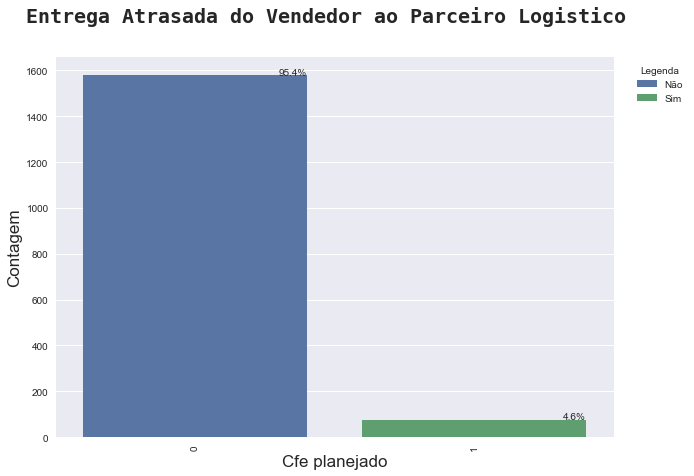

In [739]:
#features categoricas/binarias
display(df_abt['postagem_limiteparceiro_atrasado_moda'].value_counts())
mf.countplot_com_perc('postagem_limiteparceiro_atrasado_moda',df_abt,'Entrega Atrasada do Vendedor ao Parceiro Logistico','Cfe planejado','Legenda',['Não','Sim'])

0    1609
1      49
Name: entrega_estimado_atrasado_moda, dtype: int64

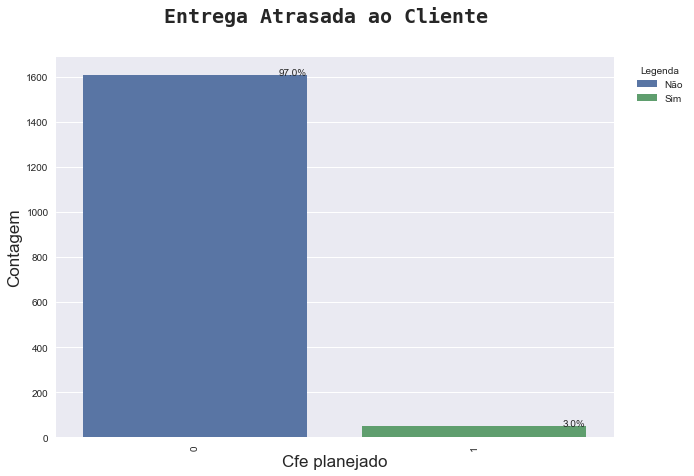

In [740]:
#features categoricas/binarias
display(df_abt['entrega_estimado_atrasado_moda'].value_counts())
mf.countplot_com_perc('entrega_estimado_atrasado_moda',df_abt,'Entrega Atrasada ao Cliente','Cfe planejado','Legenda',['Não','Sim'])


## <a class="anchor" id="analise">1.3 Análises Features</a>
[Retorna ao Indice](#etapas)

## <a class="anchor" id="univar">1.3.1 Univariadas</a>

## <a class="anchor" id="unicon">1.3.1.1 Continuas</a>

In [741]:
len(features_con)

40

In [742]:
df_estat_continuas['Assimetria'].value_counts()

Direita    39
Zero        1
Name: Assimetria, dtype: int64

In [743]:
"""
Praticamente todas estas features apresentam-se com assimetria à direita, ou seja, mediana menor que a média,
 (a maior parte dos nossos dados fica abaixo da média).
"""

'\nPraticamente todas estas features apresentam-se com assimetria à direita, ou seja, mediana menor que a média,\n (a maior parte dos nossos dados fica abaixo da média).\n'

In [744]:
df_estat_continuas['curtose'].value_counts()

leptocúrtica-cauda fina e pontiaguda    38
platicúrtica-cauda grossa e espessa      2
Name: curtose, dtype: int64

In [745]:
"""
leptocúrtica: apresenta menor dispersão em relação a platicúrtica

"""

'\nleptocúrtica: apresenta menor dispersão em relação a platicúrtica\n\n'

In [746]:
len(df_estat_continuas)

40

In [747]:
#features que apresentam grande variabilidade
len(df_estat_continuas[df_estat_continuas['std'] > df_estat_continuas['mean']][['feature']])

33

In [748]:
#um alto desvio padrão, indica que os dados estão espalhados por uma ampla gama de valores e mais afastados da média
#Features com desvio padrão menor que a média.
df_estat_continuas[~(df_estat_continuas['std'] > df_estat_continuas['mean'])][['feature','std','mean','Coeficiente_Variacao_%']].sort_values(by='Coeficiente_Variacao_%')


,feature,std,mean,Coeficiente_Variacao_%
plano_comissao,plano_comissao,0.01,0.21,5.0
vlr_frete_por_pedido_media,vlr_frete_por_pedido_media,13.67,23.05,59.0
velocidade_km_dias,velocidade_km_dias,36.44,51.22,71.0
distancia_cliente_vendedor_mediana,distancia_cliente_vendedor_mediana,431.80,550.97,78.0
razao_frete_preco,razao_frete_preco,0.25,0.27,93.0
vlr_medio_pedido,vlr_medio_pedido,170.43,175.59,97.0
adm_custos,adm_custos,473.90,482.51,98.0


In [749]:
#Com exceção da feature plano_comissao, as demais apresentam variação alta.
#São as mesmas features apontadas no item 1.2.1 Features Continuas.

In [750]:
#um alto desvio padrão, indica que os dados estão espalhados por uma ampla gama de valores e mais afastados da média
#Features com desvio padrão maior que a média.
df_estat_continuas[(df_estat_continuas['std'] > df_estat_continuas['mean'])][['feature','std','mean','Coeficiente_Variacao_%']].sort_values(by='Coeficiente_Variacao_%')


,feature,std,mean,Coeficiente_Variacao_%
habit_km2_mediana,habit_km2_mediana,2250.93,2138.17,105.0
Area(km2)_mediana,Area(km2)_mediana,1071.22,939.24,114.0
pedidos_por_dia_media,pedidos_por_dia_media,0.44,0.36,122.0
plano_valor,plano_valor,47.09,38.67,122.0
produto_volume_cm3_mediana,produto_volume_cm3_mediana,26376.57,16592.49,159.0
populacao_mediana,populacao_mediana,2659823.81,1523443.63,175.0
produto_peso_g_mediana,produto_peso_g_mediana,4247.73,2328.40,182.0
receitas,receitas,2188.85,940.82,233.0
frete_valor,frete_valor,1450.62,536.30,270.0
pagamento_valor_boleto,pagamento_valor_boleto,1840.57,666.95,276.0


In [751]:
#Apresentam variação muito alta.

In [752]:
len(features_con)

40

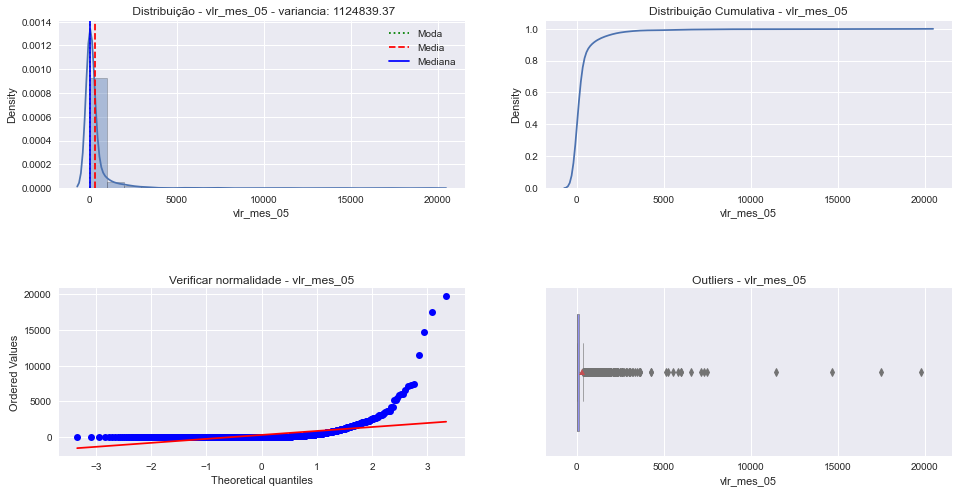

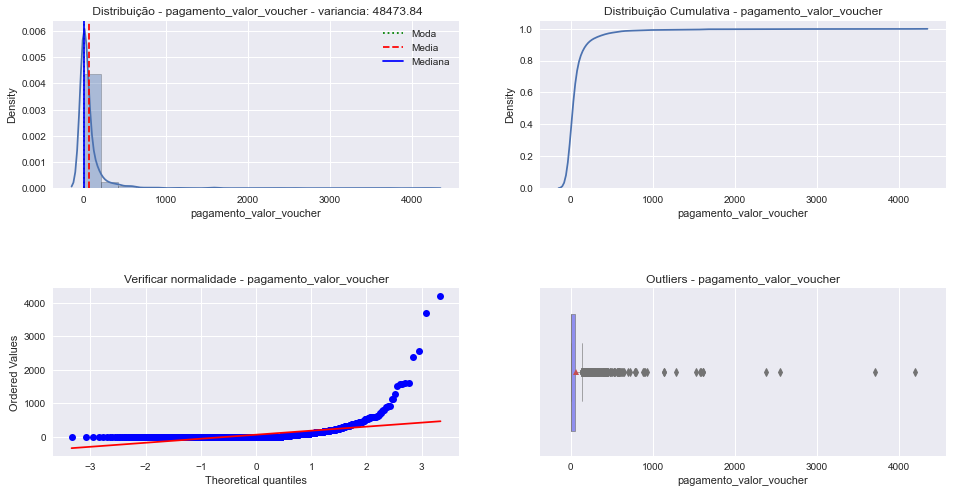

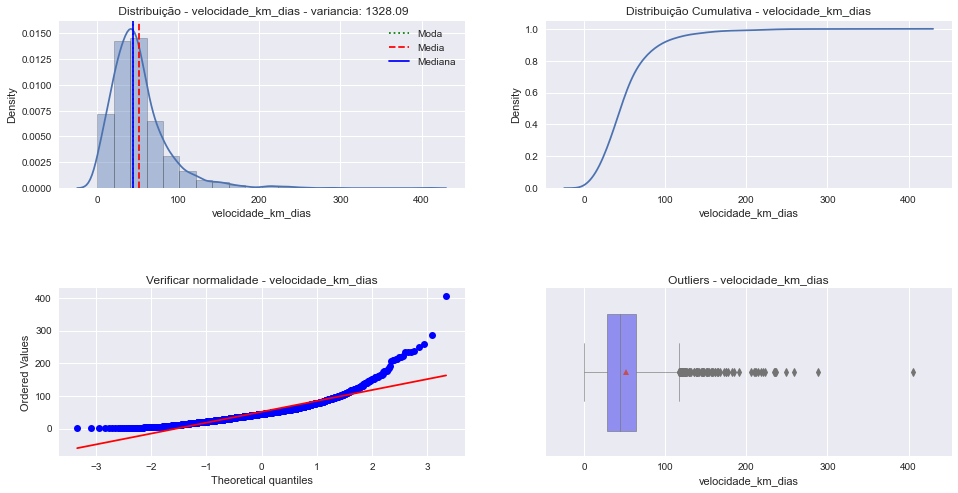

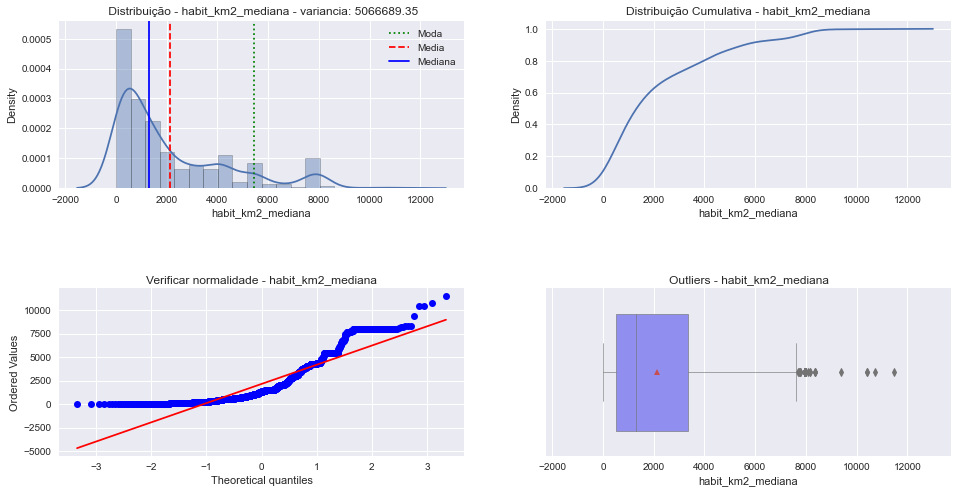

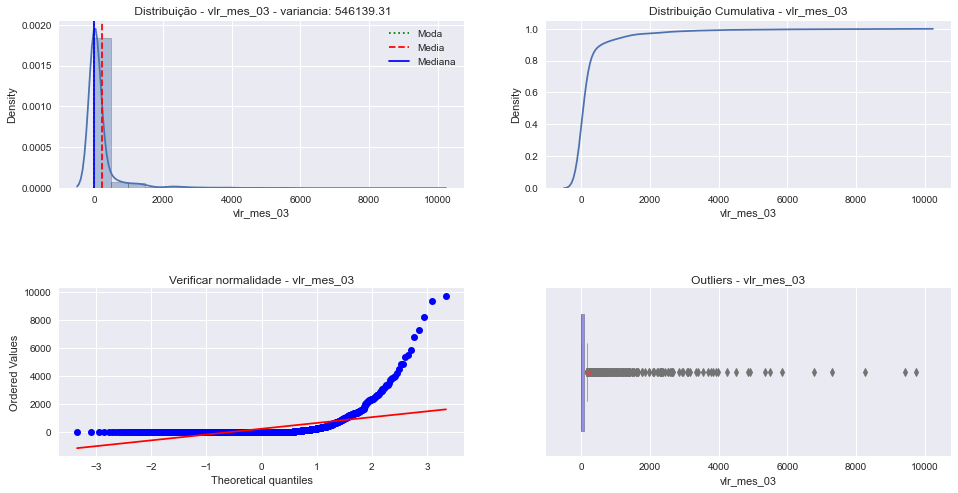

...

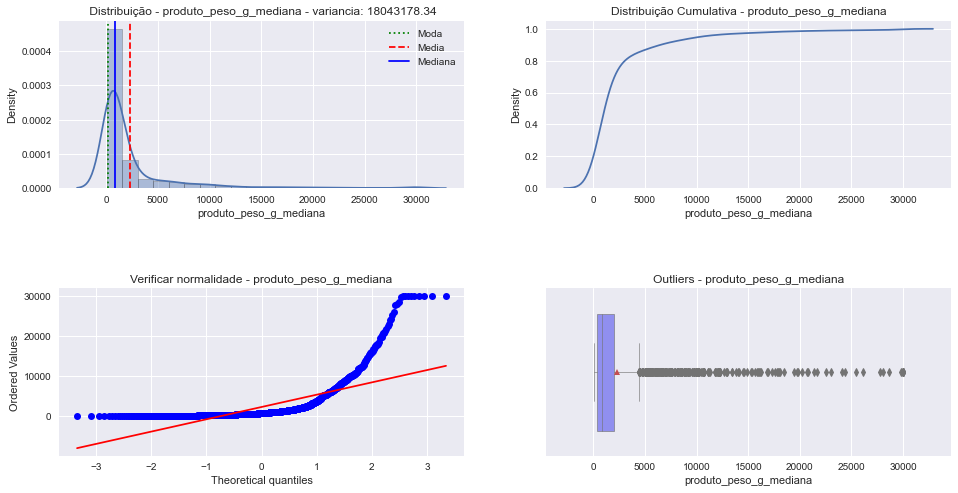

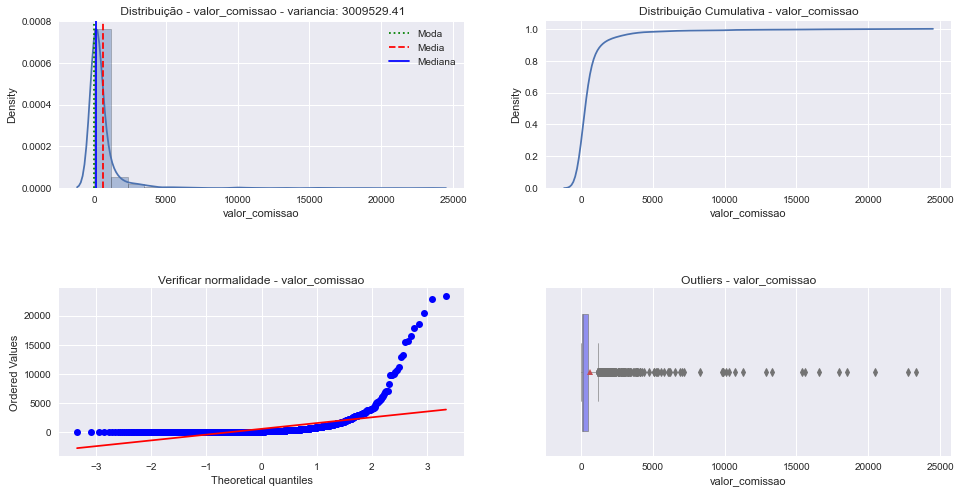

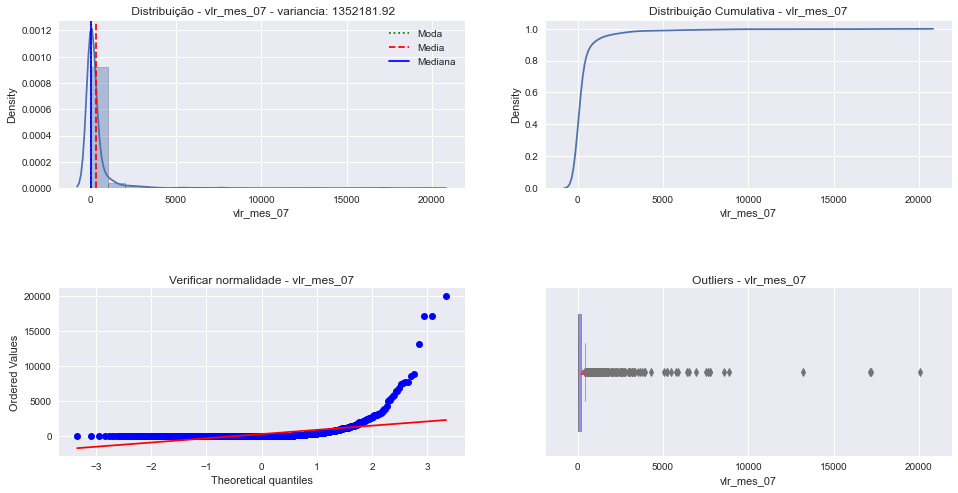

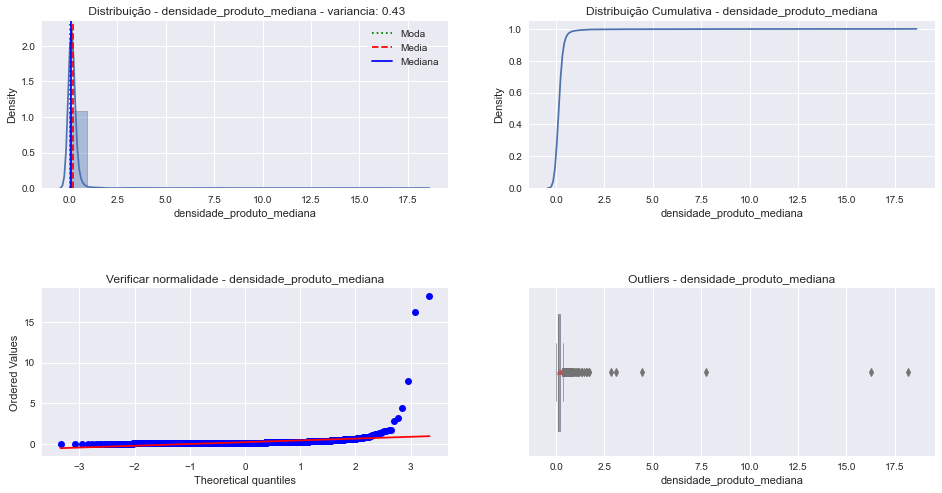

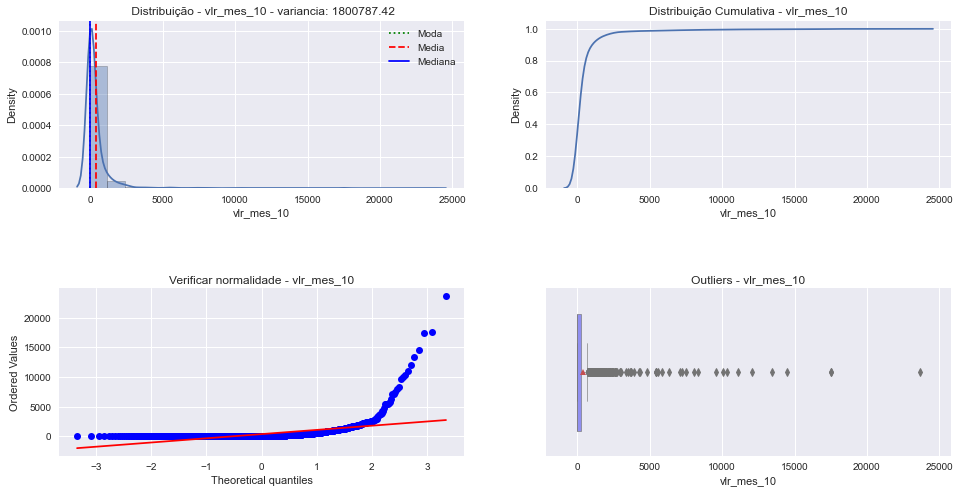

In [753]:
mf.visual_4(df_abt, features_con)

In [754]:
"""
Análises:


Distribuição cumulativa:
Acumula os valores das probabilidades
A forma depende da média e da variância:
Uma média menor desloca a curva para a esquerda. 
Uma média maior desloca a curva para a direita. 
A maiorr variância faz com que a curva mais íngreme e mais plana curva.

Além disto todas as features não seguem a normalidade Gaussiana.
Muito próximas(com alguns outliers):
-Lucro
-Pagamento_valor_voucher
-Velocidade_km_dias
-custo_reviews

Todas as features possuem outliers, mesmo tendo sido feito a eliminação cfe item 2.5 Análise e Tratamento dos Outliers no
notebook 01_Coleta_Processamento.ipynb.
De forma geral, os outliers estão influenciando em muito.


Destaques:
Baixa variancia:
-pedidos_por_dia_media
-razao_frete_preco
-densidade_produto_mediana
-plano_comissao

Analisando algumas distribuições cumulativas(probabilidade) que se destacam  das demais:

Com o gráfico de probabilidade acumulada, mesmo sem fazer o cálculo, podemos ver e estimar 
com bastante proximidade.

-lucro: 80% de probabilidade de um vendedor ter até no máximo R$ 300 de lucro em 2017.
-pedidos_por_dia: 90% de probabilidade de um vendedor ter até no máximo 1 pedido por dia.
-receitas: 80% de probabilidade de um vendedor ter até no máximo  R$ 1250 em 2017. 
-razao_frete_pedido: 90% de probabilidade de um vendedor ter até no máximo R$40.00 de frete por pedido.
-custo_frete: 90% de probabilidade de um vendedor de até no máximo R$500 de frete total no ano de 2017.
-distancia_cliente_vendedor_mediana:60% de probabilidade de um vendedor de até no máximo 500 km de distância de seus respectivos clientes.
-razao_frete_preco:80% de probabilidade de um vendedor de até no máximo 0.45, ou seja, quase a metade do preço é o frete.
-Area(km2)_mediana:80%  de probabilidade de um vendedor de até no máximo 1300km2 área do seu cliente.
-vlr_medio_pedido:80%  de probabilidade de um vendedor de até no máximo R$ 210 valor médio do pedido.
-habit_km2_mediana:80%  de probabilidade de um vendedor de até no máximo 4000 habitantes por km2 na cidade do seu cliente.
-adm_custos: 80% de probabilidade de um vendedoro ter o custo para a Olist de até no máximo R$ 800 no ano de 2017.
-velocidade_km_dias:80%  de probabilidade de um vendedor de até no máximo 80 km por dia para entrega do pedido.
-preco:80%  de probabilidade de um vendedor de até no máximo R$500 por suas mercadorias em 2017.
-produto_peso_g_mediana:80%  de probabilidade de um produto de até no máximo 3000gramas
-produto_volume_cm3_mediana:80%  de probabilidade de um produto de até no máximo 2500cm3 de volume.
-custo_reviews: 80%  de probabilidade de um vendedor de até no máximo R$ 180 no ano de 2017.
-preco_frete: 80%  de probabilidade de um vendedor de até no máximo R$ 5000 de vendas+frete no ano de 2017.
-valor_comissao: 80%  de probabilidade de um vendedor de até no máximo R$ 770 de comissão no ano de 2017.
-pedidos_por_dia_media: 80%  de probabilidade de um vendedor de até no máximo 1 pedido por dia em 2017.
"""

'\nAnálises:\n\n\nDistribuição cumulativa:\nAcumula os valores das probabilidades\nA forma depende da média e da variância:\nUma média menor desloca a curva para a esquerda. \nUma média maior desloca a curva para a direita. \nA maiorr variância faz com que a curva mais íngreme e mais plana curva.\n\nAlém disto todas as features não seguem a normalidade Gaussiana.\nMuito próximas(com alguns outliers):\n-Lucro\n-Pagamento_valor_voucher\n-Velocidade_km_dias\n-custo_reviews\n\nTodas as features possuem outliers, mesmo tendo sido feito a eliminação cfe item 2.5 Análise e Tratamento dos Outliers no\nnotebook 01_Coleta_Processamento.ipynb.\nDe forma geral, os outliers estão influenciando em muito.\n\n\nDestaques:\nBaixa variancia:\n-pedidos_por_dia_media\n-razao_frete_preco\n-densidade_produto_mediana\n-plano_comissao\n\nAnalisando algumas distribuições cumulativas(probabilidade) que se destacam  das demais:\n\nCom o gráfico de probabilidade acumulada, mesmo sem fazer o cálculo, podemos ver e

## <a class="anchor" id="unidis">1.3.1.2 Discretas</a>

In [755]:
len(features_dis)

62

In [756]:
df_estat_discretas['Assimetria'].value_counts()

Direita     58
Esquerda     3
Zero         1
Name: Assimetria, dtype: int64

In [757]:
df_estat_discretas['curtose'].value_counts()

leptocúrtica-cauda fina e pontiaguda    54
platicúrtica-cauda grossa e espessa      8
Name: curtose, dtype: int64

In [758]:
df_estat_discretas[df_estat_discretas['curtose'] == 'platicúrtica-cauda grossa e espessa']

,feature,count,mean,median,std,var,Coeficiente_Variacao_%,mod,min,25%,50%,75%,max,range,skew,Assimetria,kurtosis,curtose,NormalTeste,NormalTeste_p,Rejeitar H0,Teste_Kolmogorov,Teste_Kolmogorov_p,Rejeitar H0-Kolmogorov
meses_olist,meses_olist,1658.0,4.40,3.0,3.57,12.76,81.0,1,1.0,1.00,3.0,8.00,12.0,11.0,0.62,Direita,-1.11,platicúrtica-cauda grossa e espessa,755.577775,8.479510e-165,True,0.841345,0.0,True
dias_olist,dias_olist,1658.0,125.84,92.5,115.99,13453.16,92.0,1,1.0,14.00,92.5,231.00,356.0,355.0,0.51,Direita,-1.18,platicúrtica-cauda grossa e espessa,1180.911839,3.700431e-257,True,0.841345,0.0,True
qtd_pedidos_pontos,qtd_pedidos_pontos,1658.0,2.42,2.0,1.15,1.33,48.0,1,1.0,1.00,2.0,3.00,4.0,3.0,0.08,Direita,-1.44,platicúrtica-cauda grossa e espessa,14334.763362,0.000000e+00,True,0.841345,0.0,True
preco_pontos,preco_pontos,1658.0,2.50,2.5,1.12,1.25,45.0,1,1.0,1.25,2.5,3.75,4.0,3.0,0.00,Zero,-1.36,platicúrtica-cauda grossa e espessa,49075.684091,0.000000e+00,True,0.841345,0.0,True
review_score_pontos,review_score_pontos,1658.0,1.74,2.0,0.44,0.19,25.0,2,1.0,1.00,2.0,2.00,2.0,1.0,-1.11,Esquerda,-0.77,platicúrtica-cauda grossa e espessa,350.377800,8.249495e-77,True,0.841345,0.0,True
tempo_postagem_compra_pontos,tempo_postagem_compra_pontos,1658.0,2.73,3.0,1.12,1.25,41.0,4,1.0,2.00,3.0,4.00,4.0,3.0,-0.27,Esquerda,-1.31,platicúrtica-cauda grossa e espessa,5701.193557,0.000000e+00,True,0.841345,0.0,True
vendedor_pontuacao,vendedor_pontuacao,1658.0,2689.94,2324.0,1248.89,1559735.46,46.0,4424,1111.0,1221.00,2324.0,3424.00,4424.0,3313.0,0.08,Direita,-1.43,platicúrtica-cauda grossa e espessa,14903.094946,0.000000e+00,True,1.000000,0.0,True
vendedor_score,vendedor_score,1658.0,9.40,9.0,2.81,7.90,30.0,8,4.0,7.00,9.0,12.00,14.0,10.0,-0.09,Direita,-1.01,platicúrtica-cauda grossa e espessa,380.781745,2.062029e-83,True,0.999968,0.0,True


In [759]:
len(df_estat_discretas)

62

In [760]:
#features que apresentam grande variabilidade
len(df_estat_discretas[df_estat_discretas['std'] > df_estat_discretas['mean']][['feature']])


48

In [761]:
#um alto desvio padrão, indica que os dados estão espalhados por uma ampla gama de valores e mais afastados da média
#Features com desvio padrão menor que a média.
df_estat_discretas[~(df_estat_discretas['std'] > df_estat_discretas['mean'])][['feature','std','mean','Coeficiente_Variacao_%']].sort_values(by='Coeficiente_Variacao_%')


,feature,std,mean,Coeficiente_Variacao_%
review_score_pontos,review_score_pontos,0.44,1.74,25.0
tempo_estimado_compra_mediana,tempo_estimado_compra_mediana,6.48,24.53,26.0
review_score_moda,review_score_moda,1.19,4.42,27.0
vendedor_score,vendedor_score,2.81,9.40,30.0
qtd_itens_pedido_mediana,qtd_itens_pedido_mediana,0.42,1.05,40.0
tempo_postagem_compra_pontos,tempo_postagem_compra_pontos,1.12,2.73,41.0
preco_pontos,preco_pontos,1.12,2.50,45.0
vendedor_pontuacao,vendedor_pontuacao,1248.89,2689.94,46.0
qtd_pedidos_pontos,qtd_pedidos_pontos,1.15,2.42,48.0
tempo_entrega_compra_mediana,tempo_entrega_compra_mediana,7.71,11.89,65.0


In [762]:
#São as mesmas features apontadas no item 1.2.2 Features Discreta(exceção entrega_estimado_variacao_mediana).

#um alto desvio padrão, indica que os dados estão espalhados por uma ampla gama de valores e mais afastados da média
#Features com desvio padrão maior que a média.
df_estat_discretas[(df_estat_discretas['std'] > df_estat_discretas['mean'])][['feature','std','mean','Coeficiente_Variacao_%']].sort_values(by='Coeficiente_Variacao_%')


,feature,std,mean,Coeficiente_Variacao_%
postagem_limiteparceiro_variacao_mediana,postagem_limiteparceiro_variacao_mediana,4.29,-3.56,-121.0
entrega_estimado_variacao_mediana,entrega_estimado_variacao_mediana,8.45,-12.83,-66.0
dias_entre_pedidos,dias_entre_pedidos,15.85,12.82,124.0
tempo_postagem_compra_mediana,tempo_postagem_compra_mediana,4.35,3.10,140.0
tempo_postagem_aprovado_mediana,tempo_postagem_aprovado_mediana,4.32,2.65,163.0
qtd_clientes_capital,qtd_clientes_capital,24.88,9.38,265.0
qtd_clientes_fora_estado,qtd_clientes_fora_estado,45.63,17.16,266.0
"PIB_percapita_(51000,344847]","PIB_percapita_(51000,344847]",24.78,9.05,274.0
"PIB_percapita_(43000,51000]","PIB_percapita_(43000,51000]",8.67,3.15,275.0
"PIB_percapita_(35000,43000]","PIB_percapita_(35000,43000]",9.54,3.45,277.0


In [763]:
#Conferindo...com df_OPCD_2017_sem_outliers criado no notebook 01_Coleta_Processamento.ipynb
df_abt[df_abt['vendedor_id'] == 'ffeee66ac5d5a62fe688b9d26f83f534']

,vendedor_id,vendedor_cidade,vendedor_estado,vendedor_cidade_id,vendedor_estado_id,vendedor_grande_regiao_id,vendedor_grande_regiao_nome,review_score_moda,plano,plano_valor,plano_comissao,valor_taxa,valor_comissao,custo_frete,distancia_cliente_vendedor_mediana,qtd_clientes,qtd_clientes_repete,qtd_itens_pedido_mediana,preco,frete_valor,preco_frete,qtd_pedidos,qtd_produtos,produto_peso_g_mediana,produto_volume_cm3_mediana,densidade_produto_mediana,produto_categoria_nome_moda,produto_categoria_id_moda,Area(km2)_mediana,populacao_mediana,habit_km2_mediana,tempo_entrega_compra_mediana,tempo_aprovado_compra_mediana,tempo_estimado_compra_mediana,tempo_postagem_compra_mediana,tempo_entrega_aprovado_LeadTime_mediana,tempo_postagem_aprovado_mediana,tempo_entrega_postagem_mediana,postagem_limiteparceiro_variacao_mediana,postagem_limiteparceiro_dias_atraso_mediana,postagem_limiteparceiro_atrasado_moda,entrega_estimado_variacao_mediana,entrega_estimado_dias_atraso_mediana,entrega_estimado_atrasado_moda,qtd_pedidos_Nacional_Estadual_Comemorativa,qtd_clientes_capital,qtd_clientes_estado,"PIB_percapita_(11000,19000]","PIB_percapita_(19000,27000]","PIB_percapita_(27000,35000]","PIB_percapita_(3285,11000]","PIB_percapita_(35000,43000]","PIB_percapita_(43000,51000]","PIB_percapita_(51000,344847]",pagamento_tipo_boleto,pagamento_tipo_cartao_credito,pagamento_tipo_cartao_debito,pagamento_tipo_voucher,pagamento_parcelas_boleto,pagamento_parcelas_cartao_credito,pagamento_parcelas_cartao_debito,pagamento_parcelas_voucher,pagamento_sequencia_boleto,pagamento_sequencia_cartao_credito,pagamento_sequencia_cartao_debito,pagamento_sequencia_voucher,pagamento_valor_boleto,pagamento_valor_cartao_credito,pagamento_valor_cartao_debito,pagamento_valor_voucher,custo_reviews,qtd_clientes_fora_capital,qtd_clientes_fora_estado,qtd_mes_01,qtd_mes_02,qtd_mes_03,qtd_mes_04,qtd_mes_05,qtd_mes_06,qtd_mes_07,qtd_mes_08,qtd_mes_09,qtd_mes_10,qtd_mes_11,qtd_mes_12,vlr_mes_01,vlr_mes_02,vlr_mes_03,vlr_mes_04,vlr_mes_05,vlr_mes_06,vlr_mes_07,vlr_mes_08,vlr_mes_09,vlr_mes_10,vlr_mes_11,vlr_mes_12,meses_olist,dias_olist,qtd_pedidos_pontos,preco_pontos,review_score_pontos,tempo_postagem_compra_pontos,vendedor_pontuacao,vendedor_score,receitas,adm_custos,lucro,velocidade_km_dias,pedidos_por_dia_media,dias_entre_pedidos,vlr_medio_pedido,razao_frete_preco,vlr_frete_por_pedido_media
1655,ffeee66ac5d5a62fe688b9d26f83f534,mirassol,SP,3530300,35,3,Sudeste,5,Lite,18.99,0.21,0,258.3,144.89,449.138,9,9,1,1229.91,289.77,1519.68,9,9,7600.0,60000.0,0.13,eletrodomesticos,13,794.571,290769.012,738.59,16,0,23,4,16,2,11,-3,0,0,-10,0,0,0,3,5,0,1,0,0,2,1,5,2,7,0,0,2,18,0,0,2,7,0,0,328.52,1191.16,0.0,0.0,50,6,4,0,0,0,0,0,0,0,0,1,2,2,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,150.87,372.23,321.88,674.7,3,90,3,3,2,2,3322,10,315.27,399.55,-279.17,28.07,0.1,10,168.85,0.24,32.2


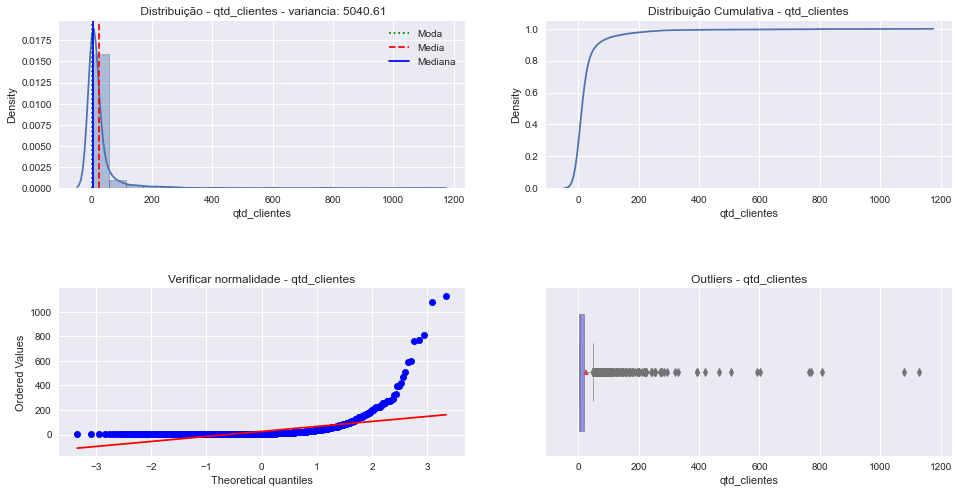

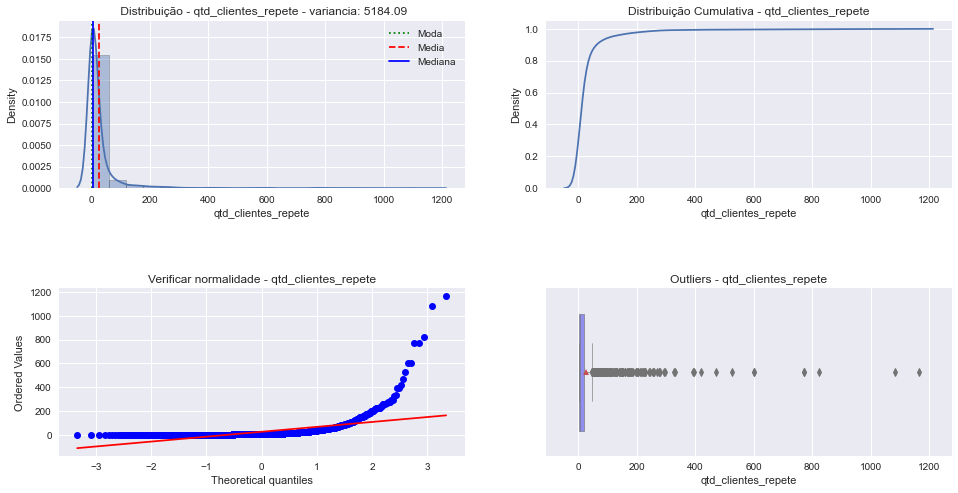

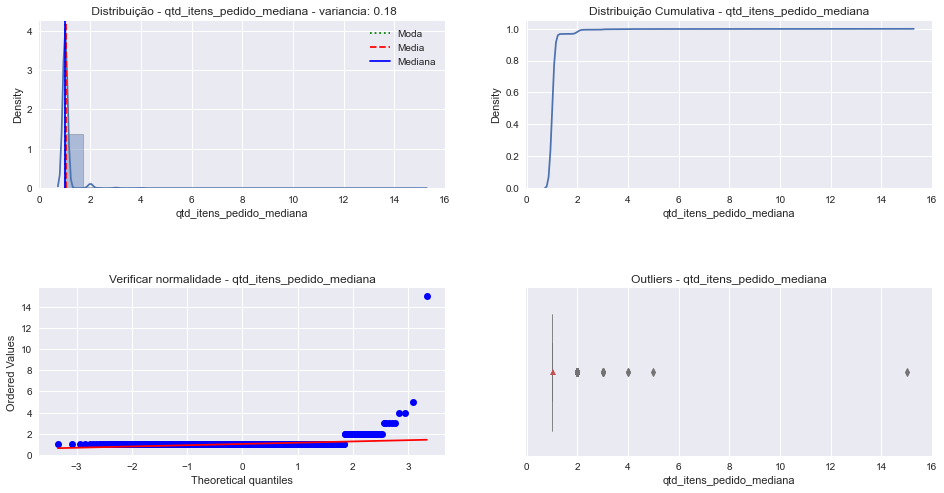

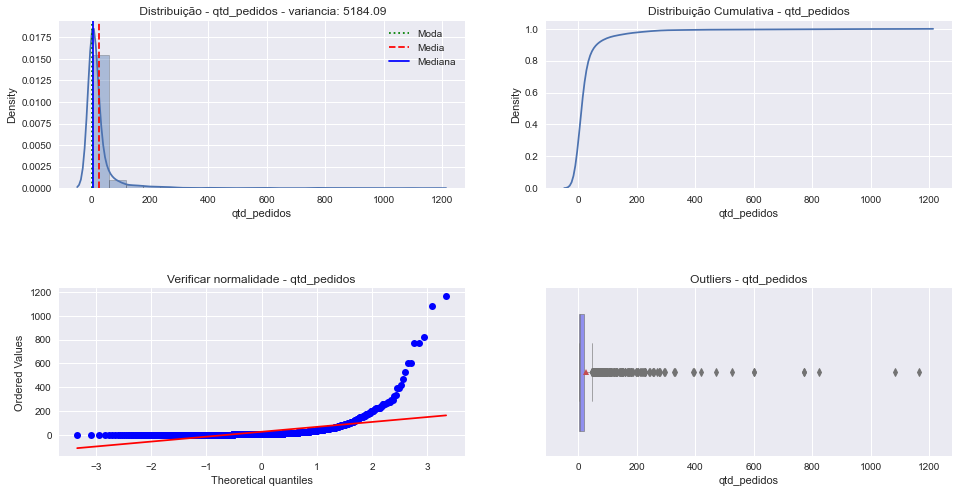

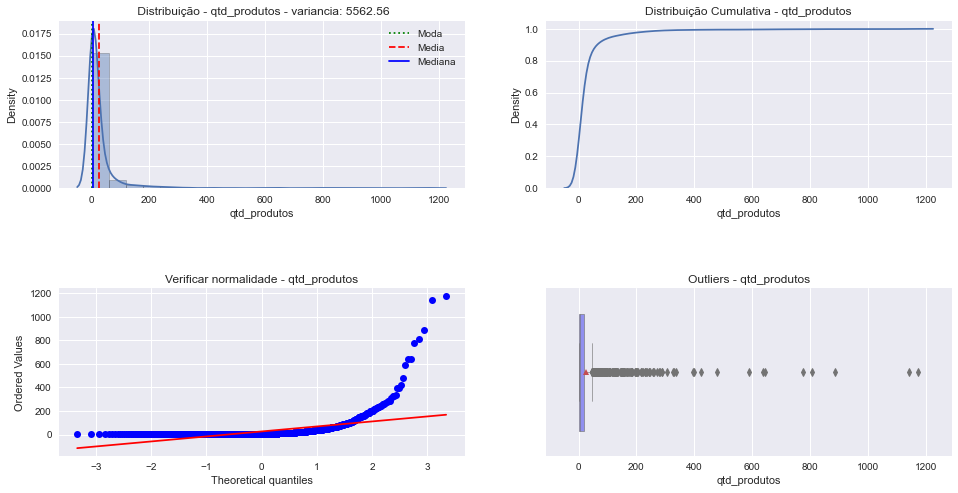

...

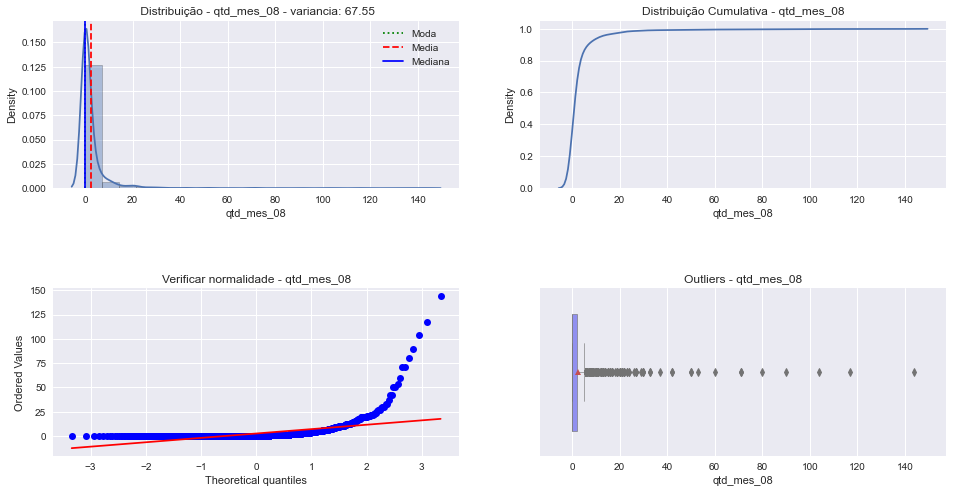

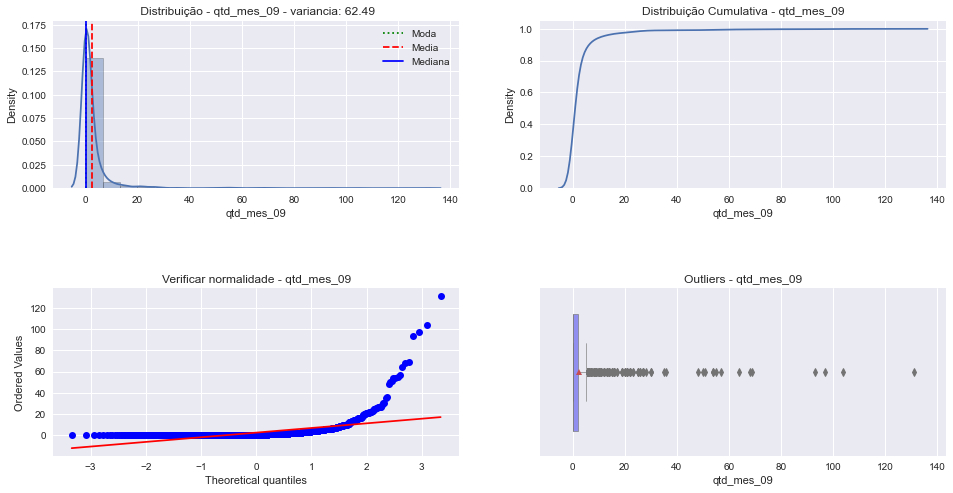

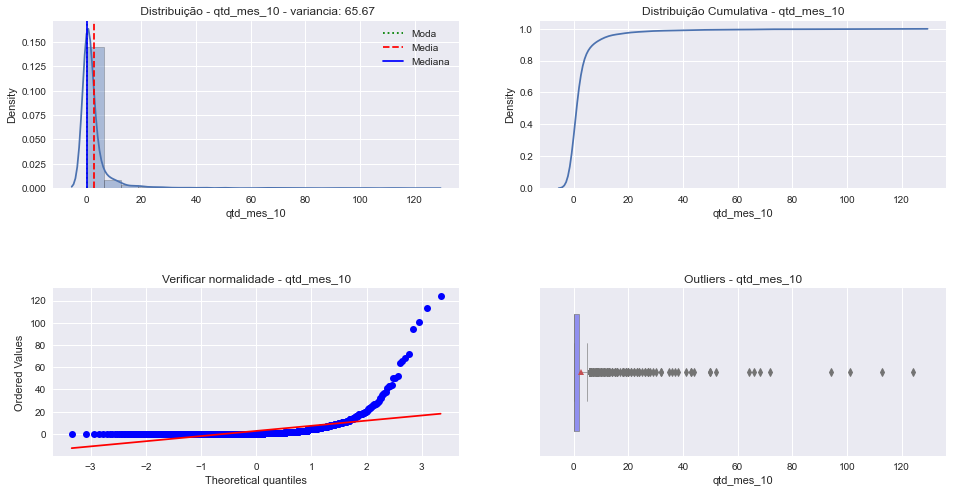

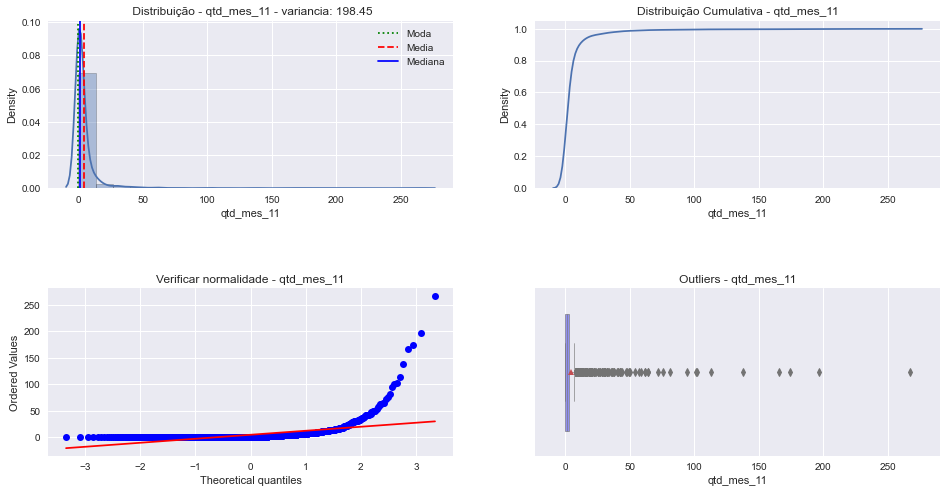

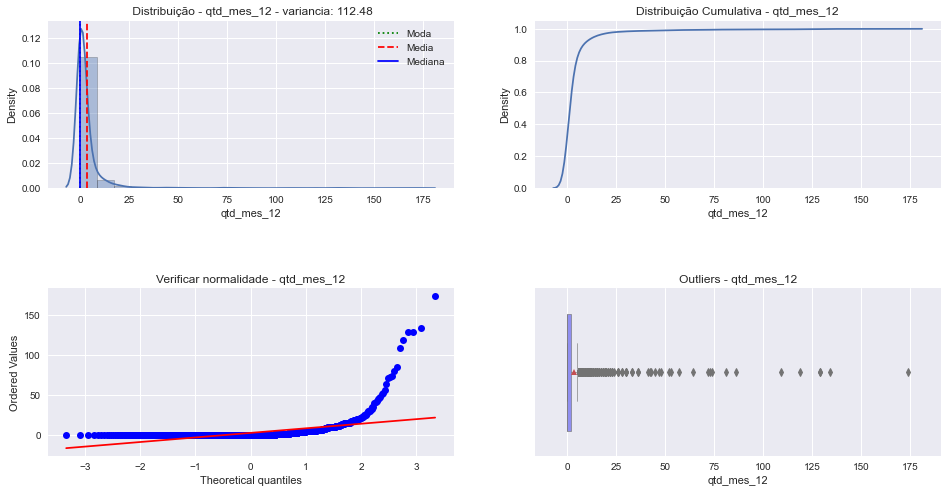

In [764]:
mf.visual_4(df_abt, features_dis)

In [765]:
"""
Não apresentam outliers:
-meses_olist
-dias_olist
-qtd_pedidos_pontos
-preco_pontos
-review_score_pontos
-tempo_postagem_compra_pontos
-vendedor_pontuação
-vendedor_score
Estas features tb têm curtose platicúrtica-cauda grossa e espessa, com dados mais dispersos.

As demais features apresentam muitos outliers e curtose leptocúrtica-cauda fina e pontiaguda

Além disto todas as features não seguem a normalidade Gaussiana.
Muito próximas(com alguns outliers):
-tempo_entrega_compra_mediana
-tempo_entrega_aprovado_leadtime_mediana
-tempo_entrega_postagem_mediana
-entrega_estimado_variacao_mediana
-entrega_estimado_dias_atraso_mediana

Todas as features possuem outliers, mesmo tendo sido feito a eliminação cfe item 2.5 Análise e Tratamento dos Outliers no
notebook 01_Coleta_Processamento.ipynb.
De forma geral, os outliers estão influenciando em muito.


Destaques:
Baixa variancia:
-qtd_itens_pedido_mediana
-tempo_aprovado_compra_mediana
-postagem_limiteparceiro_dias_atraso_mediana
-pagamento_tipo_cartao_debito
-pagamento_parcelas_cartao_debito
-pagamento_sequencia_cartao_debito
-qtd_pedidos_pontos
-preco_pontos
-review_score_pontos
-tempo_postagem_compra_pontos
-review_score_moda

Analisando algumas distribuições cumulativas(probabilidade) que se destacam  das demais:
-qtd_clientes: 80%  de probabilidade de um vendedor de até no máximo 35 clientes.
-qtd_clientes_repete: 80%  de probabilidade de um vendedor de até no máximo 17 clientes que realizaram nova compra.
-qtd_itens_pedido_mediana: 98%  de probabilidade de um vendedor de até no máximo 2 itens no pedido.
-qtd_pedidos: 80%  de probabilidade de um vendedor de até no máximo 17 pedidos em 2017.
-qtd_produtos: 80%  de probabilidade de um vendedor de até no máximo 20 produtos em 2017.
-tempo_entrega_compra_mediana: 80%  de probabilidade de um vendedor de até no máximo 13 dias para entregar o pedido desde a sua compra.
-tempo_aprovado_compra_mediana: 97%   de probabilidade de um vendedor de até no máximo 2 dias para aprovar o pedido.
-tempo_estimado_compra_mediana: 80%  de probabilidade de um vendedor de até no máximo 30 dias para realizar a entrega.
-tempo_postagem_compra_mediana: 80%  de probabilidade de um vendedor de até no máximo 5 dias para postar pedido.
-tempo_entrega_aprovado_LeadTime_mediana: 80%  de probabilidade de um vendedor de até no máximo 14 dias para entregar desde aprovação do pedido.
-tempo_postagem_aprovado_mediana: 80% de probabilidade de um vendedor de até no máximo 4 dias desde aprovação até a postagem.
-tempo_entrega_postagem_mediana: 80% de probabilidade de um vendedor de até no máximo 12 dias desde a postagem até a entrega do pedido.
-postagem_limiteparceiro_variacao_mediana: 80% de probabilidade de um vendedor de até no máximo 0.4 dias entre a postagem e a data limite entrega ao parceiro logistico
-postagem_limiteparceiro_dias_atraso_mediana: 80% de probabilidade de um vendedor de até no máximo 1 dia de atraso de entrega ao parceiro logistico.
-entrega_estimado_variacao_mediana: 80% de probabilidade de um vendedor de até no máximo 5 dias de variação entre a entrega e a estimação de data.
-entrega_estimado_dias_atraso_mediana: 80%  de probabilidade de um vendedor de até no máximo 0.25 dias.
-qtd_pedidos_NacionaL_Estadual_Comemorativas: 80% e probabilidade de um vendedor de até no máximo 2 pedidos feitos nestas datas referidas.
-qtd_cliente_capital: 80% e probabilidade de um vendedor de até no máximo 12 clientes na capital de seu estado.
-qtd_clientes_fora: 80% e probabilidade de um vendedor de até no máximo 7 clientes fora do seu estado.
-pagamento_parcelas_cartao_debito :  97% probabilidade de um vendedor de até no máximo 1 pedido pagos em parcelas com cartão de débito.              
-pagamento_parcelas_voucher :  80%  probabilidade de um vendedor de até no máximo 4 pedidos pagos em parcelas com voucher.                 
-pagamento_sequencia_boleto :  80% e probabilidade de um vendedor de até no máximo 6 pedidos pagos com sequencia via boleto                     
-pagamento_sequencia_cartao_credito : 80% de probabilidade de um vendedor de até no máximo 6 pedidos pagos com sequencia via cartão de crédito.              
-pagamento_sequencia_cartao_debito : 97% de probabilidade de um vendedor de até no máximo 1 pedido pago com sequencia via cartão de débito.                
-pagamento_sequencia_voucher :80% probabilidade de um vendedor de até no máximo 4 pedidos pagos com sequencia via voiucher. 
-meses_olist : 80% probabilidade de um vendedor de até no máximo 8 meses na Olist.                                   
-dias_olist: 80% probabilidade de um vendedor de até no máximo 250 dias.                                       
-qtd_pedidos_pontos: 80% probabilidade de um vendedor de até no máximo 3.8 pontos numa escala de 4  avaliação                            
-preco_pontos :  80% probabilidade de um vendedor de até no máximo 3.8 pontos numa escala de 4  avaliação                                   
-review_score_pontos:  80% probabilidade de um vendedor de até no máximo 2.05 pontos numa escala de 4  avaliação                            
-tempo_postagem_compra_pontos :   80% probabilidade de um vendedor de até no máximo 4 pontos numa escala de 4  avaliação                 
-vendedor_pontuacao :  80% probabilidade de um vendedor de até no máximo 4000 pontos numa escala de 4444.                            
-vendedor_score :    80% probabilidade de um vendedor de até no máximo 12 pontos numa escala de 16. 
-dias_entre_pedidos: 80% probabilidade de um vendedor de até no máximo 20 dias entre pedidos.
-review_score_pontos: 80% probabilidade de um vendedor de até no máximo 4.7 numa escala de 5.
-PIB_percapita_(11000,19000] : 80% probabilidade de um vendedor de até no máximo 4 clientes em cidades com PIB de R$11000 à R$ 19000.                   
-PIB_percapita_(19000,27000] : 80% probabilidade de um vendedor de até no máximo 3 clientes em cidades com PIB de R$11000 à R$ 19000.                      
-PIB_percapita_(27000,35000]:  80% probabilidade de um vendedor de até no máximo 5 clientes em cidades com PIB de R$11000 à R$ 19000.                      
-PIB_percapita_(3285,11000] :  80% probabilidade de um vendedor de até no máximo 5 clientes em cidades com PIB de R$11000 à R$ 19000.                       
-PIB_percapita_(35000,43000]:  80% probabilidade de um vendedor de até no máximo 4 clientes em cidades com PIB de R$11000 à R$ 19000.                       
-PIB_percapita_(43000,51000] : 80% probabilidade de um vendedor de até no máximo 4 clientes em cidades com PIB de R$11000 à R$ 19000.                       
-PIB_percapita_(51000,344847]: 80% probabilidade de um vendedor de até no máximo 13 clientes em cidades com PIB de R$11000 à R$ 19000.  
-pagamento_tipo_boleto :  80% probabilidade de um vendedor de até no máximo 5 pedidos   pagos com boletos.                      
-pagamento_tipo_cartao_credito : 80% probabilidade de um vendedor de até no máximo 5 pedidos   pagos com cartão de crédito.                   
-pagamento_tipo_cartao_debito :   97% probabilidade de um vendedor de até no máximo 1 pedido   pagos com cartão de débito.                 
-pagamento_tipo_voucher :80% probabilidade de um vendedor de até no máximo 2 pedidos   pagos com vouchers. 
-pagamento_parcelas_boleto :  80% probabilidade de um vendedor de até no máximo 4 pedidos pagos em parcelas com boleto.                      
-pagamento_parcelas_cartao_credito : 80% probabilidade de um vendedor de até no máximo 125 pedidos pagos em parcelas com cartão de crédito

"""

'\nNão apresentam outliers:\n-meses_olist\n-dias_olist\n-qtd_pedidos_pontos\n-preco_pontos\n-review_score_pontos\n-tempo_postagem_compra_pontos\n-vendedor_pontuação\n-vendedor_score\nEstas features tb têm curtose platicúrtica-cauda grossa e espessa, com dados mais dispersos.\n\nAs demais features apresentam muitos outliers e curtose leptocúrtica-cauda fina e pontiaguda\n\nAlém disto todas as features não seguem a normalidade Gaussiana.\nMuito próximas(com alguns outliers):\n-tempo_entrega_compra_mediana\n-tempo_entrega_aprovado_leadtime_mediana\n-tempo_entrega_postagem_mediana\n-entrega_estimado_variacao_mediana\n-entrega_estimado_dias_atraso_mediana\n\nTodas as features possuem outliers, mesmo tendo sido feito a eliminação cfe item 2.5 Análise e Tratamento dos Outliers no\nnotebook 01_Coleta_Processamento.ipynb.\nDe forma geral, os outliers estão influenciando em muito.\n\n\nDestaques:\nBaixa variancia:\n-qtd_itens_pedido_mediana\n-tempo_aprovado_compra_mediana\n-postagem_limiteparcei

## <a class="anchor" id="unicat">1.3.1.3 Categóricas</a>

In [766]:
len(features_cat2)

5

In [767]:
features_cat2

['produto_categoria_nome_moda',
 'plano',
 'vendedor_cidade',
 'vendedor_estado',
 'vendedor_grande_regiao_nome']

Sudeste         1218
Sul              368
Centro-oeste      43
Nordeste          26
Norte              3
Name: vendedor_grande_regiao_nome, dtype: int64

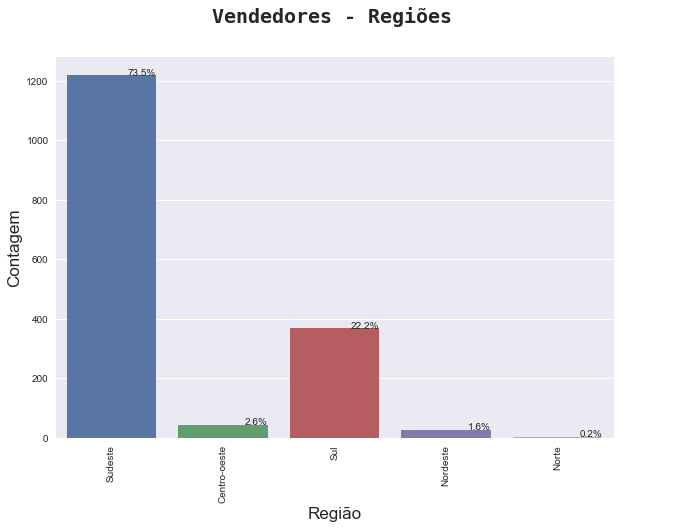

In [768]:
#features categoricas
display(df_abt['vendedor_grande_regiao_nome'].value_counts())
mf.countplot_com_perc('vendedor_grande_regiao_nome',df_abt,' Vendedores - Regiões','Região','   ',[]) 

SP    969
PR    205
MG    154
SC    104
RJ     89
RS     59
DF     21
GO     15
BA      9
ES      6
CE      5
PE      4
MS      4
MT      3
PB      3
RN      3
RO      2
SE      2
AM      1
Name: vendedor_estado, dtype: int64

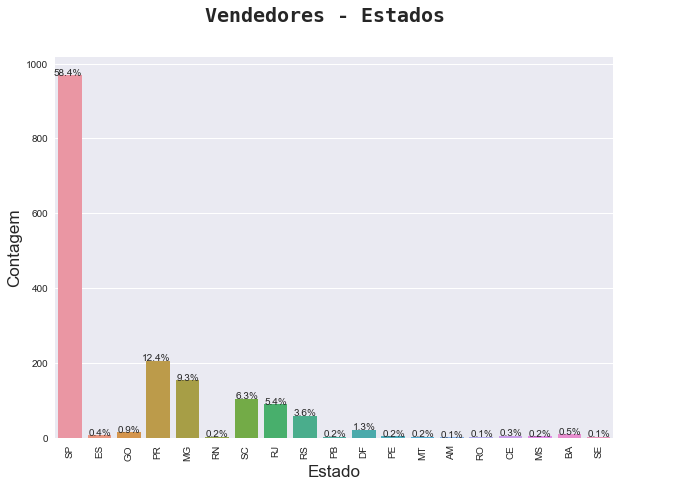

In [769]:
#features categoricas
display(df_abt['vendedor_estado'].value_counts())
mf.countplot_com_perc('vendedor_estado',df_abt,'Vendedores - Estados','Estado','   ',[]) 

In [770]:
df_abt['vendedor_cidade'].nunique()

386

In [771]:
#São 386 cidades dos vendedores.

In [772]:
#features categoricas
df_xx = df_abt['vendedor_cidade'].value_counts(normalize=True).round(3).to_frame()*100
df_xx.head(100)

,vendedor_cidade
sao paulo,22.8
curitiba,5.2
rio de janeiro,2.8
belo horizonte,2.7
ribeirao preto,1.9
ibitinga,1.6
campinas,1.5
santo andre,1.4
maringa,1.4
brasilia,1.3


Lite     1352
Pro       165
Basic     141
Name: plano, dtype: int64

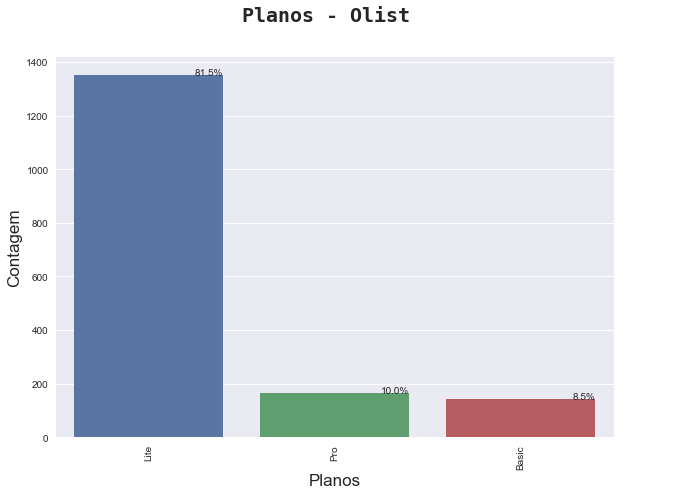

In [773]:
#features categoricas
display(df_abt['plano'].value_counts())
mf.countplot_com_perc('plano',df_abt,'Planos - Olist','Planos','   ',[]) 

esporte_lazer                       174
moveis_decoracao                    170
beleza_saude                        147
moda_beleza_perfumaria              135
utilidades_domesticas               111
brinquedos_e_bebes                  110
automotivo                           98
informatica_tablets                  89
Outros                               78
eletronicos_games_livros             68
ferramentas_jardim                   63
cool_stuff                           62
cama_mesa_banho                      62
telefonia                            44
construção_ferramentas               41
pet_shop                             33
papelaria                            29
instrumentos_musicais                23
eletroportateis                      22
alimentos_bebidas                    18
malas_acessorios                     18
eletrodomesticos                     14
climatizacao                         12
industria_comercio                    9
cine_foto_audio                       5


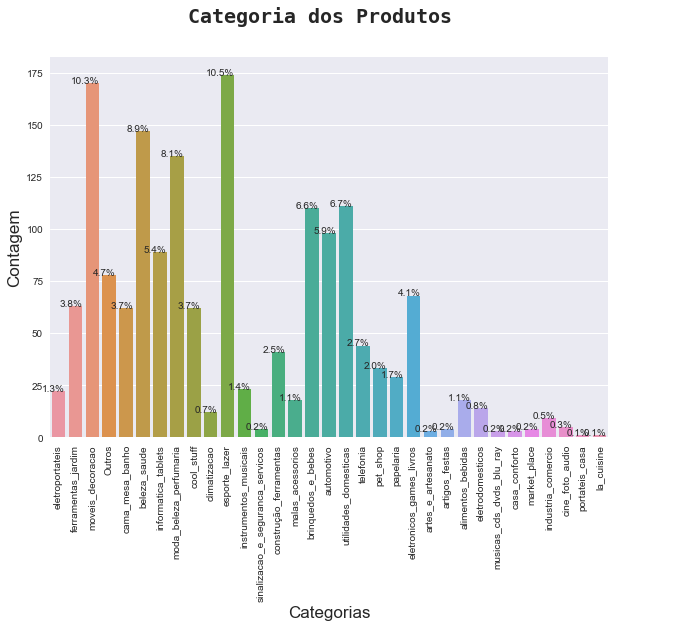

In [774]:
#features categoricas
display(df_abt['produto_categoria_nome_moda'].value_counts())
mf.countplot_com_perc('produto_categoria_nome_moda',df_abt,'Categoria dos Produtos','Categorias','   ',[]) 

In [775]:
"""
Categorias:
1º - esporte_lazer
2º - moveis_decoracao
3º - beleza_saude
4º - moda_beleza_perfumaria

"""

'\nCategorias:\n1º - esporte_lazer\n2º - moveis_decoracao\n3º - beleza_saude\n4º - moda_beleza_perfumaria\n\n'

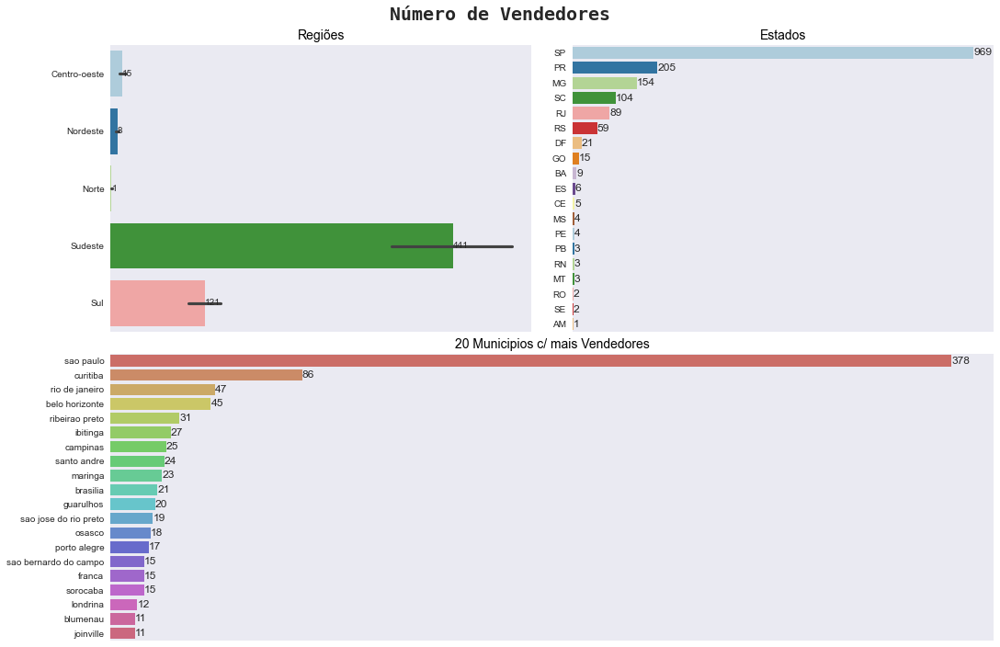

In [776]:
#Grafico numero de vendedores por: região, estado e 20 cidades com mais vendedores
lst=[1, 1, 1, 1, 1]
df_temp=pd.DataFrame({})
df_regioes_grupos=pd.DataFrame({})
for j in range(1,13):
    lst_new = [i * j for i in lst]
    df = pd.DataFrame(lst_new, columns = ['mes'])
    mes=str(j).zfill(2)
    mes_qtd='qtd_mes_'+mes
    mes_vlr='vlr_mes_'+mes
    mes_vendedor='vendedor_mes_'+mes
    df_aux=df_abt[df_abt[mes_vlr]>0].groupby('vendedor_grande_regiao_nome').agg({mes_vlr: ('sum'),mes_qtd: ('sum'),'vendedor_id':('count')}).reset_index()
    df_temp=pd.concat([df,df_aux],axis=1)
    df_temp.rename(columns={mes_qtd:'qtd_mes', mes_vlr:'vlr_mes'},inplace=True)
    if j == 1:
        df_regioes_grupos= df_temp
    else: 
        df_regioes_grupos=pd.concat([df_temp,df_regioes_grupos])
df_regioes_grupos.reset_index()

df_regioes_=df_regioes_grupos.groupby("mes").agg({"vendedor_id" : "sum"}).reset_index()

#Estados dos vendedores
vendedores_estados = df_abt.groupby("vendedor_estado").count()["vendedor_id"].reset_index().sort_values(by="vendedor_id",ascending=False)
vendedores_estados.rename(columns = {"vendedor_id":"total"}, inplace=True)

#20 Cidades c/ mais vendedores
vendedores_20_cidades = df_abt.groupby("vendedor_cidade").count()["vendedor_id"].reset_index().sort_values(by="vendedor_id",ascending=False).head(20)
vendedores_20_cidades.rename(columns = {"vendedor_id":"total"}, inplace=True)

plt.style.use('seaborn')
fig = plt.figure(constrained_layout=True, figsize=(15, 14))

# definicção axis
gs = gridspec.GridSpec(3, 2, figure=fig)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[1, :])

# Regiões dos  vendedores
sns.barplot(x="vendedor_id", y="vendedor_grande_regiao_nome", data=df_regioes_grupos, ax=ax1, palette="Paired")
ax1.set_title("Regiões", size=14, color='black')
ax1.set_xlabel("")
ax1.set_ylabel("")
for rect in ax1.patches:
    ax1.annotate('{:,.0f}'.format(rect.get_width()),(rect.get_width(),rect.get_y() + rect.get_height() / 2),
                xytext=(0, 0),textcoords='offset points', va='center', ha='left', size=10)
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.spines['left'].set_visible(False)
ax1.spines['bottom'].set_visible(False)
ax1.axes.get_xaxis().set_visible(False)

# Estados dos vendedores
sns.barplot(x="total", y="vendedor_estado", data=vendedores_estados, ax=ax2, palette="Paired")
ax2.set_title("Estados", size=14, color='black')
ax2.set_xlabel("")
ax2.set_ylabel("")
for rect in ax2.patches:
    ax2.annotate('{:,.0f}'.format(rect.get_width()),(rect.get_width(),rect.get_y() + rect.get_height() / 2),
                xytext=(0, 0),textcoords='offset points', va='center', ha='left', size=12)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.spines['left'].set_visible(False)
ax2.spines['bottom'].set_visible(False)
ax2.axes.get_xaxis().set_visible(False)

#20 Cidades c/ mais vendedores
sns.barplot(x="total", y="vendedor_cidade", data=vendedores_20_cidades, ax=ax3, palette='hls')
ax3.set_title("20 Municipios c/ mais Vendedores", size=14, color='black')
ax3.set_xlabel("")
ax3.set_ylabel("")
for rect in ax3.patches:
    ax3.annotate('{:,.0f}'.format(rect.get_width()),(rect.get_width(),rect.get_y() + rect.get_height() / 2),
                xytext=(0, 0),textcoords='offset points', va='center', ha='left', size=12)
ax3.spines['top'].set_visible(False)
ax3.spines['right'].set_visible(False)
ax3.spines['left'].set_visible(False)
ax3.spines['bottom'].set_visible(False)
ax3.axes.get_xaxis().set_visible(False) 

plt.suptitle("Número de Vendedores", fontsize = 20, fontname = 'monospace', weight = 'bold')
plt.show()

In [777]:
lst2=[]
df_temp=pd.DataFrame({})
df_regioes_grupos=pd.DataFrame({})
for j in range(1,13):
    mes=str(j).zfill(2)
    mes_qtd='qtd_mes_'+mes
    mes_vlr='vlr_mes_'+mes
    mes_vendedor='vendedor_mes_'+mes
    df_aux=df_abt[df_abt[mes_vlr]>0].groupby('vendedor_cidade').agg({mes_vlr: ('sum'),mes_qtd: ('sum'),'vendedor_id':('count')}).reset_index()
    tamanho=len(df_aux)
    lst2=[]
    for k in range(1,tamanho+1):
        lst2.append(j)
    df = pd.DataFrame(lst2, columns = ['mes'])
    df_temp=pd.concat([df,df_aux],axis=1)
    df_temp.rename(columns={mes_qtd:'qtd_mes', mes_vlr:'vlr_mes'},inplace=True)
    
    if j == 1:
        df_vendedores_grupos= df_temp
    else: 
        df_vendedores_grupos=pd.concat([df_temp,df_vendedores_grupos])
    
df_vendedores_grupos.reset_index()
df_vendedores_grupos['mes']= df_vendedores_grupos['mes'].astype('str')
df_vendedores_grupos['mes']= df_vendedores_grupos['mes'].apply(lambda x: x.zfill(2))


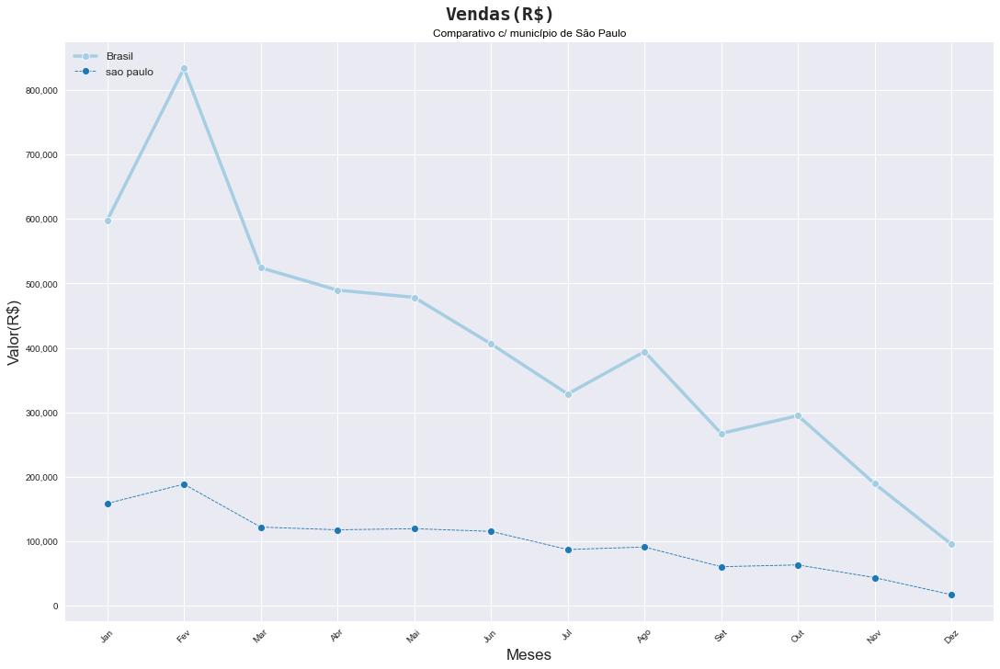

In [778]:
#Investigando a cidade de São Paulo...
df_vendedores_grupos['local'] = df_vendedores_grupos['vendedor_cidade'].apply(lambda x: x if x== 'sao paulo' else 'Brasil')
pay2=pd.DataFrame(df_vendedores_grupos['local'].unique()).rename(columns={0:'campo1'})
pay2=pd.DataFrame(df_vendedores_grupos['local'].unique()).rename(columns={0:'campo1'})
pay3 = df_vendedores_grupos.groupby(by=["mes","local"]).agg({"qtd_mes": "sum","vlr_mes":"sum"}).sort_values(by=['local', 'mes'], ascending=[True, False]).reset_index()

fig = plt.figure(constrained_layout=True, figsize=(15, 10))

# Axis definition
gs = gridspec.GridSpec(1, 1, figure=fig)
ax1 = fig.add_subplot(gs[0, 0])

sns.lineplot(x='mes', y='vlr_mes', data=pay3, ax=ax1, hue='local',legend=False,
             style='local', size='local', palette='Paired', marker='o',markersize=8)
ax1.legend(labels=pay2["campo1"], loc='upper left',fontsize=12)
ax1.set_title("Comparativo c/ município de São Paulo", size=12, color="black")
ax1.set_ylabel("Valor(R$)", fontsize=17)
ax1.set_xlabel("Meses", fontsize=17)
ax1.set_xticklabels(labels=lista_meses)
plt.setp(ax1.get_xticklabels(), rotation=45)
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))



plt.suptitle("Vendas(R$)", fontsize = 20, fontname = 'monospace', weight = 'bold')
plt.show()

## <a class="anchor" id="bivvar">1.3.2 Bivariadas</a>

In [779]:
#Vendas Mes a Mes-dataframe auxiliar
df_melt=df_abt[['vendedor_cidade','vlr_mes_01','vlr_mes_02','vlr_mes_03','vlr_mes_04','vlr_mes_05','vlr_mes_06',
            'vlr_mes_07','vlr_mes_08','vlr_mes_09','vlr_mes_10','vlr_mes_11','vlr_mes_12']]
df_cidades_meses=pd.melt(df_melt,id_vars=['vendedor_cidade'],var_name='mes',value_name='valor')
df_mes_a_mes=df_cidades_meses.groupby(['mes']).agg({'valor':'sum'}).reset_index()
df_mes_a_mes['mes_anterior'] = np.roll(df_mes_a_mes['valor'],1)
df_mes_a_mes['mes_anterior'].loc[0:0]=0
df_mes_a_mes['crescimento'] = (round((df_mes_a_mes['valor']/df_mes_a_mes['mes_anterior'])-1,3))*100
df_mes_a_mes['crescimento'].loc[0:0]=0
df_mes_a_mes['valor_1000']=df_mes_a_mes['valor']/1000

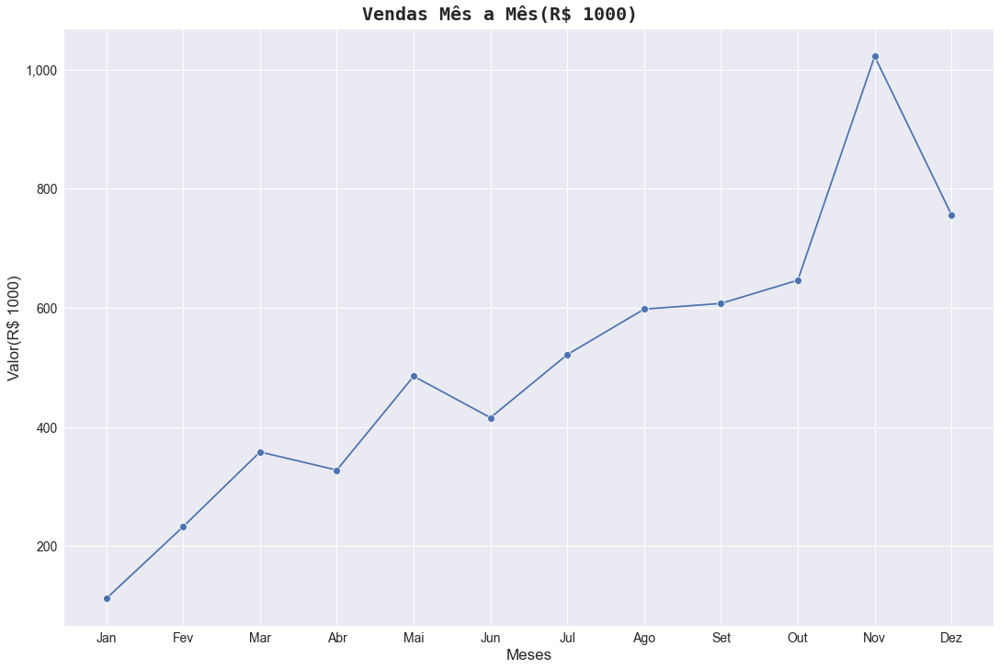

In [780]:
#Vendas mes a mes
fig = plt.figure(constrained_layout=True, figsize=(15, 10))
# definição eixo
gs = gridspec.GridSpec(1, 1, figure=fig)
ax1 = fig.add_subplot(gs[0, 0])

sns.lineplot(x='mes', y='valor_1000', data=df_mes_a_mes, ax=ax1, legend=False,
            palette='Paired', marker='o',markersize=8)

ax1.set_ylabel('Valor(R$ 1000)', fontsize = 17)
ax1.set_xlabel('Meses', fontsize = 17)
ax1.set_xticklabels(labels=lista_meses)
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.tick_params(axis="x", labelsize=14)
ax1.tick_params(axis="y", labelsize=14)
ax1.set_xticklabels(labels=lista_meses)
ax1.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))

plt.suptitle("Vendas Mês a Mês(R$ 1000)", fontsize = 20, fontname = 'monospace', weight = 'bold')
plt.show() 

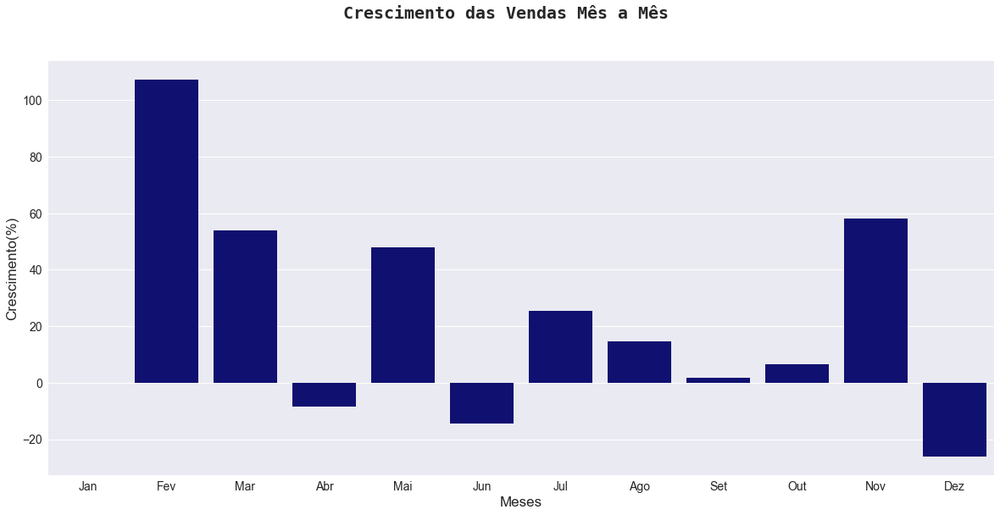

In [781]:
#Vendas Mes a Mes-crescimento
##plotando o grafico
df_mes_a_mes_p = df_mes_a_mes.drop(columns = ["valor", "mes_anterior"])
#df_mes_a_mes_p['mes'] = df_mes_a_mes_p.index
df_mes_a_mes_p.reset_index(drop=True, inplace=True)

plt.style.use('seaborn')
fig,ax = plt.subplots(1,1,figsize = (20,9))
sns.barplot(data=df_mes_a_mes_p, x='mes', y='crescimento', color='navy')

ax.set_xlabel('Meses', fontsize = 17)
ax.set_ylabel('Crescimento(%)', fontsize = 17)
ax.tick_params(axis="x", labelsize=14)
ax.tick_params(axis="y", labelsize=14)
ax.set_title('')  
#ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
ax.set_xticklabels(labels=lista_meses)

plt.suptitle('Crescimento das Vendas Mês a Mês', fontsize = 20, fontname = 'monospace', weight = 'bold')
plt.show()

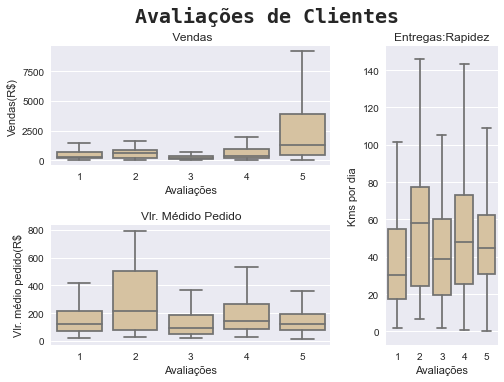

In [782]:
plt.style.use('seaborn')
fig = plt.figure(constrained_layout = True)
grid = gridspec.GridSpec(ncols = 3, nrows = 2, figure = fig)
ax1 = fig.add_subplot(grid[0, :2])
ax2 = fig.add_subplot(grid[1, :2])
ax3 = fig.add_subplot(grid[:, 2])

sns.boxplot(y = 'preco_frete',x='review_score_moda', data = df_abt, ax = ax1, color='#dfc498',showfliers=False)
ax1.set_title(' Vendas')    
ax1.set_ylabel('Vendas(R$)')
ax1.set_xlabel('Avaliações')

sns.boxplot(y = 'vlr_medio_pedido',x='review_score_moda', data = df_abt, ax = ax2, color = '#dfc498',showfliers=False)
ax2.set_title('Vlr. Médido Pedido')    
ax2.set_ylabel('Vlr. médio pedido(R$')
ax2.set_xlabel('Avaliações')

sns.boxplot(y = 'velocidade_km_dias',x='review_score_moda', data = df_abt, ax = ax3, color = '#dfc498',showfliers=False)
ax3.set_title('Entregas:Rapidez')    
ax3.set_ylabel('Kms por dia')
ax3.set_xlabel('Avaliações')

plt.subplots_adjust(hspace =0.5 , wspace = 0.5)
plt.suptitle('Avaliações de Clientes', fontsize = 20, fontname = 'monospace', weight = 'bold')
plt.show()

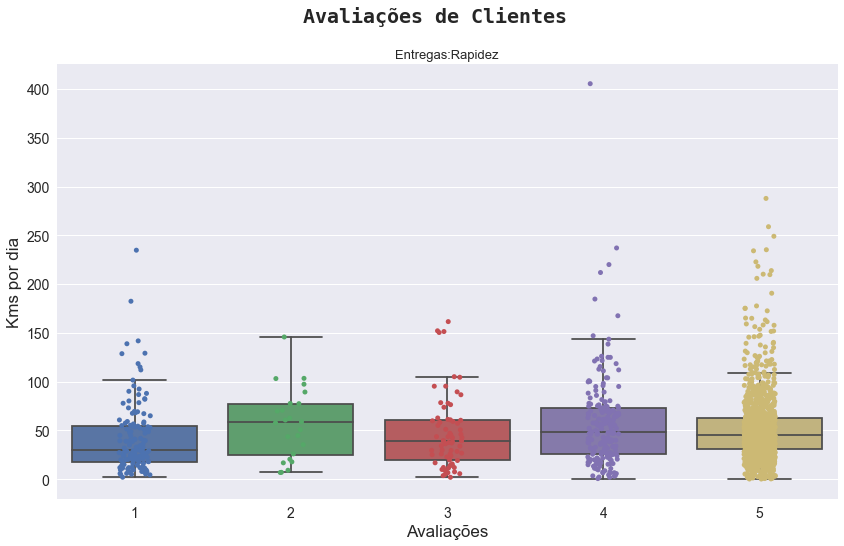

In [783]:
#Avaliando boxplot Entregas:Rapidez
plt.style.use('seaborn')
fig,ax = plt.subplots(1,1,figsize=(14, 8))
sns.boxplot(x='review_score_moda',y='velocidade_km_dias',data=df_abt,showfliers=False)
sns.stripplot(x='review_score_moda', y='velocidade_km_dias',data=df_abt)

ax.set_title('Entregas:Rapidez', fontsize = 13)
ax.set_xlabel('Avaliações', fontsize = 17)
ax.set_ylabel('Kms por dia', fontsize = 17)
ax.tick_params(axis="x", labelsize=14)
ax.tick_params(axis="y", labelsize=14)

plt.suptitle('Avaliações de Clientes', fontsize = 20, fontname = 'monospace', weight = 'bold')
plt.show()

In [784]:
"""
Analises:
Avaliação 5: -apresenta a maior qtd de outliers.Quanto mais alto for a feature kms por dia, mais rápido é a entrega.
             -maior concentração 
             -Variabilidade igual acima e abaixo da mediana.
             -Menor intervalo de variação(Q3-Q1)
             
Avaliação 4: -Variabilidade igual acima e abaixo da mediana.
             -Grande intervalo de variação(Q3-Q1)
             -Poucos outliers.
             
Avaliação 3: -Variabilidade igual acima e abaixo da mediana. 
             -Moderado intervalo de variação(Q3-Q1).
             -Poucos outliers.
             
Avaliação 2: -Maior mediana com assimetria negativa 
             -Pouca variabilidade nos 50% acima da mediana e alta variabilidade nos 50% abaixo.
             -Sem outliers.
             
Avaliação 1: -Menor mediana com assimetria positiva.
             -Baixa variabilidade nos 50% abaixo da mediana e alta variabilidade nos 50% acima.
             -Alguns outliers.
Insights:
Avaliação 5 predomina, para entregas mais rápidas.
Mesmo com avaliação muito baixa(1), foram feitas algumas entregas rapidas.
Avaliações 4 e 5 dominam p/ entregas mais rápidas.
  
"""

'\nAnalises:\nAvaliação 5: -apresenta a maior qtd de outliers.Quanto mais alto for a feature kms por dia, mais rápido é a entrega.\n             -maior concentração \n             -Variabilidade igual acima e abaixo da mediana.\n             -Menor intervalo de variação(Q3-Q1)\n             \nAvaliação 4: -Variabilidade igual acima e abaixo da mediana.\n             -Grande intervalo de variação(Q3-Q1)\n             -Poucos outliers.\n             \nAvaliação 3: -Variabilidade igual acima e abaixo da mediana. \n             -Moderado intervalo de variação(Q3-Q1).\n             -Poucos outliers.\n             \nAvaliação 2: -Maior mediana com assimetria negativa \n             -Pouca variabilidade nos 50% acima da mediana e alta variabilidade nos 50% abaixo.\n             -Sem outliers.\n             \nAvaliação 1: -Menor mediana com assimetria positiva.\n             -Baixa variabilidade nos 50% abaixo da mediana e alta variabilidade nos 50% acima.\n             -Alguns outliers.\nInsi

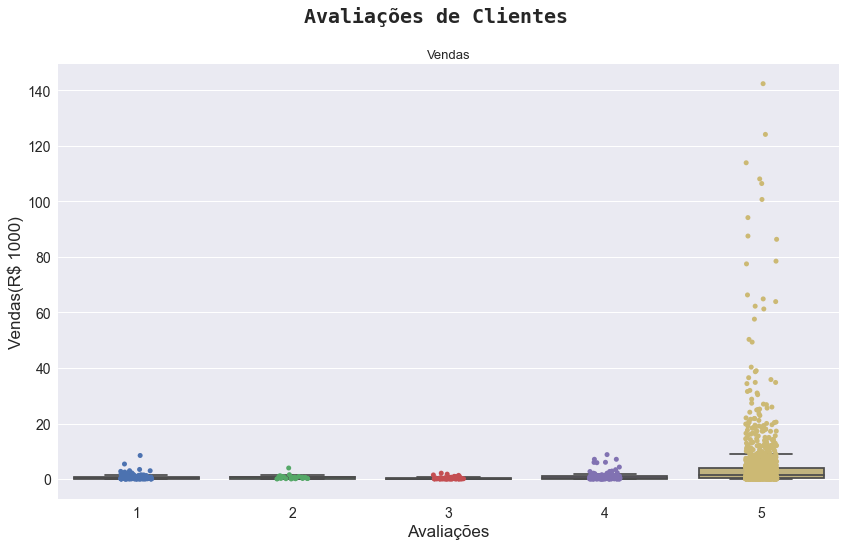

In [785]:
#Avaliando boxplot Vendas
df_aux=df_abt.copy(deep=True)
df_aux['preco_frete']=round(df_aux['preco_frete']/1000,2)
plt.style.use('seaborn')
fig,ax = plt.subplots(1,1,figsize=(14, 8))
sns.boxplot(x='review_score_moda',y='preco_frete',data=df_aux,showfliers=False)
sns.stripplot(x='review_score_moda', y='preco_frete',data=df_aux)

ax.set_title('Vendas', fontsize = 13)
ax.set_xlabel('Avaliações', fontsize = 17)
ax.set_ylabel('Vendas(R$ 1000)', fontsize = 17)
ax.tick_params(axis="x", labelsize=14)
ax.tick_params(axis="y", labelsize=14)

plt.suptitle('Avaliações de Clientes', fontsize = 20, fontname = 'monospace', weight = 'bold')
plt.show()

In [786]:
"""
Com exceção da avaliação 5, as demais avaliações têm baixo intervalo de variação.
Avaliação 5 predomina em vendas, inclusive em outliers(vendas com maior).
Avaliação 1  e 4 com baixas vendas.
"""

'\nCom exceção da avaliação 5, as demais avaliações têm baixo intervalo de variação.\nAvaliação 5 predomina em vendas, inclusive em outliers(vendas com maior).\nAvaliação 1  e 4 com baixas vendas.\n'

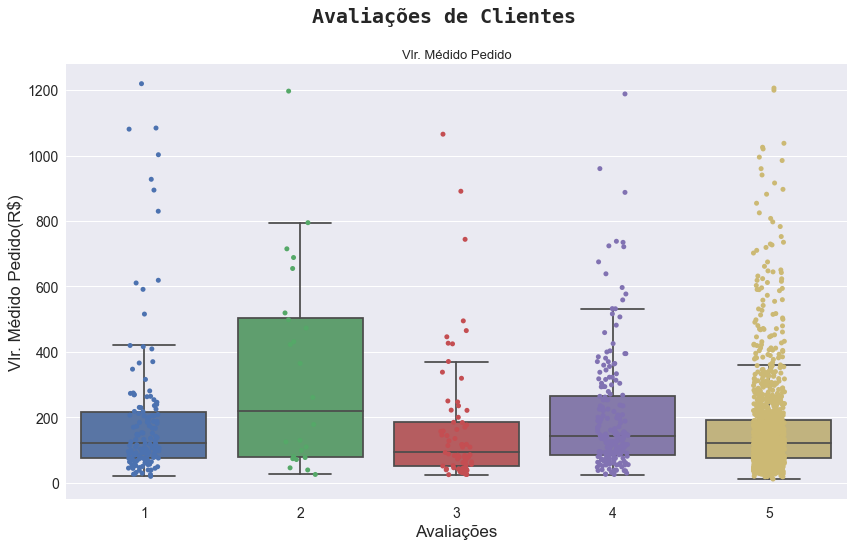

In [787]:
#Avaliando boxplot valor medio do pedido
plt.style.use('seaborn')
fig,ax = plt.subplots(1,1,figsize=(14, 8))
sns.boxplot(x='review_score_moda',y='vlr_medio_pedido',data=df_abt,showfliers=False)
sns.stripplot(x='review_score_moda', y='vlr_medio_pedido',data=df_abt)

ax.set_title('Vlr. Médido Pedido', fontsize = 13)
ax.set_xlabel('Avaliações', fontsize = 17)
ax.set_ylabel('Vlr. Médido Pedido(R$)', fontsize = 17)
ax.tick_params(axis="x", labelsize=14)
ax.tick_params(axis="y", labelsize=14)

plt.suptitle('Avaliações de Clientes', fontsize = 20, fontname = 'monospace', weight = 'bold')
plt.show()

In [788]:
"""
Analises:

Avaliação 5: -apresenta a maior qtd de outliers.Valor médio do pedido maior.
             -maior concentração 
             -Variabilidade quase igual acima e abaixo da mediana.
             -Menor intervalo de variação(Q3-Q1)

Avaliação 4: -alguns outliers.Assimetria positiva.
             -Baixa variabilidade nos 50% abaixo da mediana e alta variabilidade nos 50% acima.
             -Segundo maior intervalo de variação(Q3-Q1)
             
Avaliação 3: -Bem poucos outliers.Assimetria positiva.
             -Baixa variabilidade nos 50% abaixo da mediana e alta variabilidade nos 50% acima.
             
Avaliação 2: -Sem outliers.Assimetria positiva.
             -Baixa variabilidade nos 50% abaixo da mediana e alta variabilidade nos 50% acima.
             -Concentração quase total até o Q3.
             -Maior intervalo de variação(Q3-Q1)
             
Avaliação 1: -Com outliers.Assimetria positiva.
             -Baixa variabilidade nos 50% abaixo da mediana e alta variabilidade nos 50% acima.
Insights:

Avaliação 5 domina em qtd e valores médios dos pedidos.
Avaliação 4 vale destacar. 
Avaliação 2 tem o maior intervalo de variação.
"""

'\nAnalises:\n\nAvaliação 5: -apresenta a maior qtd de outliers.Valor médio do pedido maior.\n             -maior concentração \n             -Variabilidade quase igual acima e abaixo da mediana.\n             -Menor intervalo de variação(Q3-Q1)\n\nAvaliação 4: -alguns outliers.Assimetria positiva.\n             -Baixa variabilidade nos 50% abaixo da mediana e alta variabilidade nos 50% acima.\n             -Segundo maior intervalo de variação(Q3-Q1)\n             \nAvaliação 3: -Bem poucos outliers.Assimetria positiva.\n             -Baixa variabilidade nos 50% abaixo da mediana e alta variabilidade nos 50% acima.\n             \nAvaliação 2: -Sem outliers.Assimetria positiva.\n             -Baixa variabilidade nos 50% abaixo da mediana e alta variabilidade nos 50% acima.\n             -Concentração quase total até o Q3.\n             -Maior intervalo de variação(Q3-Q1)\n             \nAvaliação 1: -Com outliers.Assimetria positiva.\n             -Baixa variabilidade nos 50% abaixo da

## <a class="anchor" id="multivar">1.3.3 Multivariadas</a>

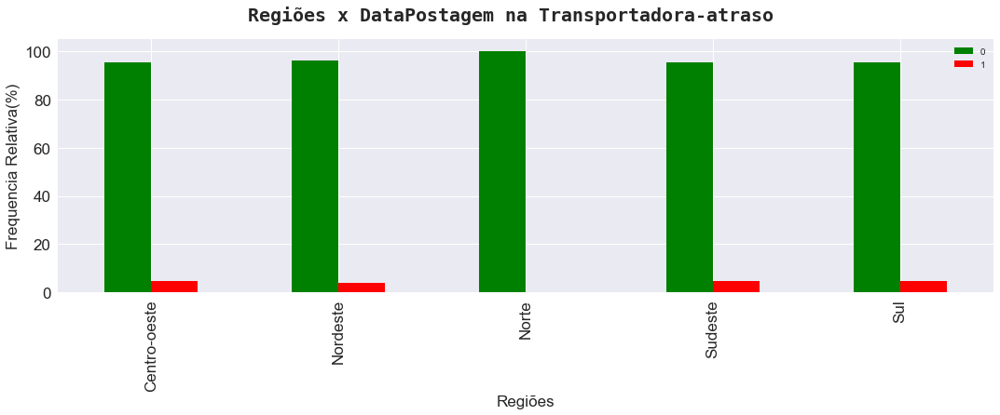

In [789]:
mf.analise_multivariada(df_abt.vendedor_grande_regiao_nome, 'Regiões x DataPostagem na Transportadora-atraso','Regiões',df_abt.postagem_limiteparceiro_atrasado_moda)


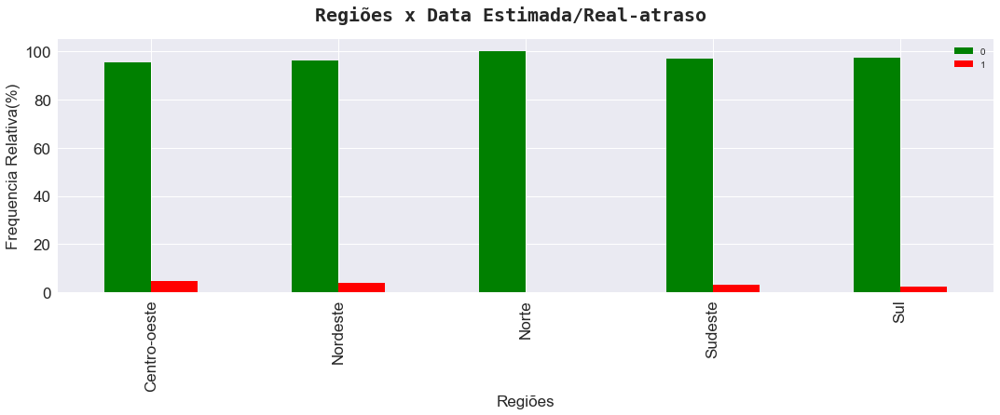

In [790]:
mf.analise_multivariada(df_abt.vendedor_grande_regiao_nome, 'Regiões x Data Estimada/Real-atraso','Regiões',df_abt.entrega_estimado_atrasado_moda)


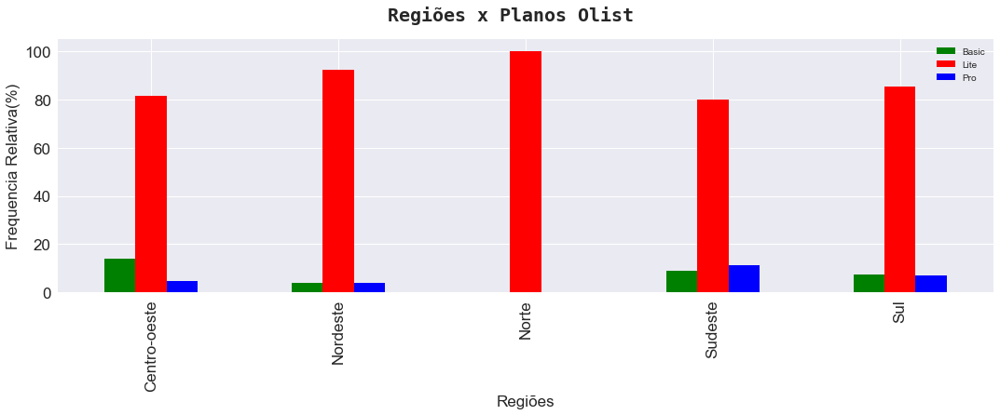

In [791]:
mf.analise_multivariada(df_abt.vendedor_grande_regiao_nome, 'Regiões x Planos Olist','Regiões',df_abt.plano)


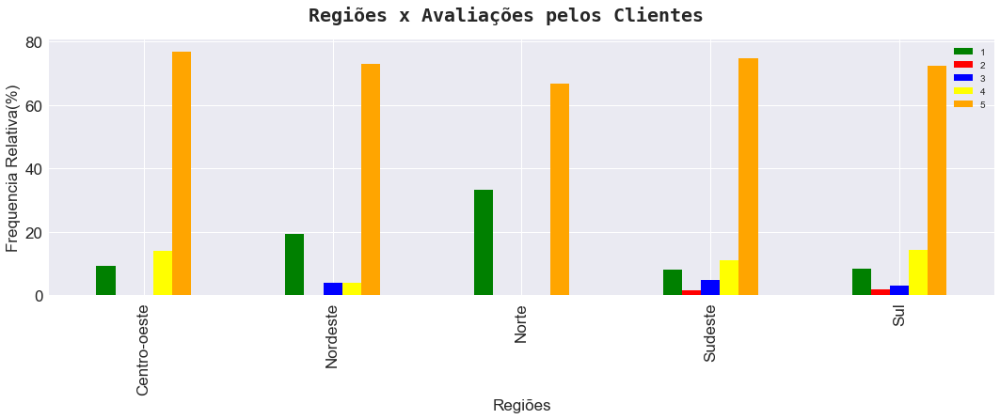

In [792]:
mf.analise_multivariada(df_abt.vendedor_grande_regiao_nome, 'Regiões x Avaliações pelos Clientes','Regiões',df_abt.review_score_moda)

,vendedor_cidade,vendedor_id,preco_frete
0,sao paulo,378,1185035.15
1,ibitinga,27,389034.93
2,curitiba,86,210829.82
3,rio de janeiro,47,177096.06
4,santo andre,24,144004.19
5,sao jose do rio preto,19,133199.95
6,barueri,9,131044.16
7,itaquaquecetuba,6,126878.16
8,ribeirao preto,31,125727.65
9,lauro de freitas,1,113896.84


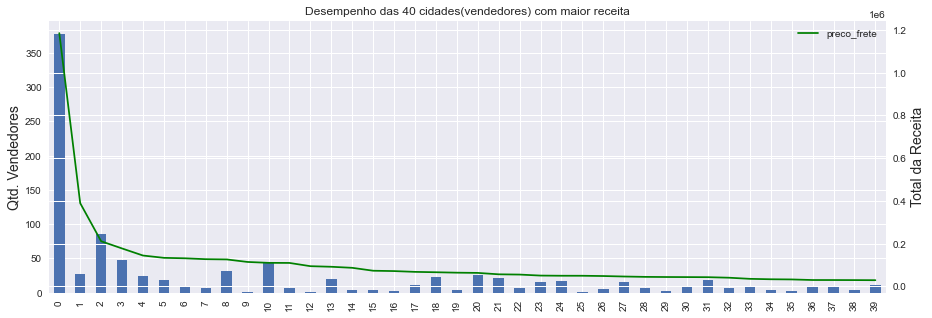

In [793]:
df_aux = df_abt.groupby("vendedor_cidade")[['vendedor_id','preco_frete']].agg({'vendedor_id':'nunique','preco_frete':'sum'}).sort_values("preco_frete", ascending=False).reset_index()

#Legenda cidades onde de 0 À 39
display(df_aux.head(40))
plt.style.use('seaborn')
ax = df_aux['vendedor_id'].head(40).plot(kind='bar', figsize=(15,5),stacked=True,title='Desempenho das 40 cidades(vendedores) com maior receita')
plt.ylabel("Qtd. Vendedores", size=14)
df_aux['preco_frete'].head(40).plot(kind='line', figsize=(15,5), ax = ax.twinx(), color='green')
plt.ylabel("Total da Receita", size=14)
plt.legend()


In [794]:
"""
A feature preco_frete é a soma do valor do pedido e o frete correspondente.
A cidade de São Paulo tem a maior qtd de vendedores(378) disparados em relação à Curitiba(86).
Vale destacar Belo Horizonte com 45 e Rio de Janeiro com 47.
Ibitinga com 27 vendedores, mas com a segunda melhor receita(R$ 389.034,93), se destaca, mesmo porque não é capital.

"""

'\nA feature preco_frete é a soma do valor do pedido e o frete correspondente.\nA cidade de São Paulo tem a maior qtd de vendedores(378) disparados em relação à Curitiba(86).\nVale destacar Belo Horizonte com 45 e Rio de Janeiro com 47.\nIbitinga com 27 vendedores, mas com a segunda melhor receita(R$ 389.034,93), se destaca, mesmo porque não é capital.\n\n'

In [795]:
df_abt

,vendedor_id,vendedor_cidade,vendedor_estado,vendedor_cidade_id,vendedor_estado_id,vendedor_grande_regiao_id,vendedor_grande_regiao_nome,review_score_moda,plano,plano_valor,plano_comissao,valor_taxa,valor_comissao,custo_frete,distancia_cliente_vendedor_mediana,qtd_clientes,qtd_clientes_repete,qtd_itens_pedido_mediana,preco,frete_valor,preco_frete,qtd_pedidos,qtd_produtos,produto_peso_g_mediana,produto_volume_cm3_mediana,densidade_produto_mediana,produto_categoria_nome_moda,produto_categoria_id_moda,Area(km2)_mediana,populacao_mediana,habit_km2_mediana,tempo_entrega_compra_mediana,tempo_aprovado_compra_mediana,tempo_estimado_compra_mediana,tempo_postagem_compra_mediana,tempo_entrega_aprovado_LeadTime_mediana,tempo_postagem_aprovado_mediana,tempo_entrega_postagem_mediana,postagem_limiteparceiro_variacao_mediana,postagem_limiteparceiro_dias_atraso_mediana,postagem_limiteparceiro_atrasado_moda,entrega_estimado_variacao_mediana,entrega_estimado_dias_atraso_mediana,entrega_estimado_atrasado_moda,qtd_pedidos_Nacional_Estadual_Comemorativa,qtd_clientes_capital,qtd_clientes_estado,"PIB_percapita_(11000,19000]","PIB_percapita_(19000,27000]","PIB_percapita_(27000,35000]","PIB_percapita_(3285,11000]","PIB_percapita_(35000,43000]","PIB_percapita_(43000,51000]","PIB_percapita_(51000,344847]",pagamento_tipo_boleto,pagamento_tipo_cartao_credito,pagamento_tipo_cartao_debito,pagamento_tipo_voucher,pagamento_parcelas_boleto,pagamento_parcelas_cartao_credito,pagamento_parcelas_cartao_debito,pagamento_parcelas_voucher,pagamento_sequencia_boleto,pagamento_sequencia_cartao_credito,pagamento_sequencia_cartao_debito,pagamento_sequencia_voucher,pagamento_valor_boleto,pagamento_valor_cartao_credito,pagamento_valor_cartao_debito,pagamento_valor_voucher,custo_reviews,qtd_clientes_fora_capital,qtd_clientes_fora_estado,qtd_mes_01,qtd_mes_02,qtd_mes_03,qtd_mes_04,qtd_mes_05,qtd_mes_06,qtd_mes_07,qtd_mes_08,qtd_mes_09,qtd_mes_10,qtd_mes_11,qtd_mes_12,vlr_mes_01,vlr_mes_02,vlr_mes_03,vlr_mes_04,vlr_mes_05,vlr_mes_06,vlr_mes_07,vlr_mes_08,vlr_mes_09,vlr_mes_10,vlr_mes_11,vlr_mes_12,meses_olist,dias_olist,qtd_pedidos_pontos,preco_pontos,review_score_pontos,tempo_postagem_compra_pontos,vendedor_pontuacao,vendedor_score,receitas,adm_custos,lucro,velocidade_km_dias,pedidos_por_dia_media,dias_entre_pedidos,vlr_medio_pedido,razao_frete_preco,vlr_frete_por_pedido_media
0,0015a82c2db000af6aaaf3ae2ecb0532,santo andre,SP,3547809,35,3,Sudeste,5,Lite,18.99,0.21,0,563.85,31.53,687.8890,3,3,1,2685.00,63.06,2748.06,3,3,11800.0,61920.0,0.190,eletroportateis,15,1234.5370,92386.002,33.480,10,0,24,2,9,1,7,-5,0,0,-13,0,0,1,0,0,1,0,1,0,1,0,0,0,3,0,0,0,22,0,0,0,3,0,0,0.00,2748.06,0.0,0.00,40,3,3,0,0,0,0,0,0,0,0,1,2,0,0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,916.02,1832.04,0.00,0.00,1,21,2,4,2,3,2423,11,582.84,230.68,280.63,76.43,0.142857,7,916.02,0.02,21.02
1,001cca7ae9ae17fb1caed9dfb1094831,cariacica,ES,3201308,32,3,Sudeste,5,Pro,173.99,0.19,25,3868.42,3399.56,735.3060,166,166,1,20360.23,6963.92,27324.15,166,167,9000.0,19656.0,0.460,ferramentas_jardim,17,520.8070,402027.039,1465.140,10,0,25,2,10,1,8,-5,0,0,-14,0,0,10,60,5,15,36,15,4,25,21,50,38,127,0,2,38,533,0,3,38,127,0,3,6434.32,20761.86,0.0,213.94,1285,106,161,0,5,10,12,23,21,21,11,11,22,18,12,0.00,1295.40,1594.08,1952.31,3616.97,2980.17,3536.03,1709.54,2223.27,3625.65,2968.72,1822.01,11,326,4,4,2,3,4423,13,5807.31,1715.94,-593.19,73.53,0.509202,2,164.60,0.34,41.95
2,002100f778ceb8431b7a1020ff7ab48f,franca,SP,3516200,35,3,Sudeste,5,Basic,68.99,0.20,210,156.36,0.00,353.5575,38,38,1,781.80,593.53,1375.33,38,42,300.0,9600.0,0.030,moveis_decoracao,26,539.7165,399307.051,843.435,13,0,22,4,13,3,9,-3,0,0,-9,0,0,4,12,18,4,7,1,1,4,8,13,16,20,0,5,16,35,0,5,16,20,0,5,611.49,677.63,0.0,139.68,305,26,20,0,0,0,0,0,0,0,0,3,9,11,15,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,98.25,367.30,445.78,464.00,3,105,4,3,2,2,4322,11,573.33,820.99,-552.66,27.20,0.361905,3,36.19,0.76,15.62
3,003554e2dce176b5555353e4f3555ac8,goiania,GO,5208707,52,5,Centro-oes

In [796]:
#Investigando, então, Ibitinga...
df_abt[df_abt['vendedor_cidade'] == 'ibitinga'].sort_values(by='preco_frete',ascending=False)

,vendedor_id,vendedor_cidade,vendedor_estado,vendedor_cidade_id,vendedor_estado_id,vendedor_grande_regiao_id,vendedor_grande_regiao_nome,review_score_moda,plano,plano_valor,plano_comissao,valor_taxa,valor_comissao,custo_frete,distancia_cliente_vendedor_mediana,qtd_clientes,qtd_clientes_repete,qtd_itens_pedido_mediana,preco,frete_valor,preco_frete,qtd_pedidos,qtd_produtos,produto_peso_g_mediana,produto_volume_cm3_mediana,densidade_produto_mediana,produto_categoria_nome_moda,produto_categoria_id_moda,Area(km2)_mediana,populacao_mediana,habit_km2_mediana,tempo_entrega_compra_mediana,tempo_aprovado_compra_mediana,tempo_estimado_compra_mediana,tempo_postagem_compra_mediana,tempo_entrega_aprovado_LeadTime_mediana,tempo_postagem_aprovado_mediana,tempo_entrega_postagem_mediana,postagem_limiteparceiro_variacao_mediana,postagem_limiteparceiro_dias_atraso_mediana,postagem_limiteparceiro_atrasado_moda,entrega_estimado_variacao_mediana,entrega_estimado_dias_atraso_mediana,entrega_estimado_atrasado_moda,qtd_pedidos_Nacional_Estadual_Comemorativa,qtd_clientes_capital,qtd_clientes_estado,"PIB_percapita_(11000,19000]","PIB_percapita_(19000,27000]","PIB_percapita_(27000,35000]","PIB_percapita_(3285,11000]","PIB_percapita_(35000,43000]","PIB_percapita_(43000,51000]","PIB_percapita_(51000,344847]",pagamento_tipo_boleto,pagamento_tipo_cartao_credito,pagamento_tipo_cartao_debito,pagamento_tipo_voucher,pagamento_parcelas_boleto,pagamento_parcelas_cartao_credito,pagamento_parcelas_cartao_debito,pagamento_parcelas_voucher,pagamento_sequencia_boleto,pagamento_sequencia_cartao_credito,pagamento_sequencia_cartao_debito,pagamento_sequencia_voucher,pagamento_valor_boleto,pagamento_valor_cartao_credito,pagamento_valor_cartao_debito,pagamento_valor_voucher,custo_reviews,qtd_clientes_fora_capital,qtd_clientes_fora_estado,qtd_mes_01,qtd_mes_02,qtd_mes_03,qtd_mes_04,qtd_mes_05,qtd_mes_06,qtd_mes_07,qtd_mes_08,qtd_mes_09,qtd_mes_10,qtd_mes_11,qtd_mes_12,vlr_mes_01,vlr_mes_02,vlr_mes_03,vlr_mes_04,vlr_mes_05,vlr_mes_06,vlr_mes_07,vlr_mes_08,vlr_mes_09,vlr_mes_10,vlr_mes_11,vlr_mes_12,meses_olist,dias_olist,qtd_pedidos_pontos,preco_pontos,review_score_pontos,tempo_postagem_compra_pontos,vendedor_pontuacao,vendedor_score,receitas,adm_custos,lucro,velocidade_km_dias,pedidos_por_dia_media,dias_entre_pedidos,vlr_medio_pedido,razao_frete_preco,vlr_frete_por_pedido_media
485,4a3ca9315b744ce9f8e9374361493884,ibitinga,SP,3519600,35,3,Sudeste,5,Pro,173.99,0.19,1490,23327.25,7557.09,427.5755,1079,1085,1,122779.72,19598.24,142377.96,1085,1142,1383.0,21200.0,0.070,cama_mesa_banho,7,662.5560,3.631400e+05,917.790,12,0,22,2,11,2,8,-3,0,0,-10,0,0,101,353,478,124,149,137,27,149,124,375,197,867,2,49,197,4149,2,101,197,868,2,101,24814.96,121146.24,114.96,4198.31,10740,732,607,23,11,59,73,118,90,129,117,97,113,174,81,2375.19,1396.14,7292.62,8549.23,14666.89,11007.26,17162.79,17290.77,13427.76,14483.53,24400.43,10325.35,12,355,4,4,2,3,4423,13,26905.13,4386.95,4221.09,38.87,3.056338,1,131.22,0.16,18.06
1341,cca3071e3e9bb7d12640c9fbe2301306,ibitinga,SP,3519600,35,3,Sudeste,5,Pro,173.99,0.19,1895,10294.72,3104.48,391.4410,591,601,1,54185.78,12124.07,66309.85,601,643,835.0,6300.0,0.170,moveis_decoracao,26,601.1900,3.606571e+05,1125.980,12,0,27,3,11,2,8,-5,0,0,-15,0,0,34,197,270,62,90,76,20,77,71,205,105,484,2,22,105,1963,2,43,105,486,2,43,10911.30,56908.75,126.63,1528.08,5685,404,331,45,56,58,35,43,34,75,71,54,44,62,24,5363.81,5703.10,6781.12,4453.66,5231.37,3027.14,8591.65,7137.21,5748.56,5426.79,6335.27,2510.17,11,339,4,4,2,2,4422,12,14103.61,3265.01,2049.12,35.59,1.772861,1,110.33,0.22,20.17
381,391fc6631aebcf3004804e51b40bcf1e,ibitinga,SP,3519600,35,3,Sudeste,5,Pro,173.99,0.19,1055,4121.71,986.93,369.6830,273,275,1,21694.01,5304.71,26998.72,275,287,950.0,8866.0,0.110,moveis_decoracao,26,529.4470,4.178691e+05,1048.220,13,0,22,3,12,2,8,-4,0,0,-11,0,0,19,87,130,23,37,31,9,29,42,104,43,229,2,11,43,834,2,11,43,229,2,11,5538.30,22604.65,74.76,582.51,2040,188,145,0,13,24,16,20,23,34,30,23,19

In [797]:
"""
O vendedor 4a3ca9315b744ce9f8e9374361493884 tem 1079 clientes, 1085 que retornam a comprar, com preço+frete R$ 142.377,96 e
com uma média de 3 pedidos por dia.
O segundo vendedor cca3071e3e9bb7d12640c9fbe2301306 tem 591 clientes, 601 que retornam a comprar, com preço+fete R$ 66.309,85 e
com uma média de 2 pedidos por dia.

"""

'\nO vendedor 4a3ca9315b744ce9f8e9374361493884 tem 1079 clientes, 1085 que retornam a comprar, com preço+frete R$ 142.377,96 e\ncom uma média de 3 pedidos por dia.\nO segundo vendedor cca3071e3e9bb7d12640c9fbe2301306 tem 591 clientes, 601 que retornam a comprar, com preço+fete R$ 66.309,85 e\ncom uma média de 2 pedidos por dia.\n\n'

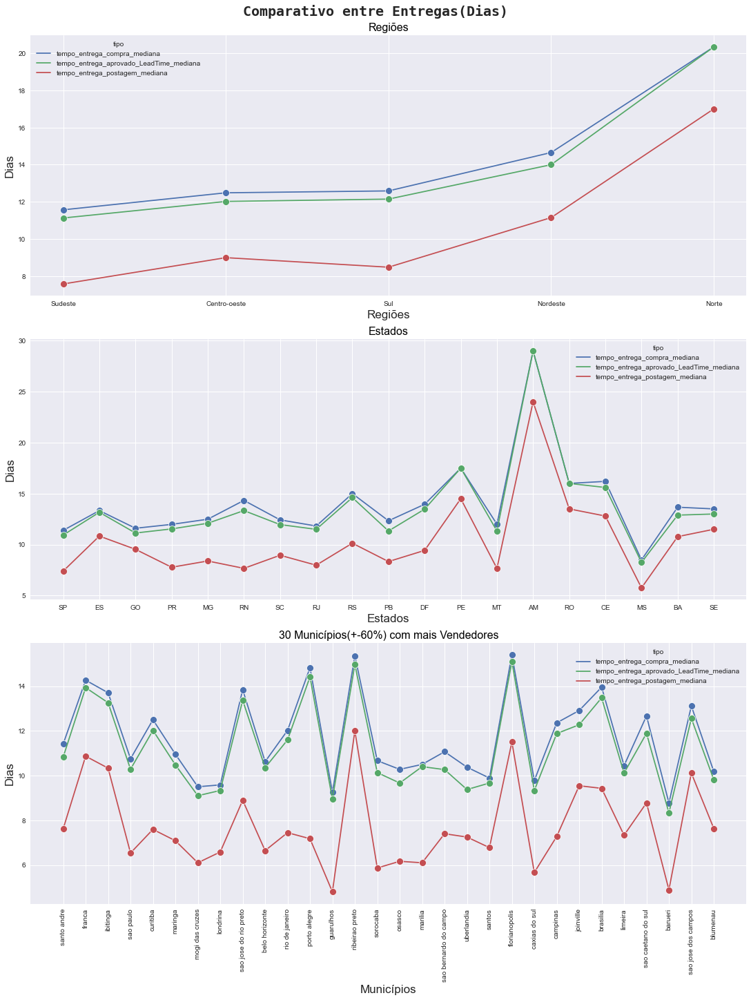

In [798]:
#Comparativo entre entregas(dias)
df_melt=df_abt[['vendedor_grande_regiao_nome','tempo_entrega_compra_mediana','tempo_entrega_aprovado_LeadTime_mediana', 'tempo_entrega_postagem_mediana']]
df_regiao_dias=pd.melt(df_melt,id_vars=['vendedor_grande_regiao_nome'],var_name='tipo',value_name='dias')

df_melt=df_abt[['vendedor_estado','tempo_entrega_compra_mediana','tempo_entrega_aprovado_LeadTime_mediana', 'tempo_entrega_postagem_mediana']]
df_estados_dias=pd.melt(df_melt,id_vars=['vendedor_estado'],var_name='tipo',value_name='dias')

df_melt=df_abt[['vendedor_cidade','tempo_entrega_compra_mediana','tempo_entrega_aprovado_LeadTime_mediana', 'tempo_entrega_postagem_mediana']]
df_aux = df_abt.groupby("vendedor_cidade").count()["vendedor_id"].reset_index().sort_values(by="vendedor_id",ascending=False).head(30)
#df_aux[['vendedor_cidade']]

df_cidades_dias=pd.melt(df_melt,id_vars=['vendedor_cidade'],var_name='tipo',value_name='dias')
df_cidades_dias=df_cidades_dias[df_cidades_dias['vendedor_cidade'].isin(df_aux['vendedor_cidade'])]

fig = plt.figure(constrained_layout=True, figsize=(15, 20))
# definição axis
gs = gridspec.GridSpec(3, 1, figure=fig)
ax1 = fig.add_subplot(gs[0, :])
ax2 = fig.add_subplot(gs[1, :])
ax3 = fig.add_subplot(gs[2,:])

sns.lineplot(x="vendedor_grande_regiao_nome", y='dias', data=df_regiao_dias, ax=ax1, hue='tipo',
          marker='o',markersize=10, color='blue',ci=None)
ax1.set_title("Regiões", size=16, color='black')
ax1.set_xlabel("Regiões", fontsize=17 )
ax1.set_ylabel("Dias", fontsize=17 )
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

sns.lineplot(x="vendedor_estado", y='dias', data=df_estados_dias, ax=ax2, hue='tipo',
          marker='o',markersize=10, color='blue', ci=None)
ax2.set_title("Estados", size=16, color='black')
ax2.set_xlabel("Estados", fontsize=17 )
ax2.set_ylabel("Dias", fontsize=17 )
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

sns.lineplot(x="vendedor_cidade", y='dias', data=df_cidades_dias, ax=ax3, hue='tipo',
          marker='o',markersize=10, color='blue',ci=None)
ax3.set_title("30 Municípios(+-60%) com mais Vendedores", size=16, color='black')
ax3.set_xlabel("Municípios", fontsize=17 )
ax3.set_ylabel("Dias", fontsize=17 )
plt.setp(ax3.get_xticklabels(), rotation=90)
ax3.spines['top'].set_visible(False)
ax3.spines['right'].set_visible(False)

plt.suptitle("Comparativo entre Entregas(Dias)", fontsize = 20, fontname = 'monospace', weight = 'bold')
plt.show()

In [799]:
display(df_abt[df_abt['vendedor_cidade'] == 'porto alegre'][['vendedor_id','tempo_entrega_compra_mediana']].sort_values(by='tempo_entrega_compra_mediana', ascending=False).head(7))
display(df_abt[df_abt['vendedor_cidade'] == 'ribeirao preto'][['vendedor_id','tempo_entrega_compra_mediana']].sort_values(by='tempo_entrega_compra_mediana', ascending=False).head(7))
display(df_abt[df_abt['vendedor_cidade'] == 'florianopolis'][['vendedor_id','tempo_entrega_compra_mediana']].sort_values(by='tempo_entrega_compra_mediana', ascending=False).head(7))

,vendedor_id,tempo_entrega_compra_mediana
582,586a871d4f1221763fddb6ceefdeb95e,68
1085,a44fb5a447105f8469bdf16bf9159f25,28
955,901b460cdce0c64e471230d7f2f9f3a3,22
1545,f08a5b9dd6767129688d001acafc21e5,18
1554,f1ed6bd0a9b11b581f16c851c6a5a527,17
1321,c9e5ad1f6647f5dbd1172adf6ae3cada,14
49,06e5eefc71ec47ae763c5c6f8db7064f,10


,vendedor_id,tempo_entrega_compra_mediana
625,5eeb9c756d9780b96283e5a2ac6da334,33
1241,be1e9e378700cecaa4ebf71433d7915c,30
949,8f580d36c1e9d6fbce95283403c7d447,28
800,791cfcfe22fe4a771ece27f90017da92,28
1253,c0098efcf800861dcae589affca31408,27
782,76c47a299e4a8fe992316a85865acbe9,27
96,0d4c8269e7f0401201794deef160edd6,19


,vendedor_id,tempo_entrega_compra_mediana
1332,cb4a705d00e100b9732d0ca34817d441,24
1067,a2fa0bdc798ee84cdb08281337cf4fb6,20
600,5b581417df4480f632484ba681e53944,19
1189,b5e3e38609125694d2ea2417522a60b7,18
851,8132b9bd16876e1b0f8808d43825dd48,16
111,0f94588695d71662beec8d883ffacf09,14
875,83deb69e889cf80f82be1dc6d5f2d486,14


In [800]:
display(df_abt[df_abt['vendedor_cidade'] == 'porto alegre'][['vendedor_id','tempo_entrega_aprovado_LeadTime_mediana']].sort_values(by='tempo_entrega_aprovado_LeadTime_mediana', ascending=False).head(7))
display(df_abt[df_abt['vendedor_cidade'] == 'ribeirao preto'][['vendedor_id','tempo_entrega_aprovado_LeadTime_mediana']].sort_values(by='tempo_entrega_aprovado_LeadTime_mediana', ascending=False).head(7))
display(df_abt[df_abt['vendedor_cidade'] == 'florianopolis'][['vendedor_id','tempo_entrega_aprovado_LeadTime_mediana']].sort_values(by='tempo_entrega_aprovado_LeadTime_mediana', ascending=False).head(7))


,vendedor_id,tempo_entrega_aprovado_LeadTime_mediana
582,586a871d4f1221763fddb6ceefdeb95e,67
1085,a44fb5a447105f8469bdf16bf9159f25,28
955,901b460cdce0c64e471230d7f2f9f3a3,22
1554,f1ed6bd0a9b11b581f16c851c6a5a527,17
1545,f08a5b9dd6767129688d001acafc21e5,17
1321,c9e5ad1f6647f5dbd1172adf6ae3cada,13
1275,c353f8fc0ce8344999f17d578eb69a5e,9


,vendedor_id,tempo_entrega_aprovado_LeadTime_mediana
625,5eeb9c756d9780b96283e5a2ac6da334,33
1241,be1e9e378700cecaa4ebf71433d7915c,30
949,8f580d36c1e9d6fbce95283403c7d447,28
1253,c0098efcf800861dcae589affca31408,27
800,791cfcfe22fe4a771ece27f90017da92,26
782,76c47a299e4a8fe992316a85865acbe9,26
96,0d4c8269e7f0401201794deef160edd6,19


,vendedor_id,tempo_entrega_aprovado_LeadTime_mediana
1332,cb4a705d00e100b9732d0ca34817d441,23
1067,a2fa0bdc798ee84cdb08281337cf4fb6,20
600,5b581417df4480f632484ba681e53944,19
1189,b5e3e38609125694d2ea2417522a60b7,18
851,8132b9bd16876e1b0f8808d43825dd48,16
111,0f94588695d71662beec8d883ffacf09,14
875,83deb69e889cf80f82be1dc6d5f2d486,13


In [801]:
display(df_abt[df_abt['vendedor_cidade'] == 'porto alegre'][['vendedor_id','tempo_entrega_postagem_mediana']].sort_values(by='tempo_entrega_postagem_mediana', ascending=False).head(7))
display(df_abt[df_abt['vendedor_cidade'] == 'ribeirao preto'][['vendedor_id','tempo_entrega_postagem_mediana']].sort_values(by='tempo_entrega_postagem_mediana', ascending=False).head(7))
display(df_abt[df_abt['vendedor_cidade'] == 'florianopolis'][['vendedor_id','tempo_entrega_postagem_mediana']].sort_values(by='tempo_entrega_postagem_mediana', ascending=False).head(7))

,vendedor_id,tempo_entrega_postagem_mediana
582,586a871d4f1221763fddb6ceefdeb95e,19
955,901b460cdce0c64e471230d7f2f9f3a3,18
1321,c9e5ad1f6647f5dbd1172adf6ae3cada,11
1545,f08a5b9dd6767129688d001acafc21e5,9
1275,c353f8fc0ce8344999f17d578eb69a5e,8
453,4391ea5c5990502176a1dcda44a2373d,7
477,48985c61529077fa4f1e38bcff0f2ed3,7


,vendedor_id,tempo_entrega_postagem_mediana
625,5eeb9c756d9780b96283e5a2ac6da334,32
1241,be1e9e378700cecaa4ebf71433d7915c,28
949,8f580d36c1e9d6fbce95283403c7d447,28
1253,c0098efcf800861dcae589affca31408,26
782,76c47a299e4a8fe992316a85865acbe9,23
800,791cfcfe22fe4a771ece27f90017da92,20
96,0d4c8269e7f0401201794deef160edd6,17


,vendedor_id,tempo_entrega_postagem_mediana
1332,cb4a705d00e100b9732d0ca34817d441,20
111,0f94588695d71662beec8d883ffacf09,14
1189,b5e3e38609125694d2ea2417522a60b7,14
600,5b581417df4480f632484ba681e53944,13
851,8132b9bd16876e1b0f8808d43825dd48,13
875,83deb69e889cf80f82be1dc6d5f2d486,10
1067,a2fa0bdc798ee84cdb08281337cf4fb6,10


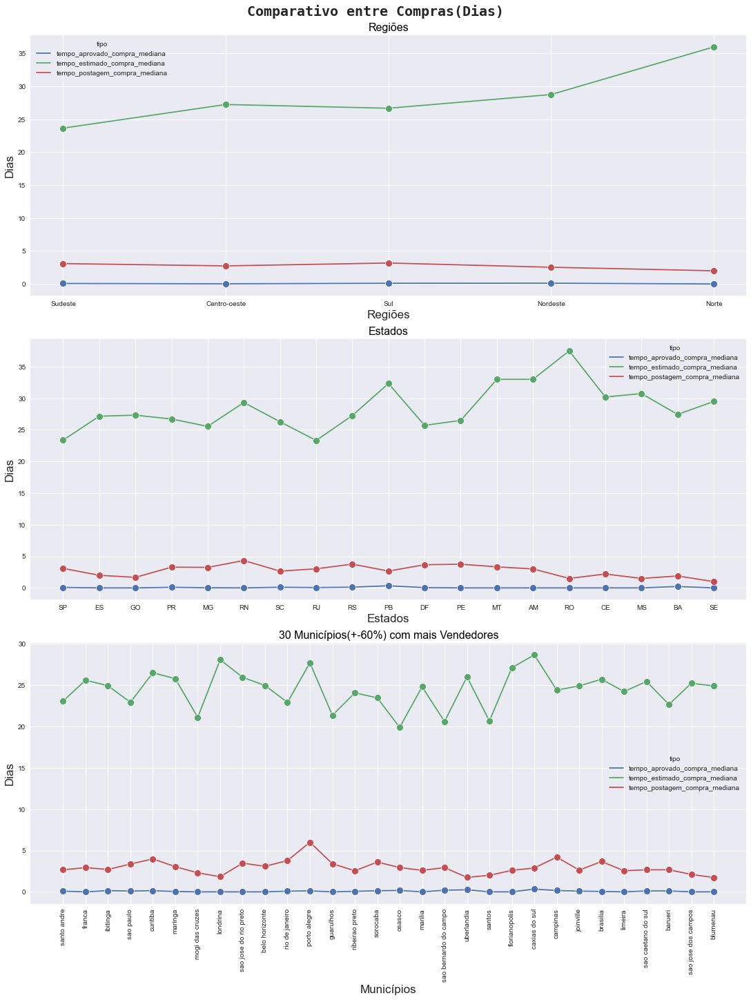

In [802]:
#Comparativo entre compras(dias)

df_melt=df_abt[['vendedor_grande_regiao_nome','tempo_aprovado_compra_mediana','tempo_estimado_compra_mediana', 'tempo_postagem_compra_mediana']]
df_regiao_dias=pd.melt(df_melt,id_vars=['vendedor_grande_regiao_nome'],var_name='tipo',value_name='dias')

df_melt=df_abt[['vendedor_estado','tempo_aprovado_compra_mediana','tempo_estimado_compra_mediana', 'tempo_postagem_compra_mediana']]
df_estados_dias=pd.melt(df_melt,id_vars=['vendedor_estado'],var_name='tipo',value_name='dias')

df_melt=df_abt[['vendedor_cidade','tempo_aprovado_compra_mediana','tempo_estimado_compra_mediana', 'tempo_postagem_compra_mediana']]
df_aux = df_abt.groupby("vendedor_cidade").count()["vendedor_id"].reset_index().sort_values(by="vendedor_id",ascending=False).head(30)
#df_aux[['vendedor_cidade']]

df_cidades_dias=pd.melt(df_melt,id_vars=['vendedor_cidade'],var_name='tipo',value_name='dias')
df_cidades_dias=df_cidades_dias[df_cidades_dias['vendedor_cidade'].isin(df_aux['vendedor_cidade'])]
fig = plt.figure(constrained_layout=True, figsize=(15, 20))

# definição axis
gs = gridspec.GridSpec(3, 1, figure=fig)
ax1 = fig.add_subplot(gs[0, :])
ax2 = fig.add_subplot(gs[1, :])
ax3 = fig.add_subplot(gs[2,:])

sns.lineplot(x="vendedor_grande_regiao_nome", y='dias', data=df_regiao_dias, ax=ax1, hue='tipo',
          marker='o',markersize=10, color='blue',ci=None)
ax1.set_title("Regiões", size=16, color='black')
ax1.set_xlabel("Regiões", fontsize=17 )
ax1.set_ylabel("Dias", fontsize=17 )
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

sns.lineplot(x="vendedor_estado", y='dias', data=df_estados_dias, ax=ax2, hue='tipo',
          marker='o',markersize=10, color='blue', ci=None)
ax2.set_title("Estados", size=16, color='black')
ax2.set_xlabel("Estados", fontsize=17 )
ax2.set_ylabel("Dias", fontsize=17 )
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

sns.lineplot(x="vendedor_cidade", y='dias', data=df_cidades_dias, ax=ax3, hue='tipo',
          marker='o',markersize=10, color='blue',ci=None)
ax3.set_title("30 Municípios(+-60%) com mais Vendedores", size=16, color='black')
ax3.set_xlabel("Municípios", fontsize=17 )
ax3.set_ylabel("Dias", fontsize=17 )
plt.setp(ax3.get_xticklabels(), rotation=90)
ax3.spines['top'].set_visible(False)
ax3.spines['right'].set_visible(False)

plt.suptitle("Comparativo entre Compras(Dias)", fontsize = 20, fontname = 'monospace', weight = 'bold')

plt.show()

In [803]:
display(df_abt[df_abt['vendedor_cidade'] == 'porto alegre'][['vendedor_id','tempo_postagem_compra_mediana']].sort_values(by='tempo_postagem_compra_mediana', ascending=False).head(7))
display(df_abt[df_abt['vendedor_cidade'] == 'campinas'][['vendedor_id','tempo_postagem_compra_mediana']].sort_values(by='tempo_postagem_compra_mediana', ascending=False).head(7))


,vendedor_id,tempo_postagem_compra_mediana
582,586a871d4f1221763fddb6ceefdeb95e,49
1085,a44fb5a447105f8469bdf16bf9159f25,15
1554,f1ed6bd0a9b11b581f16c851c6a5a527,10
1545,f08a5b9dd6767129688d001acafc21e5,6
955,901b460cdce0c64e471230d7f2f9f3a3,3
49,06e5eefc71ec47ae763c5c6f8db7064f,3
348,33a17d60c64393351ebf1ef860f4e0f2,3


,vendedor_id,tempo_postagem_compra_mediana
213,1e47d8b6546eb3a77b1acddcc9406242,16
937,8e2b3afb420011ef0c88c9d5f11ea526,15
791,781a66c0d89e30814d49fe8b5e14cd07,14
933,8d46553a36e68f95350a200c12f8f2e2,12
1153,b0b346d3a89f5eb4c2968af3f083cd43,6
354,3442f8959a84dea7ee197c632cb2df15,6
391,3a79f35a2344ede41af21267f61d5ec6,6


In [804]:
display(df_abt[df_abt['vendedor_cidade'] == 'porto alegre'][['vendedor_id','tempo_estimado_compra_mediana']].sort_values(by='tempo_estimado_compra_mediana', ascending=False).head(15))
display(df_abt[df_abt['vendedor_cidade'] == 'caxias do sul'][['vendedor_id','tempo_estimado_compra_mediana']].sort_values(by='tempo_estimado_compra_mediana', ascending=False).head(15))
display(df_abt[df_abt['vendedor_cidade'] == 'londrina'][['vendedor_id','tempo_estimado_compra_mediana']].sort_values(by='tempo_estimado_compra_mediana', ascending=False).head(15))
display(df_abt[df_abt['vendedor_cidade'] == 'florianopolis'][['vendedor_id','tempo_estimado_compra_mediana']].sort_values(by='tempo_estimado_compra_mediana', ascending=False).head(15))


,vendedor_id,tempo_estimado_compra_mediana
582,586a871d4f1221763fddb6ceefdeb95e,46
1275,c353f8fc0ce8344999f17d578eb69a5e,42
955,901b460cdce0c64e471230d7f2f9f3a3,42
1554,f1ed6bd0a9b11b581f16c851c6a5a527,31
97,0d83f8e03188682112cc0d93523705cc,28
49,06e5eefc71ec47ae763c5c6f8db7064f,28
319,2ec6e37d992a95eaddb3369dcbcc76d9,27
1063,a23266650e7c84bb93fbbba502137478,26
1409,d98eec89afa3380e14463da2aabaea72,26
893,87142160b41353c4e5fca2360caf6f92,26


,vendedor_id,tempo_estimado_compra_mediana
425,3fadb4cba4c35bce6a7eaf9872d5623a,33
764,740205fedfe4e90ca6857bc77db0f2b4,33
112,0ff83046c3fa22efee8ecf291888b191,32
1027,9c3c24eca51c52b91c1de727d2a2ae06,30
247,236585a4ddb5fea9fa40233e2249ed91,29
583,5882820ef11c4c068eea0677a7a879b4,27
1171,b32be1695eb7ec5f10f72d9610a12527,27
1134,acf974e4d5950ad143a247471b831eb9,26
775,75a4764c108403a7a0575140cb22287c,21


,vendedor_id,tempo_estimado_compra_mediana
1523,ed859002ad59dbf8cf3602696a6c3000,38
1628,fc4751cfe3b279c419615b9b00c1abb4,35
779,762ed976527cddf02787edba70fffa2a,30
362,35fb511489d9ee3ee27a76debce9df06,29
47,0691148aee60ca47977c187804f935ae,28
331,2ff6b7bff164ef05590a52734e1296da,27
350,33c51922b6e3c16b24a8f28e5833c99d,27
1513,ebd1417732defaf66c50b5a800eb293e,27
920,8b8cfc8305aa441e4239358c9f6f2485,25
16,01fdefa7697d26ad920e9e0346d4bd1b,24


,vendedor_id,tempo_estimado_compra_mediana
851,8132b9bd16876e1b0f8808d43825dd48,32
1197,b7d5b4b87af9d42b601865d3f3810bff,29
1034,9d5604a1f112324ad6b2aa552122e0fb,28
600,5b581417df4480f632484ba681e53944,27
875,83deb69e889cf80f82be1dc6d5f2d486,27
1089,a4b6b9b992b46e9ef863637af96e04bc,27
111,0f94588695d71662beec8d883ffacf09,26
1067,a2fa0bdc798ee84cdb08281337cf4fb6,26
1332,cb4a705d00e100b9732d0ca34817d441,26
1189,b5e3e38609125694d2ea2417522a60b7,23


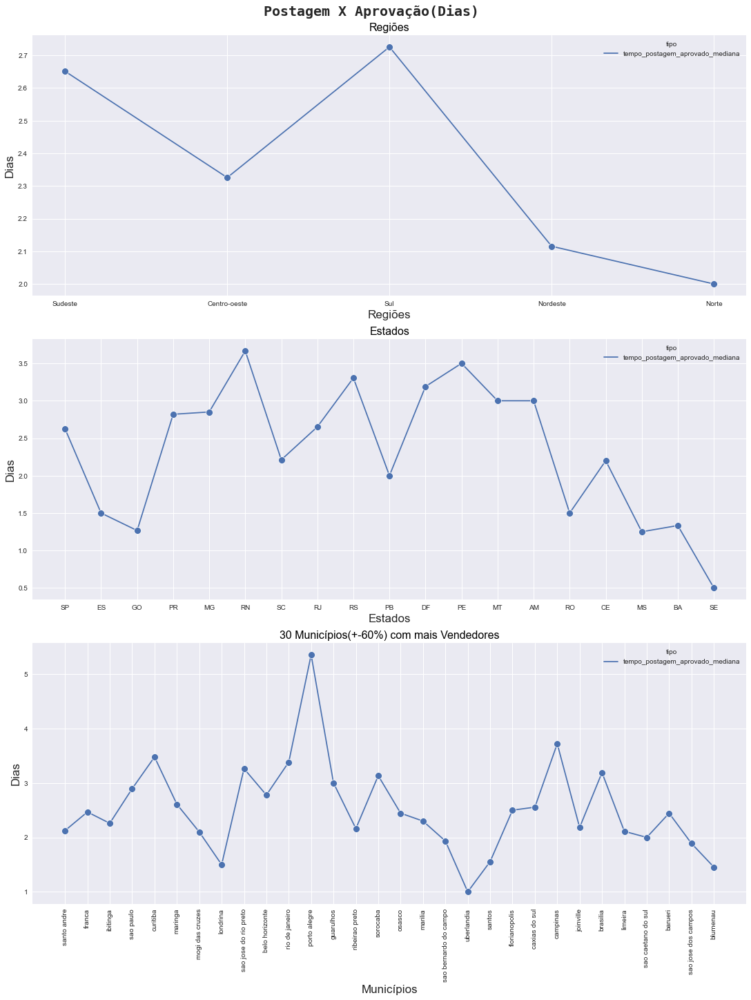

In [805]:
#Postagem X Aprovação(dias)
df_melt=df_abt[['vendedor_grande_regiao_nome','tempo_postagem_aprovado_mediana']]
df_regiao_dias=pd.melt(df_melt,id_vars=['vendedor_grande_regiao_nome'],var_name='tipo',value_name='dias')

df_melt=df_abt[['vendedor_estado','tempo_postagem_aprovado_mediana']]
df_estados_dias=pd.melt(df_melt,id_vars=['vendedor_estado'],var_name='tipo',value_name='dias')

df_melt=df_abt[['vendedor_cidade','tempo_postagem_aprovado_mediana']]
df_aux = df_abt.groupby("vendedor_cidade").count()["vendedor_id"].reset_index().sort_values(by="vendedor_id",ascending=False).head(30)
#df_aux[['vendedor_cidade']]

df_cidades_dias=pd.melt(df_melt,id_vars=['vendedor_cidade'],var_name='tipo',value_name='dias')
df_cidades_dias=df_cidades_dias[df_cidades_dias['vendedor_cidade'].isin(df_aux['vendedor_cidade'])]
fig = plt.figure(constrained_layout=True, figsize=(15, 20))

# definição axis
gs = gridspec.GridSpec(3, 1, figure=fig)
ax1 = fig.add_subplot(gs[0, :])
ax2 = fig.add_subplot(gs[1, :])
ax3 = fig.add_subplot(gs[2,:])

sns.lineplot(x="vendedor_grande_regiao_nome", y='dias', data=df_regiao_dias, ax=ax1, hue='tipo',
          marker='o',markersize=10, color='blue',ci=None)
ax1.set_title("Regiões", size=16, color='black')
ax1.set_xlabel("Regiões", fontsize=17 )
ax1.set_ylabel("Dias", fontsize=17 )
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

sns.lineplot(x="vendedor_estado", y='dias', data=df_estados_dias, ax=ax2, hue='tipo',
          marker='o',markersize=10, color='blue', ci=None)
ax2.set_title("Estados", size=16, color='black')
ax2.set_xlabel("Estados", fontsize=17 )
ax2.set_ylabel("Dias", fontsize=17 )
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

sns.lineplot(x="vendedor_cidade", y='dias', data=df_cidades_dias, ax=ax3, hue='tipo',
          marker='o',markersize=10, color='blue',ci=None)
ax3.set_title("30 Municípios(+-60%) com mais Vendedores", size=16, color='black')
ax3.set_xlabel("Municípios", fontsize=17 )
ax3.set_ylabel("Dias", fontsize=17 )
plt.setp(ax3.get_xticklabels(), rotation=90)
ax3.spines['top'].set_visible(False)
ax3.spines['right'].set_visible(False)

plt.suptitle("Postagem X Aprovação(Dias) ", fontsize = 20, fontname = 'monospace', weight = 'bold')

plt.show()

In [806]:
display(df_abt[df_abt['vendedor_cidade'] == 'porto alegre'][['vendedor_id','tempo_postagem_aprovado_mediana']].sort_values(by='tempo_postagem_aprovado_mediana', ascending=False).head(7))
display(df_abt[df_abt['vendedor_cidade'] == 'campinas'][['vendedor_id','tempo_postagem_aprovado_mediana']].sort_values(by='tempo_postagem_aprovado_mediana', ascending=False).head(7))

,vendedor_id,tempo_postagem_aprovado_mediana
582,586a871d4f1221763fddb6ceefdeb95e,48
1085,a44fb5a447105f8469bdf16bf9159f25,14
1554,f1ed6bd0a9b11b581f16c851c6a5a527,9
1545,f08a5b9dd6767129688d001acafc21e5,5
319,2ec6e37d992a95eaddb3369dcbcc76d9,3
955,901b460cdce0c64e471230d7f2f9f3a3,3
49,06e5eefc71ec47ae763c5c6f8db7064f,2


,vendedor_id,tempo_postagem_aprovado_mediana
213,1e47d8b6546eb3a77b1acddcc9406242,16
937,8e2b3afb420011ef0c88c9d5f11ea526,15
791,781a66c0d89e30814d49fe8b5e14cd07,14
933,8d46553a36e68f95350a200c12f8f2e2,12
354,3442f8959a84dea7ee197c632cb2df15,6
1153,b0b346d3a89f5eb4c2968af3f083cd43,6
391,3a79f35a2344ede41af21267f61d5ec6,4


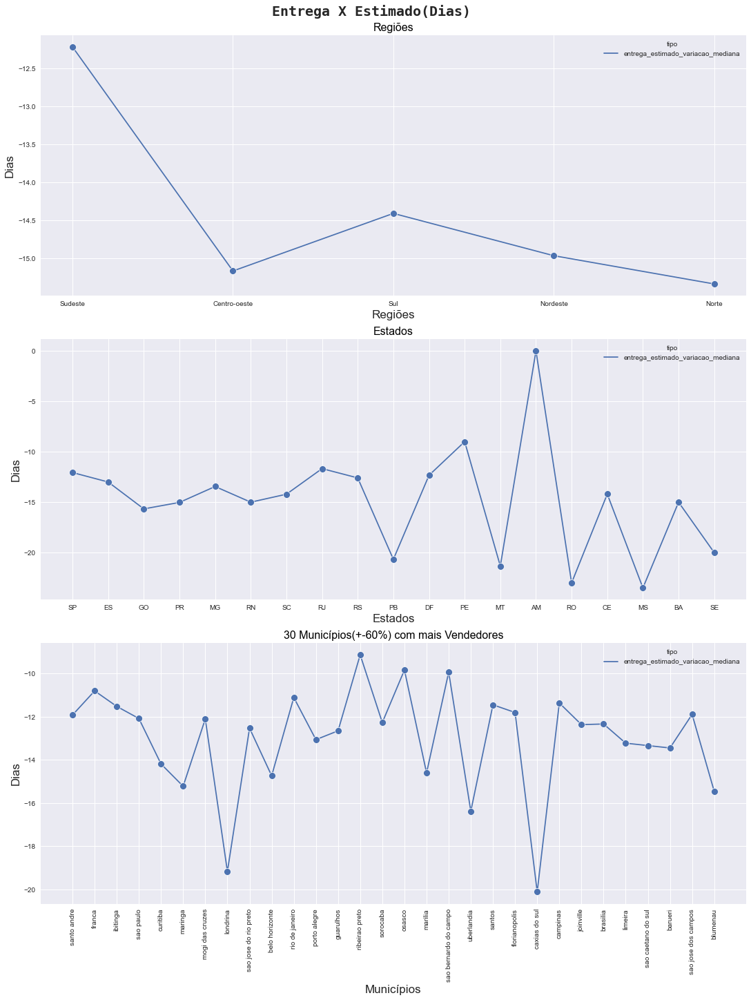

In [807]:
#Entrega X Estimado(dias)
df_melt=df_abt[['vendedor_grande_regiao_nome','entrega_estimado_variacao_mediana']]
df_regiao_dias=pd.melt(df_melt,id_vars=['vendedor_grande_regiao_nome'],var_name='tipo',value_name='dias')

df_melt=df_abt[['vendedor_estado','entrega_estimado_variacao_mediana']]
df_estados_dias=pd.melt(df_melt,id_vars=['vendedor_estado'],var_name='tipo',value_name='dias')

df_melt=df_abt[['vendedor_cidade','entrega_estimado_variacao_mediana']]
df_aux = df_abt.groupby("vendedor_cidade").count()["vendedor_id"].reset_index().sort_values(by="vendedor_id",ascending=False).head(30)
#df_aux[['vendedor_cidade']]

df_cidades_dias=pd.melt(df_melt,id_vars=['vendedor_cidade'],var_name='tipo',value_name='dias')
df_cidades_dias=df_cidades_dias[df_cidades_dias['vendedor_cidade'].isin(df_aux['vendedor_cidade'])]
fig = plt.figure(constrained_layout=True, figsize=(15, 20))

# definição axis
gs = gridspec.GridSpec(3, 1, figure=fig)
ax1 = fig.add_subplot(gs[0, :])
ax2 = fig.add_subplot(gs[1, :])
ax3 = fig.add_subplot(gs[2,:])

sns.lineplot(x="vendedor_grande_regiao_nome", y='dias', data=df_regiao_dias, ax=ax1, hue='tipo',
          marker='o',markersize=10, color='blue',ci=None)
ax1.set_title("Regiões", size=16, color='black')
ax1.set_xlabel("Regiões", fontsize=17 )
ax1.set_ylabel("Dias", fontsize=17 )
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

sns.lineplot(x="vendedor_estado", y='dias', data=df_estados_dias, ax=ax2, hue='tipo',
          marker='o',markersize=10, color='blue', ci=None)
ax2.set_title("Estados", size=16, color='black')
ax2.set_xlabel("Estados", fontsize=17 )
ax2.set_ylabel("Dias", fontsize=17 )
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

sns.lineplot(x="vendedor_cidade", y='dias', data=df_cidades_dias, ax=ax3, hue='tipo',
          marker='o',markersize=10, color='blue',ci=None)
ax3.set_title("30 Municípios(+-60%) com mais Vendedores", size=16, color='black')
ax3.set_xlabel("Municípios", fontsize=17 )
ax3.set_ylabel("Dias", fontsize=17 )
plt.setp(ax3.get_xticklabels(), rotation=90)
ax3.spines['top'].set_visible(False)
ax3.spines['right'].set_visible(False)

plt.suptitle("Entrega X Estimado(Dias) ", fontsize = 20, fontname = 'monospace', weight = 'bold')
plt.show()

In [808]:
display(df_abt[df_abt['vendedor_cidade'] == 'ribeirao preto'][['vendedor_id','entrega_estimado_variacao_mediana']].sort_values(by='entrega_estimado_variacao_mediana', ascending=False).head(7))
display(df_abt[df_abt['vendedor_cidade'] == 'osasco'][['vendedor_id','entrega_estimado_variacao_mediana']].sort_values(by='entrega_estimado_variacao_mediana', ascending=False).head(7))
display(df_abt[df_abt['vendedor_cidade'] == 'sao bernardo do campo'][['vendedor_id','entrega_estimado_variacao_mediana']].sort_values(by='entrega_estimado_variacao_mediana', ascending=False).head(7))


,vendedor_id,entrega_estimado_variacao_mediana
800,791cfcfe22fe4a771ece27f90017da92,5
782,76c47a299e4a8fe992316a85865acbe9,5
1241,be1e9e378700cecaa4ebf71433d7915c,4
949,8f580d36c1e9d6fbce95283403c7d447,3
625,5eeb9c756d9780b96283e5a2ac6da334,1
1253,c0098efcf800861dcae589affca31408,0
96,0d4c8269e7f0401201794deef160edd6,-6


,vendedor_id,entrega_estimado_variacao_mediana
60,08061dc0fc165ed41288cc7acde738ee,-2
1283,c42fd8e4d47dfb18ce5222f2dd7752f9,-3
639,6187a137b2af59dfdbad8d9f8c373c14,-8
1397,d71d863e5ef30d94e440c11be17dcd8f,-8
685,695051e2981c8b19e77cafe450d5bdf3,-8
70,093805f8f2aeb63881444571e1f48f30,-9
139,13d058e4eeac2ce8217660b2f8a05812,-9


,vendedor_id,entrega_estimado_variacao_mediana
681,685b870da5b52a710782c9c0fefbeb5b,13
1077,a3b0df0065e264a91b7bbf5f844af5cd,-6
528,5160d23075764e18e07c1f4a87fad743,-8
1445,dfc5fb7259bb2b599ca565e6e9448f0f,-9
156,1660ad786c27fd935378b6192a90b417,-10
969,92d14edfb62ee5ae7fdff70b0f4e7233,-10
1600,f7ba60f8c3f99e7ee4042fdef03b70c4,-10


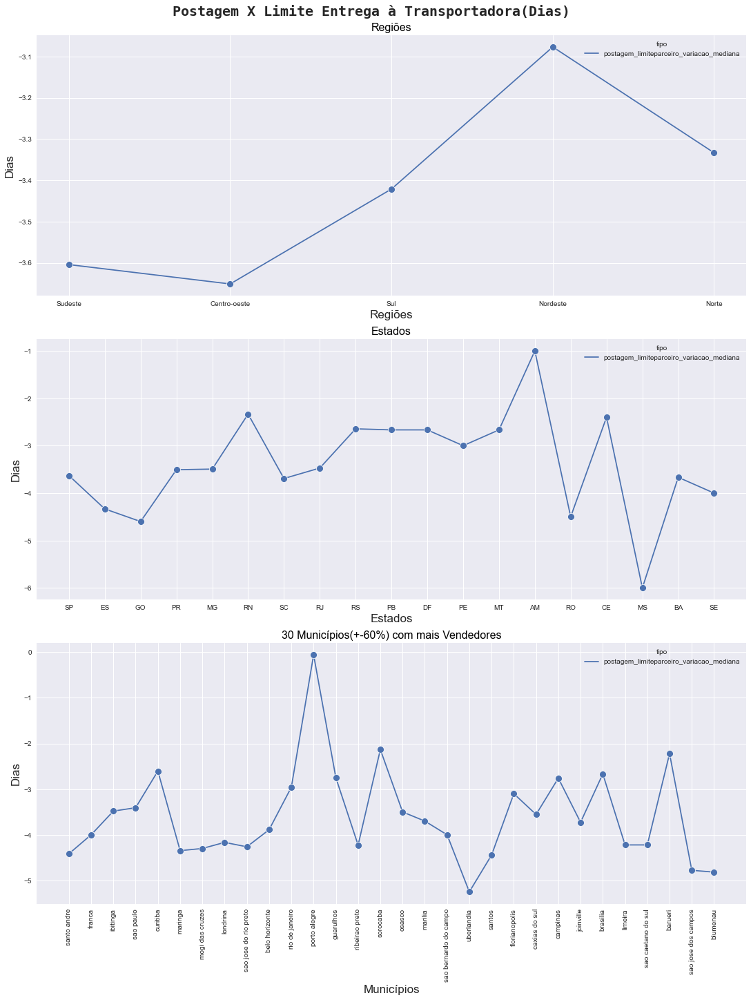

In [809]:
#Postagem X Limite Entrega à Transportadora(dias)
df_melt=df_abt[['vendedor_grande_regiao_nome','postagem_limiteparceiro_variacao_mediana']]
df_regiao_dias=pd.melt(df_melt,id_vars=['vendedor_grande_regiao_nome'],var_name='tipo',value_name='dias')

df_melt=df_abt[['vendedor_estado','postagem_limiteparceiro_variacao_mediana']]
df_estados_dias=pd.melt(df_melt,id_vars=['vendedor_estado'],var_name='tipo',value_name='dias')

df_melt=df_abt[['vendedor_cidade','postagem_limiteparceiro_variacao_mediana']]
df_aux = df_abt.groupby("vendedor_cidade").count()["vendedor_id"].reset_index().sort_values(by="vendedor_id",ascending=False).head(30)
#df_aux[['vendedor_cidade']]

df_cidades_dias=pd.melt(df_melt,id_vars=['vendedor_cidade'],var_name='tipo',value_name='dias')
df_cidades_dias=df_cidades_dias[df_cidades_dias['vendedor_cidade'].isin(df_aux['vendedor_cidade'])]
fig = plt.figure(constrained_layout=True, figsize=(15, 20))

# definição axis
gs = gridspec.GridSpec(3, 1, figure=fig)
ax1 = fig.add_subplot(gs[0, :])
ax2 = fig.add_subplot(gs[1, :])
ax3 = fig.add_subplot(gs[2,:])

sns.lineplot(x="vendedor_grande_regiao_nome", y='dias', data=df_regiao_dias, ax=ax1, hue='tipo',
          marker='o',markersize=10, color='blue',ci=None)
ax1.set_title("Regiões", size=16, color='black')
ax1.set_xlabel("Regiões", fontsize=17 )
ax1.set_ylabel("Dias", fontsize=17 )
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

sns.lineplot(x="vendedor_estado", y='dias', data=df_estados_dias, ax=ax2, hue='tipo',
          marker='o',markersize=10, color='blue', ci=None)
ax2.set_title("Estados", size=16, color='black')
ax2.set_xlabel("Estados", fontsize=17 )
ax2.set_ylabel("Dias", fontsize=17 )
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

sns.lineplot(x="vendedor_cidade", y='dias', data=df_cidades_dias, ax=ax3, hue='tipo',
          marker='o',markersize=10, color='blue',ci=None)
ax3.set_title("30 Municípios(+-60%) com mais Vendedores", size=16, color='black')
ax3.set_xlabel("Municípios", fontsize=17 )
ax3.set_ylabel("Dias", fontsize=17 )
plt.setp(ax3.get_xticklabels(), rotation=90)
ax3.spines['top'].set_visible(False)
ax3.spines['right'].set_visible(False)

plt.suptitle("Postagem X Limite Entrega à Transportadora(Dias) ", fontsize = 20, fontname = 'monospace', weight = 'bold')
plt.show()

In [810]:
display(df_abt[df_abt['vendedor_cidade'] == 'porto alegre'][['vendedor_id','postagem_limiteparceiro_variacao_mediana']].sort_values(by='postagem_limiteparceiro_variacao_mediana', ascending=False).head(7))
display(df_abt[df_abt['vendedor_cidade'] == 'sorocaba'][['vendedor_id','postagem_limiteparceiro_variacao_mediana']].sort_values(by='postagem_limiteparceiro_variacao_mediana', ascending=False).head(7))
display(df_abt[df_abt['vendedor_cidade'] == 'barueri'][['vendedor_id','postagem_limiteparceiro_variacao_mediana']].sort_values(by='postagem_limiteparceiro_variacao_mediana', ascending=False).head(7))


,vendedor_id,postagem_limiteparceiro_variacao_mediana
582,586a871d4f1221763fddb6ceefdeb95e,45
1085,a44fb5a447105f8469bdf16bf9159f25,6
1554,f1ed6bd0a9b11b581f16c851c6a5a527,-1
1545,f08a5b9dd6767129688d001acafc21e5,-1
955,901b460cdce0c64e471230d7f2f9f3a3,-1
348,33a17d60c64393351ebf1ef860f4e0f2,-2
319,2ec6e37d992a95eaddb3369dcbcc76d9,-3


,vendedor_id,postagem_limiteparceiro_variacao_mediana
605,5b92bfa4120daa27c574daa2e386c693,5
656,6481e96574816ead57975da2c0f6d80d,4
783,76d336555bb25f3165d2f0d6da719c40,1
958,916748bc99315c2d202898ae58b1617e,-1
1157,b14db04aa7881970e83ffa9426897925,-1
55,077c5fae4bea9500e3737b16f71b9d3a,-3
369,3771c85bac139d2344864ede5d9341e3,-3


,vendedor_id,postagem_limiteparceiro_variacao_mediana
1491,e83e93b71371817b11d78a63ff156aee,3
328,2f9b7ce230a057a98a9f5df5893ee36c,-1
397,3be5841cdcc46de4ed3f9116f104b2c5,-1
1073,a36ac007a4d18f865c8d32c3b2402c2d,-1
945,8f119a0aee85c0c8fc534629734e94fd,-2
1328,cb162c8eef257253782d245c08d9097c,-2
837,7e93a43ef30c4f03f38b393420bc753a,-4


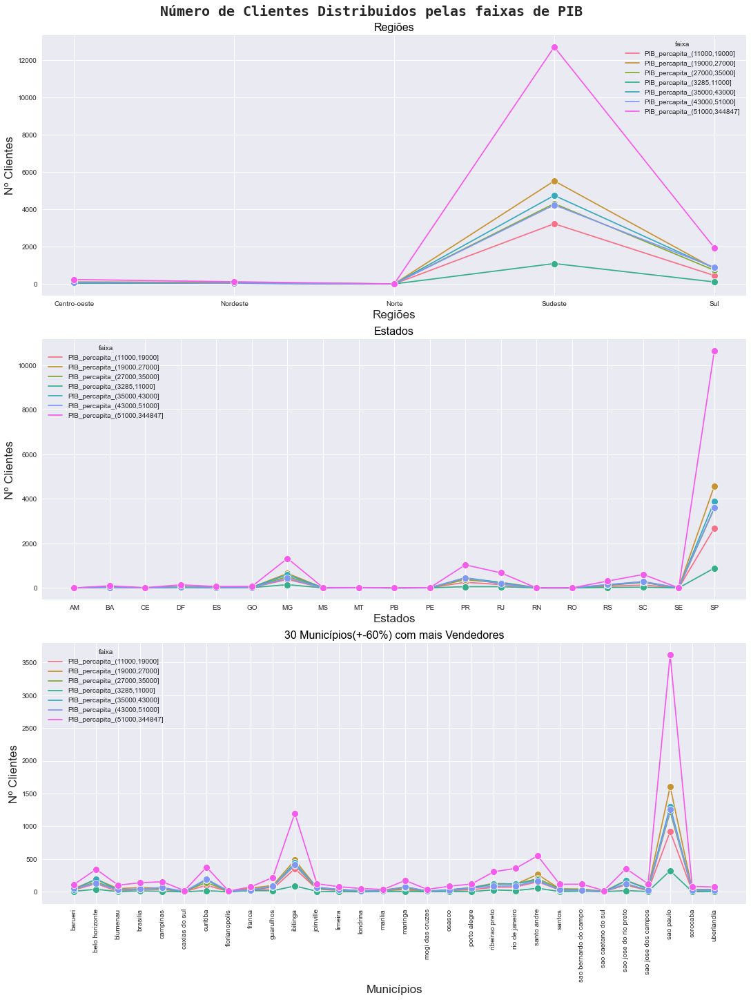

In [811]:
#Número de Clientes Distribuidos pelas faixas de PIB
#regiões
df_melt=df_abt[['vendedor_grande_regiao_nome','PIB_percapita_(3285,11000]','PIB_percapita_(11000,19000]',                      
            'PIB_percapita_(19000,27000]','PIB_percapita_(27000,35000]', 'PIB_percapita_(35000,43000]',                      
            'PIB_percapita_(43000,51000]','PIB_percapita_(51000,344847]']]
df_regiao_pib=pd.melt(df_melt,id_vars=['vendedor_grande_regiao_nome'],var_name='faixa',value_name='num_clientes')
df_regiao_pib=df_regiao_pib.groupby(['vendedor_grande_regiao_nome','faixa']).agg({'num_clientes':'sum'}).reset_index()

#estados
df_melt=df_abt[['vendedor_estado','PIB_percapita_(3285,11000]','PIB_percapita_(11000,19000]',                      
            'PIB_percapita_(19000,27000]','PIB_percapita_(27000,35000]', 'PIB_percapita_(35000,43000]',                      
            'PIB_percapita_(43000,51000]','PIB_percapita_(51000,344847]']]
df_estados_pib=pd.melt(df_melt,id_vars=['vendedor_estado'],var_name='faixa',value_name='num_clientes')
df_estados_pib=df_estados_pib.groupby(['vendedor_estado','faixa']).agg({'num_clientes':'sum'}).reset_index()

#municipios
df_melt=df_abt[['vendedor_cidade','PIB_percapita_(3285,11000]','PIB_percapita_(11000,19000]',                      
            'PIB_percapita_(19000,27000]','PIB_percapita_(27000,35000]', 'PIB_percapita_(35000,43000]',                      
            'PIB_percapita_(43000,51000]','PIB_percapita_(51000,344847]']]
df_aux = df_abt.groupby("vendedor_cidade").count()["vendedor_id"].reset_index().sort_values(by="vendedor_id",ascending=False).head(30)
df_cidades_pib=pd.melt(df_melt,id_vars=['vendedor_cidade'],var_name='faixa',value_name='num_clientes')
df_cidades_pib=df_cidades_pib.groupby(['vendedor_cidade','faixa']).agg({'num_clientes':'sum'}).reset_index()
df_cidades_pib=df_cidades_pib[df_cidades_pib['vendedor_cidade'].isin(df_aux['vendedor_cidade'])]

fig = plt.figure(constrained_layout=True, figsize=(15, 20))

# definição axis
gs = gridspec.GridSpec(3, 1, figure=fig)
ax1 = fig.add_subplot(gs[0, :])
ax2 = fig.add_subplot(gs[1, :])
ax3 = fig.add_subplot(gs[2,:])

sns.lineplot(x="vendedor_grande_regiao_nome", y='num_clientes', data=df_regiao_pib, ax=ax1, hue='faixa',
          marker='o',markersize=10, color='blue',ci=None)
ax1.set_title("Regiões", size=16, color='black')
ax1.set_xlabel("Regiões", fontsize=17 )
ax1.set_ylabel("Nº Clientes", fontsize=17 )
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

sns.lineplot(x="vendedor_estado", y='num_clientes', data=df_estados_pib, ax=ax2, hue='faixa',
          marker='o',markersize=10, color='blue', ci=None)
ax2.set_title("Estados", size=16, color='black')
ax2.set_xlabel("Estados", fontsize=17 )
ax2.set_ylabel("Nº Clientes", fontsize=17 )
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

sns.lineplot(x="vendedor_cidade", y='num_clientes', data=df_cidades_pib, ax=ax3, hue='faixa',
          marker='o',markersize=10, color='blue',ci=None)
ax3.set_title("30 Municípios(+-60%) com mais Vendedores", size=16, color='black')
ax3.set_xlabel("Municípios", fontsize=17 )
ax3.set_ylabel("Nº Clientes", fontsize=17 )
plt.setp(ax3.get_xticklabels(), rotation=90)
ax3.spines['top'].set_visible(False)
ax3.spines['right'].set_visible(False)

plt.suptitle("Número de Clientes Distribuidos pelas faixas de PIB ", fontsize = 20, fontname = 'monospace', weight = 'bold')
plt.show()

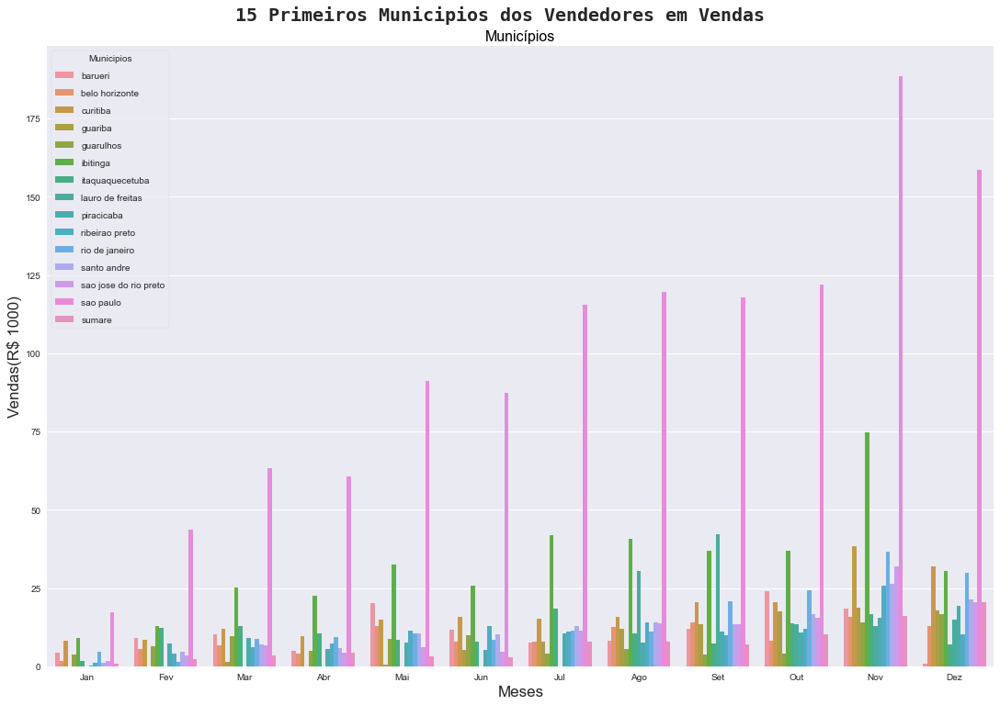

In [812]:
#municipios
df_melt=df_abt[['vendedor_cidade','vlr_mes_01','vlr_mes_02','vlr_mes_03','vlr_mes_04','vlr_mes_05','vlr_mes_06',
            'vlr_mes_07','vlr_mes_08','vlr_mes_09','vlr_mes_10','vlr_mes_11','vlr_mes_12']]
df_aux = df_abt.groupby("vendedor_cidade").count()["vendedor_id"].reset_index().sort_values(by="vendedor_id",ascending=False).head(30)
df_cidades_meses=pd.melt(df_melt,id_vars=['vendedor_cidade'],var_name='mes',value_name='valor')
df_cidades_meses['valor']=df_cidades_meses['valor']/1000
df_cidades_meses=df_cidades_meses.groupby(['vendedor_cidade','mes']).agg({'valor':'sum'}).reset_index()
#
df_lista=df_cidades_meses.groupby('vendedor_cidade').agg('sum').sort_values(by='valor',ascending=False).reset_index().head(15)
df_temp=df_cidades_meses[df_cidades_meses['vendedor_cidade'].isin(df_lista['vendedor_cidade'])]
df_cidades_meses=df_temp

fig = plt.figure(constrained_layout=True, figsize=(15, 20))
# definição axis
gs = gridspec.GridSpec(2, 1, figure=fig)
ax1 = fig.add_subplot(gs[0, :])

sns.barplot(x ="mes", y = 'valor', data = df_cidades_meses, hue = "vendedor_cidade",ax=ax1)
ax1.set_title("Municípios", size=16, color='black')
ax1.set_xlabel("Meses", fontsize=17 )
ax1.set_ylabel("Vendas(R$ 1000)", fontsize=17 )
plt.setp(ax3.get_xticklabels(), rotation=90)
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.set_xticklabels(labels=lista_meses)
ax1.legend(scatterpoints=1, frameon=True, labelspacing=1, title='Municipios')

plt.suptitle("15 Primeiros Municipios dos Vendedores em Vendas", fontsize = 20, fontname = 'monospace', weight = 'bold')
plt.show()

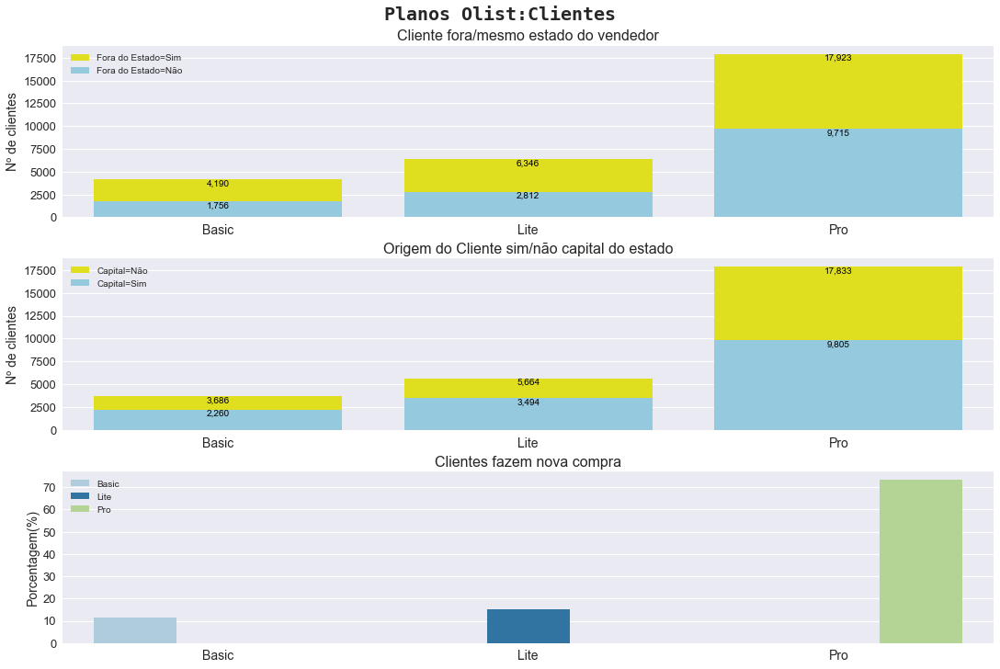

In [813]:
#Planos:Clientes relações
df_planos=df_abt.groupby(['plano']).agg({'qtd_clientes_estado':'sum','qtd_clientes_fora_estado':'sum',\
            'qtd_clientes_capital':'sum','qtd_clientes_fora_capital':'sum',\
            'qtd_clientes':'sum','qtd_clientes_repete':'sum'})
df_planos['aumento_clientes']=df_planos['qtd_clientes_repete'] - df_planos['qtd_clientes']
df_planos=df_planos.reset_index()
total_aumento=df_planos['aumento_clientes'].sum()
df_planos['aumento_%']=round((df_planos['aumento_clientes']/total_aumento)*100,2)
df_planos

fig = plt.figure(constrained_layout=True, figsize=(15, 10))

gs = gridspec.GridSpec(3, 2, figure=fig)
ax1 = fig.add_subplot(gs[0, :])
ax2 = fig.add_subplot(gs[1, :])
ax3 = fig.add_subplot(gs[2,:])

sns.barplot(x="plano", y="qtd_clientes_fora_estado", data=df_planos,  ax=ax1, color="yellow", label="Fora do Estado=Sim")
sns.barplot(x="plano", y="qtd_clientes_estado", data=df_planos,  ax=ax1, color="skyblue", label="Fora do Estado=Não")

ax1.set_title("Cliente fora/mesmo estado do vendedor", size=16)
ax1.set_xlabel("")
ax1.set_ylabel("Nº de clientes", fontsize=14)
ax1.legend(loc="best")
ax1.set_xticklabels(labels=['Basic','Lite','Pro'],fontsize=14)
plt.setp(ax1.get_yticklabels(), fontsize=13)
#ax1.xticks(fontsize=13)
for p in ax1.patches:
        ax1.annotate('{:,.0f}'.format(p.get_height()), (p.get_x()+0.4, p.get_height()),
                    ha='center', va='top', color= 'black')
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)


sns.barplot(x="plano", y="qtd_clientes_fora_capital", data=df_planos,  ax=ax2, color="yellow", label="Capital=Não")
sns.barplot(x="plano", y="qtd_clientes_capital", data=df_planos,  ax=ax2, color="skyblue", label="Capital=Sim")

ax2.set_title("Origem do Cliente sim/não capital do estado", size=16)
ax2.set_xlabel("")
ax2.set_ylabel("Nº de clientes", fontsize=14)
ax2.legend(loc="best")
ax2.set_xticklabels(labels=['Basic','Lite','Pro'],fontsize=14)
#ax2.xticks(fontsize=13)
plt.setp(ax2.get_yticklabels(), fontsize=13)
for p in ax2.patches:
        ax2.annotate('{:,.0f}'.format(p.get_height()), (p.get_x()+0.4, p.get_height()),
                    ha='center', va='top', color= 'black')
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

sns.barplot(data=df_planos,  x='qtd_clientes_repete',  y='aumento_%', hue='plano', ax=ax3,  palette='Paired')
ax3.set_title("Clientes fazem nova compra", size=16)
ax3.set_xlabel("")
ax3.set_ylabel("Porcentagem(%)", fontsize=14)
ax3.legend(loc="best")
ax3.set_xticklabels(labels=['Basic','Lite','Pro'],fontsize=14)
####ax2.xticks(fontsize=13)
plt.setp(ax3.get_yticklabels(), fontsize=13)
#for p in ax3.patches:
#        ax3.annotate('{:,.0f}'.format(p.get_height()), (p.get_x()+0.4, p.get_height()),
#                    ha='center', va='top', color= 'black')
ax3.spines['top'].set_visible(False)
ax3.spines['right'].set_visible(False)

plt.suptitle("Planos Olist:Clientes", fontsize = 20, fontname = 'monospace', weight = 'bold')
plt.show()

## <a class="anchor" id="grarel">1.4 Estatística Inferencial</a>
[Retorna ao Indice](#etapas)

In [814]:
df_abt[features_dis].shape
df_abt_tlc=pd.DataFrame({})

In [815]:
%%time
mf.transforma_tlc(df_abt, df_abt_tlc,features_corr)  

Wall time: 29.5 s


In [816]:
df_abt_tlc.shape

(750, 108)

In [817]:
regioes=[]
regioes = np.append(regioes, 'Brasil')
regioes=np.append(regioes,df_abt['vendedor_grande_regiao_nome'].unique())
regioes

array(['Brasil', 'Sudeste', 'Centro-oeste', 'Sul', 'Nordeste', 'Norte'],
      dtype=object)

In [818]:
df_abt['vendedor_grande_regiao_nome'].nunique()

5

In [819]:
df_abt['vendedor_estado'].nunique()

19

In [820]:
df_abt['vendedor_cidade'].nunique()

386

In [821]:
df_abt['preco'].dtypes

dtype('float64')

#### Vendas X Regiões

Comparativo Original X TLC




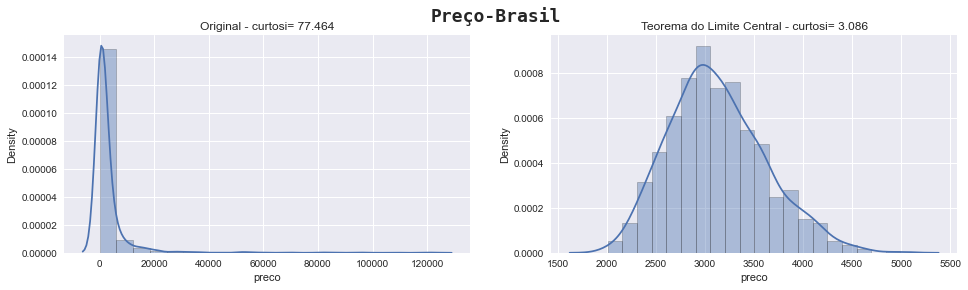

>>>>>>> Preço-Sudeste:
Média amostra: 3317.097
Média população: 3124.674
Intervalo de confiança: 3101.186 <------------> 3148.161
p-valor=[7.43821284e-22]
Resultado:  A amostra é estatisticamente diferente da população! (rejeitamos a hipótese nula).
>>>>>>> Preço-Centro-oeste:
Média amostra: 1886.531
Média população: 3124.674
Intervalo de confiança: 3101.186 <------------> 3148.161
p-valor=[0.]
Resultado:  A amostra é estatisticamente diferente da população! (rejeitamos a hipótese nula).
>>>>>>> Preço-Sul:
Média amostra: 2283.749
Média população: 3124.674
Intervalo de confiança: 3101.186 <------------> 3148.161
p-valor=[0.]
Resultado:  A amostra é estatisticamente diferente da população! (rejeitamos a hipótese nula).
>>>>>>> Preço-Nordeste:
Média amostra: 6069.823
Média população: 3124.674
Intervalo de confiança: 3101.186 <------------> 3148.161
p-valor=[2.08e-322]
Resultado:  A amostra é estatisticamente diferente da população! (rejeitamos a hipótese nula).
>>>>>>> Preço-Norte:
Média 

In [822]:
for i in range(0, 6):
    mf.teste_estatistico(df_abt,'preco',700, 350, 1658,'Preço-'+regioes[i], regioes[i],df_abt_tlc,'vendedor_grande_regiao_nome')

#### Lucros X Regiões

Comparativo Original X TLC




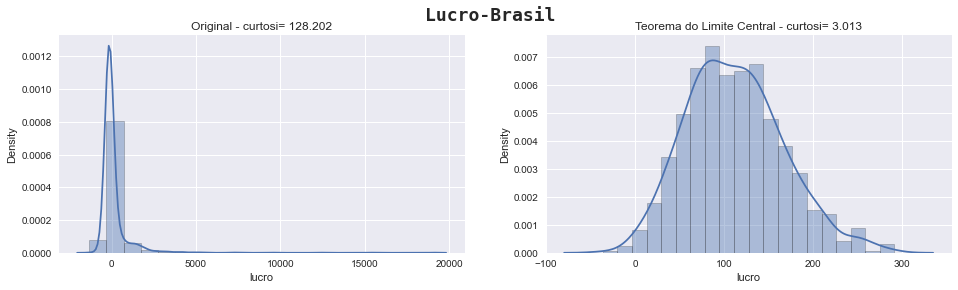

>>>>>>> Lucro-Sudeste:
Média amostra: 124.378
Média população: 111.954
Intervalo de confiança: 109.333 <------------> 114.576
p-valor=[6.84456119e-08]
Resultado:  A amostra é estatisticamente diferente da população! (rejeitamos a hipótese nula).
>>>>>>> Lucro-Centro-oeste:
Média amostra: -36.513
Média população: 111.954
Intervalo de confiança: 109.333 <------------> 114.576
p-valor=[0.]
Resultado:  A amostra é estatisticamente diferente da população! (rejeitamos a hipótese nula).
>>>>>>> Lucro-Sul:
Média amostra: 77.849
Média população: 111.954
Intervalo de confiança: 109.333 <------------> 114.576
p-valor=[1.03240278e-111]
Resultado:  A amostra é estatisticamente diferente da população! (rejeitamos a hipótese nula).
>>>>>>> Lucro-Nordeste:
Média amostra: 612.942
Média população: 111.954
Intervalo de confiança: 109.333 <------------> 114.576
p-valor=[0.]
Resultado:  A amostra é estatisticamente diferente da população! (rejeitamos a hipótese nula).
>>>>>>> Lucro-Norte:
Média amostra: 36

In [824]:
for i in range(0, 6):
    mf.teste_estatistico(df_abt,'lucro',700, 350, 1658,'Lucro-'+regioes[i], regioes[i],df_abt_tlc,'vendedor_grande_regiao_nome')

#### Receitas X Regiões

Comparativo Original X TLC




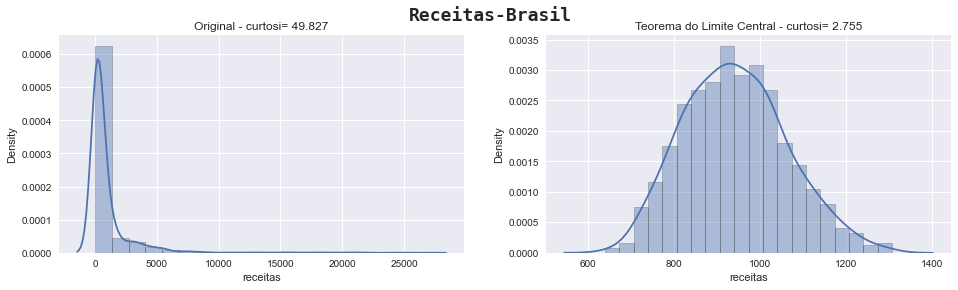

>>>>>>> Receitas-Sudeste:
Média amostra: 1008.185
Média população: 942.306
Intervalo de confiança: 936.551 <------------> 948.062
p-valor=[3.3254902e-38]
Resultado:  A amostra é estatisticamente diferente da população! (rejeitamos a hipótese nula).
>>>>>>> Receitas-Centro-oeste:
Média amostra: 614.309
Média população: 942.306
Intervalo de confiança: 936.551 <------------> 948.062
p-valor=[0.]
Resultado:  A amostra é estatisticamente diferente da população! (rejeitamos a hipótese nula).
>>>>>>> Receitas-Sul:
Média amostra: 708.776
Média população: 942.306
Intervalo de confiança: 936.551 <------------> 948.062
p-valor=[0.]
Resultado:  A amostra é estatisticamente diferente da população! (rejeitamos a hipótese nula).
>>>>>>> Receitas-Nordeste:
Média amostra: 1355.288
Média população: 942.306
Intervalo de confiança: 936.551 <------------> 948.062
p-valor=[5.75720645e-224]
Resultado:  A amostra é estatisticamente diferente da população! (rejeitamos a hipótese nula).
>>>>>>> Receitas-Norte:


In [825]:
for i in range(0, 6):
    mf.teste_estatistico(df_abt,'receitas',700, 350, 1658,'Receitas-'+regioes[i], regioes[i],df_abt_tlc,'vendedor_grande_regiao_nome')

#### Custos Administrativos X Regiões

Comparativo Original X TLC




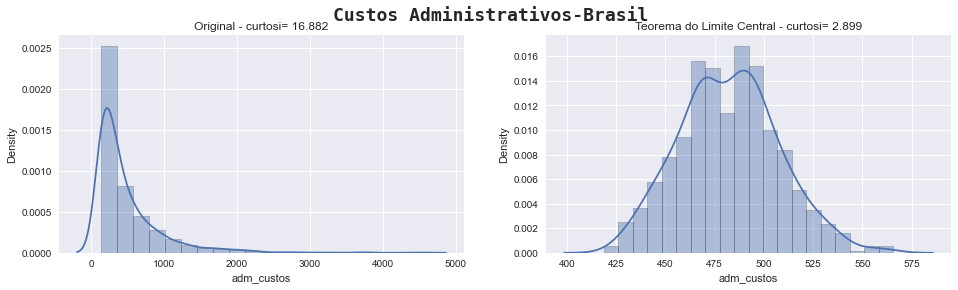

>>>>>>> Custos Administrativos-Sudeste:
Média amostra: 509.356
Média população: 482.282
Intervalo de confiança: 481.066 <------------> 483.498
p-valor=[1.27383757e-99]
Resultado:  A amostra é estatisticamente diferente da população! (rejeitamos a hipótese nula).
>>>>>>> Custos Administrativos-Centro-oeste:
Média amostra: 436.990
Média população: 482.282
Intervalo de confiança: 481.066 <------------> 483.498
p-valor=[0.]
Resultado:  A amostra é estatisticamente diferente da população! (rejeitamos a hipótese nula).
>>>>>>> Custos Administrativos-Sul:
Média amostra: 405.869
Média população: 482.282
Intervalo de confiança: 481.066 <------------> 483.498
p-valor=[0.]
Resultado:  A amostra é estatisticamente diferente da população! (rejeitamos a hipótese nula).
>>>>>>> Custos Administrativos-Nordeste:
Média amostra: 408.072
Média população: 482.282
Intervalo de confiança: 481.066 <------------> 483.498
p-valor=[0.]
Resultado:  A amostra é estatisticamente diferente da população! (rejeitamos 

In [826]:
for i in range(0, 6):
    mf.teste_estatistico(df_abt,'adm_custos',700, 350, 1658,'Custos Administrativos-'+regioes[i], regioes[i], df_abt_tlc,'vendedor_grande_regiao_nome')

#### Pedidos por dia(média) X Regiões

Comparativo Original X TLC




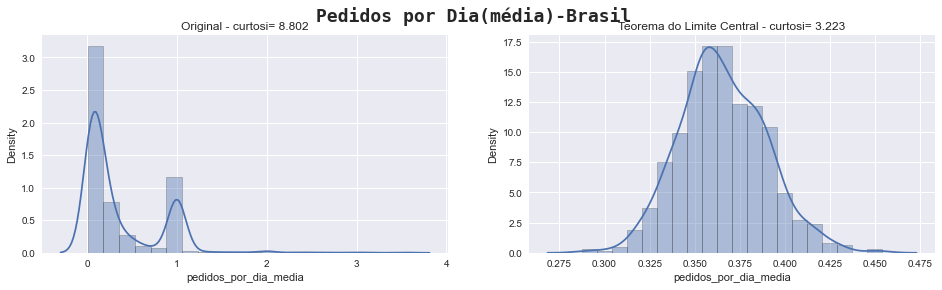

>>>>>>> Pedidos por Dia(média)-Sudeste:
Média amostra: 0.371
Média população: 0.366
Intervalo de confiança: 0.364 <------------> 0.367
p-valor=[6.48766333e-09]
Resultado:  A amostra é estatisticamente diferente da população! (rejeitamos a hipótese nula).
>>>>>>> Pedidos por Dia(média)-Centro-oeste:
Média amostra: 0.267
Média população: 0.366
Intervalo de confiança: 0.364 <------------> 0.367
p-valor=[0.]
Resultado:  A amostra é estatisticamente diferente da população! (rejeitamos a hipótese nula).
>>>>>>> Pedidos por Dia(média)-Sul:
Média amostra: 0.365
Média população: 0.366
Intervalo de confiança: 0.364 <------------> 0.367
p-valor=[0.23602285]
Resultado: As amostras não são estatisticamente diferente da população! (não rejeitamos a hipótese nula).
>>>>>>> Pedidos por Dia(média)-Nordeste:
Média amostra: 0.324
Média população: 0.366
Intervalo de confiança: 0.364 <------------> 0.367
p-valor=[1.27917412e-226]
Resultado:  A amostra é estatisticamente diferente da população! (rejeitamos 

In [827]:
for i in range(0, 6):
    mf.teste_estatistico(df_abt,'pedidos_por_dia_media',700, 350, 1658,'Pedidos por Dia(média)-'+regioes[i], regioes[i], df_abt_tlc,'vendedor_grande_regiao_nome')

#### Velocidade em kms por dia para entrega X Regiões

Comparativo Original X TLC




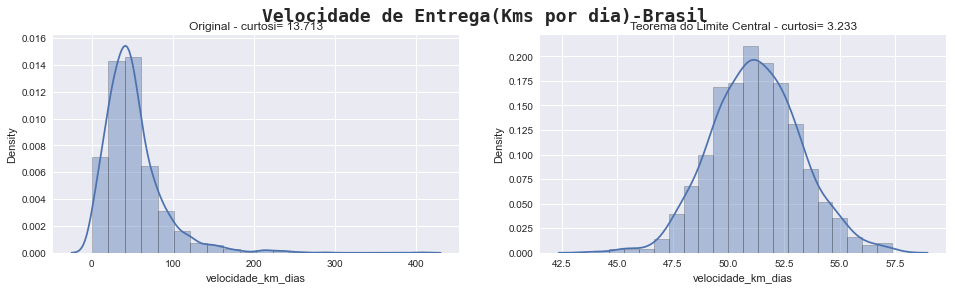

>>>>>>> Velocidade de Entrega(Kms por dia)-Sudeste:
Média amostra: 43.732
Média população: 51.251
Intervalo de confiança: 51.154 <------------> 51.347
p-valor=[0.]
Resultado:  A amostra é estatisticamente diferente da população! (rejeitamos a hipótese nula).
>>>>>>> Velocidade de Entrega(Kms por dia)-Centro-oeste:
Média amostra: 90.879
Média população: 51.251
Intervalo de confiança: 51.154 <------------> 51.347
p-valor=[0.]
Resultado:  A amostra é estatisticamente diferente da população! (rejeitamos a hipótese nula).
>>>>>>> Velocidade de Entrega(Kms por dia)-Sul:
Média amostra: 66.587
Média população: 51.251
Intervalo de confiança: 51.154 <------------> 51.347
p-valor=[0.]
Resultado:  A amostra é estatisticamente diferente da população! (rejeitamos a hipótese nula).
>>>>>>> Velocidade de Entrega(Kms por dia)-Nordeste:
Média amostra: 114.515
Média população: 51.251
Intervalo de confiança: 51.154 <------------> 51.347
p-valor=[0.]
Resultado:  A amostra é estatisticamente diferente da po

In [828]:
for i in range(0, 6):
    mf.teste_estatistico(df_abt,'velocidade_km_dias',700, 350, 1658,'Velocidade de Entrega(Kms por dia)-'+regioes[i], regioes[i],df_abt_tlc,'vendedor_grande_regiao_nome')

#### Custo do Frete X Regiões

Comparativo Original X TLC




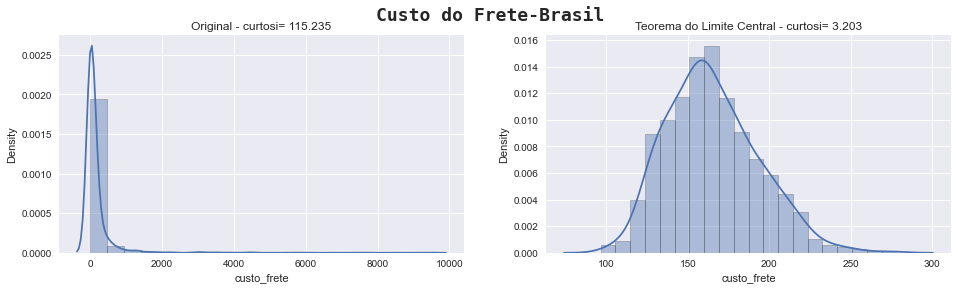

>>>>>>> Custo do Frete-Sudeste:
Média amostra: 177.370
Média população: 165.051
Intervalo de confiança: 163.694 <------------> 166.407
p-valor=[1.77985537e-23]
Resultado:  A amostra é estatisticamente diferente da população! (rejeitamos a hipótese nula).
>>>>>>> Custo do Frete-Centro-oeste:
Média amostra: 113.575
Média população: 165.051
Intervalo de confiança: 163.694 <------------> 166.407
p-valor=[0.]
Resultado:  A amostra é estatisticamente diferente da população! (rejeitamos a hipótese nula).
>>>>>>> Custo do Frete-Sul:
Média amostra: 129.864
Média população: 165.051
Intervalo de confiança: 163.694 <------------> 166.407
p-valor=[4.54270756e-310]
Resultado:  A amostra é estatisticamente diferente da população! (rejeitamos a hipótese nula).
>>>>>>> Custo do Frete-Nordeste:
Média amostra: 226.521
Média população: 165.051
Intervalo de confiança: 163.694 <------------> 166.407
p-valor=[2.37669847e-235]
Resultado:  A amostra é estatisticamente diferente da população! (rejeitamos a hipó

In [829]:
for i in range(0, 6):
    mf.teste_estatistico(df_abt,'custo_frete',700, 350, 1658,'Custo do Frete-'+regioes[i], regioes[i], df_abt_tlc,'vendedor_grande_regiao_nome')

#### Valor da comissão da Olist X Regiões

Comparativo Original X TLC




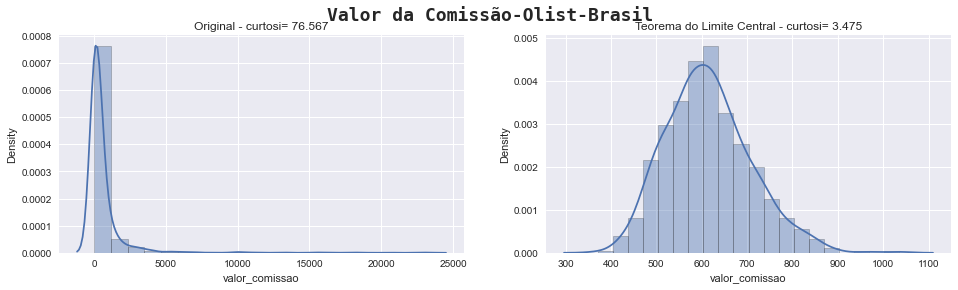

>>>>>>> Valor da Comissão-Olist-Sudeste:
Média amostra: 661.994
Média população: 614.379
Intervalo de confiança: 609.877 <------------> 618.880
p-valor=[5.01576083e-30]
Resultado:  A amostra é estatisticamente diferente da população! (rejeitamos a hipótese nula).
>>>>>>> Valor da Comissão-Olist-Centro-oeste:
Média amostra: 379.920
Média população: 614.379
Intervalo de confiança: 609.877 <------------> 618.880
p-valor=[0.]
Resultado:  A amostra é estatisticamente diferente da população! (rejeitamos a hipótese nula).
>>>>>>> Valor da Comissão-Olist-Sul:
Média amostra: 459.355
Média população: 614.379
Intervalo de confiança: 609.877 <------------> 618.880
p-valor=[0.]
Resultado:  A amostra é estatisticamente diferente da população! (rejeitamos a hipótese nula).
>>>>>>> Valor da Comissão-Olist-Nordeste:
Média amostra: 1176.858
Média população: 614.379
Intervalo de confiança: 609.877 <------------> 618.880
p-valor=[5.3298e-319]
Resultado:  A amostra é estatisticamente diferente da população

In [830]:
for i in range(0, 6):
    mf.teste_estatistico(df_abt,'valor_comissao',700, 350, 1658,'Valor da Comissão-Olist-'+regioes[i], regioes[i], df_abt_tlc,'vendedor_grande_regiao_nome')

#### Valor Médio do Pedido X Regiões

Comparativo Original X TLC




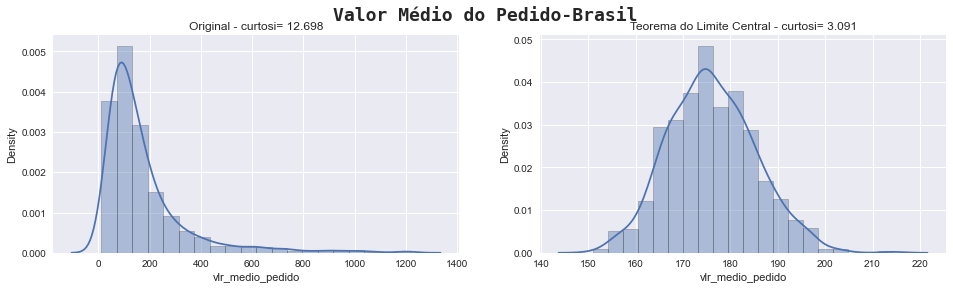

>>>>>>> Valor Médio do Pedido-Sudeste:
Média amostra: 162.764
Média população: 176.123
Intervalo de confiança: 175.681 <------------> 176.564
p-valor=[6.53810524e-184]
Resultado:  A amostra é estatisticamente diferente da população! (rejeitamos a hipótese nula).
>>>>>>> Valor Médio do Pedido-Centro-oeste:
Média amostra: 162.719
Média população: 176.123
Intervalo de confiança: 175.681 <------------> 176.564
p-valor=[9.63483481e-315]
Resultado:  A amostra é estatisticamente diferente da população! (rejeitamos a hipótese nula).
>>>>>>> Valor Médio do Pedido-Sul:
Média amostra: 208.201
Média população: 176.123
Intervalo de confiança: 175.681 <------------> 176.564
p-valor=[0.]
Resultado:  A amostra é estatisticamente diferente da população! (rejeitamos a hipótese nula).
>>>>>>> Valor Médio do Pedido-Nordeste:
Média amostra: 307.610
Média população: 176.123
Intervalo de confiança: 175.681 <------------> 176.564
p-valor=[0.]
Resultado:  A amostra é estatisticamente diferente da população! (r

In [831]:
for i in range(0, 6):
    mf.teste_estatistico(df_abt,'vlr_medio_pedido',700, 350, 1658,'Valor Médio do Pedido-'+regioes[i], regioes[i], df_abt_tlc,'vendedor_grande_regiao_nome')

#### Número de Clientes que Compraram Novamente X Regiões

Comparativo Original X TLC




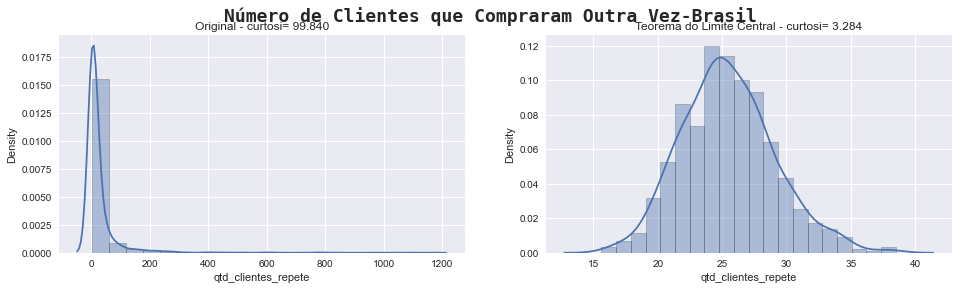

>>>>>>> Número de Clientes que Compraram Outra Vez-Sudeste:
Média amostra: 29.390
Média população: 25.464
Intervalo de confiança: 25.289 <------------> 25.638
p-valor=[4.02123048e-88]
Resultado:  A amostra é estatisticamente diferente da população! (rejeitamos a hipótese nula).
>>>>>>> Número de Clientes que Compraram Outra Vez-Centro-oeste:
Média amostra: 15.549
Média população: 25.464
Intervalo de confiança: 25.289 <------------> 25.638
p-valor=[0.]
Resultado:  A amostra é estatisticamente diferente da população! (rejeitamos a hipótese nula).
>>>>>>> Número de Clientes que Compraram Outra Vez-Sul:
Média amostra: 15.678
Média população: 25.464
Intervalo de confiança: 25.289 <------------> 25.638
p-valor=[0.]
Resultado:  A amostra é estatisticamente diferente da população! (rejeitamos a hipótese nula).
>>>>>>> Número de Clientes que Compraram Outra Vez-Nordeste:
Média amostra: 16.094
Média população: 25.464
Intervalo de confiança: 25.289 <------------> 25.638
p-valor=[0.]
Resultado:  A

In [832]:
for i in range(0, 6):
    mf.teste_estatistico(df_abt,'qtd_clientes_repete',700, 350, 1658,'Número de Clientes que Compraram Outra Vez-'+regioes[i], regioes[i], df_abt_tlc,'vendedor_grande_regiao_nome')

#### Dias entre pedidos X Regiões

Comparativo Original X TLC




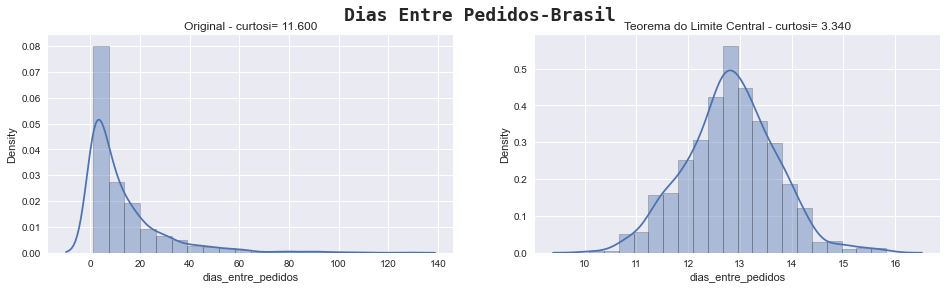

>>>>>>> Dias Entre Pedidos-Sudeste:
Média amostra: 12.394
Média população: 12.822
Intervalo de confiança: 12.780 <------------> 12.864
p-valor=[1.87963414e-35]
Resultado:  A amostra é estatisticamente diferente da população! (rejeitamos a hipótese nula).
>>>>>>> Dias Entre Pedidos-Centro-oeste:
Média amostra: 11.872
Média população: 12.822
Intervalo de confiança: 12.780 <------------> 12.864
p-valor=[1.98567423e-162]
Resultado:  A amostra é estatisticamente diferente da população! (rejeitamos a hipótese nula).
>>>>>>> Dias Entre Pedidos-Sul:
Média amostra: 13.795
Média população: 12.822
Intervalo de confiança: 12.780 <------------> 12.864
p-valor=[5.82574403e-124]
Resultado:  A amostra é estatisticamente diferente da população! (rejeitamos a hipótese nula).
>>>>>>> Dias Entre Pedidos-Nordeste:
Média amostra: 18.590
Média população: 12.822
Intervalo de confiança: 12.780 <------------> 12.864
p-valor=[0.]
Resultado:  A amostra é estatisticamente diferente da população! (rejeitamos a hipó

In [833]:
for i in range(0, 6):
    mf.teste_estatistico(df_abt,'dias_entre_pedidos',700, 350, 1658,'Dias Entre Pedidos-'+regioes[i], regioes[i], df_abt_tlc,'vendedor_grande_regiao_nome')

## <a class="anchor" id="matcor">1.5 Matriz de Correlação</a>
[Retorna ao Indice](#etapas)

In [834]:

#Correlation Tests are used to check the correlation between two independent features or variables.
#Spearman’s Rank Correlation : Tests whether a data sample is montonically separable.
#https://geographyfieldwork.com/SpearmansRankCalculator.html

#H0: Não há correlação
#H1: Há correlação
#https://geographyfieldwork.com/SpearmansRankCalculator.html

df_corr=df_abt.corr(method='spearman').abs().unstack().sort_values(ascending= False).reset_index()
df_corr.shape
#df_corr_1.drop_duplicates(subset='level_0', keep='last')

#Todas as features sem autocorrelação e que têm muita correlação(1) c/ outras.
df_corr_1=df_corr[(df_corr.level_0!=df_corr.level_1)&(df_corr.iloc[:, 2]>0.9999999)] 
df_corr_1

,level_0,level_1,0
21,pagamento_tipo_boleto,pagamento_parcelas_boleto,1.0
22,pagamento_tipo_boleto,pagamento_sequencia_boleto,1.0
25,pagamento_tipo_cartao_debito,pagamento_parcelas_cartao_debito,1.0
26,pagamento_tipo_cartao_debito,pagamento_sequencia_cartao_debito,1.0
28,pagamento_parcelas_boleto,pagamento_tipo_boleto,1.0
30,pagamento_parcelas_boleto,pagamento_sequencia_boleto,1.0
36,plano_valor,plano_comissao,1.0
37,plano_comissao,plano_valor,1.0
45,qtd_clientes_repete,qtd_pedidos,1.0
46,qtd_clientes_repete,adm_custos,1.0


In [835]:
    
#%%time
#plt.style.use('seaborn')
#plt.figure(figsize=(2,1))
#inicio=0
#for y in range(inicio,len(features_corr)-1):
#    fim=len(features_corr) + 1
#    inicio2=y+1
#    for x in range(inicio2,fim):
#        if features_corr[x-1] != features_corr[y]: 
#            nome = 'imagem_'+features_corr[x-1]+'_'+features_corr[y]
#            sns.regplot(df_abt[features_corr[x-1]],df_abt[features_corr[y]],data=df_abt,ci=None,robust=True,scatter_kws={"color":"red"},line_kws={"color":"green"})
#            plt.savefig('../Template/'+nome+'.png',dsi=100)
#            plt.show()  
#com 5687 graficos            
#Wall time: 35min 16s  


In [836]:
df_abt=df_abt_orig.copy(deep=True)

mf.verifica_correlacao(df_abt,0.9999,1.0)

Para  pagamento_tipo_boleto pagamento_parcelas_boleto  HÁ CORRELAÇÃO. p-value=0.0 estatistica=1.0000
Para  pagamento_tipo_boleto pagamento_sequencia_boleto  HÁ CORRELAÇÃO. p-value=0.0 estatistica=1.0000
Para  pagamento_tipo_cartao_debito pagamento_parcelas_cartao_debito  HÁ CORRELAÇÃO. p-value=0.0 estatistica=1.0000
Para  pagamento_tipo_cartao_debito pagamento_sequencia_cartao_debito  HÁ CORRELAÇÃO. p-value=0.0 estatistica=1.0000
Para  pagamento_parcelas_boleto pagamento_tipo_boleto  HÁ CORRELAÇÃO. p-value=0.0 estatistica=1.0000
Para  pagamento_parcelas_boleto pagamento_sequencia_boleto  HÁ CORRELAÇÃO. p-value=0.0 estatistica=1.0000
Para  plano_valor plano_comissao  HÁ CORRELAÇÃO. p-value=0.0 estatistica=-1.0000
Para  plano_comissao plano_valor  HÁ CORRELAÇÃO. p-value=0.0 estatistica=-1.0000
Para  qtd_clientes_repete qtd_pedidos  HÁ CORRELAÇÃO. p-value=0.0 estatistica=1.0000
Para  qtd_clientes_repete adm_custos  HÁ CORRELAÇÃO. p-value=0.0 estatistica=1.0000
Para  qtd_pedidos qtd_client

In [837]:
#Confirmação do teste estatístico das relações que features serão excluidas por isto.
df_abt.drop(['pagamento_sequencia_boleto','pagamento_sequencia_cartao_debito','pagamento_sequencia_voucher',
    'plano_valor','pagamento_tipo_cartao_debito','pagamento_tipo_boleto','qtd_clientes_repete',
    'adm_custos','valor_comissao'], axis=1, inplace=True)

mf.conferindo_correlacao(df_abt,0.9999,1.0)

0 correlações de 0.9999 à 1.0 
Número features agora 105.


In [838]:
mf.verifica_correlacao(df_abt,0.95,0.9999)

Para  qtd_clientes qtd_pedidos  HÁ CORRELAÇÃO. p-value=0.0 estatistica=0.9997
Para  qtd_pedidos qtd_clientes  HÁ CORRELAÇÃO. p-value=0.0 estatistica=0.9997
Para  pagamento_tipo_cartao_credito pagamento_sequencia_cartao_credito  HÁ CORRELAÇÃO. p-value=0.0 estatistica=0.9996
Para  pagamento_sequencia_cartao_credito pagamento_tipo_cartao_credito  HÁ CORRELAÇÃO. p-value=0.0 estatistica=0.9996
Para  pagamento_valor_cartao_debito pagamento_parcelas_cartao_debito  HÁ CORRELAÇÃO. p-value=0.0 estatistica=0.9994
Para  pagamento_parcelas_cartao_debito pagamento_valor_cartao_debito  HÁ CORRELAÇÃO. p-value=0.0 estatistica=0.9994
Para  qtd_mes_01 vlr_mes_01  HÁ CORRELAÇÃO. p-value=0.0 estatistica=0.9983
Para  vlr_mes_01 qtd_mes_01  HÁ CORRELAÇÃO. p-value=0.0 estatistica=0.9983
Para  qtd_produtos qtd_pedidos  HÁ CORRELAÇÃO. p-value=0.0 estatistica=0.9983
Para  qtd_pedidos qtd_produtos  HÁ CORRELAÇÃO. p-value=0.0 estatistica=0.9983
Para  pedidos_por_dia_media dias_entre_pedidos  HÁ CORRELAÇÃO. p-value

In [839]:
#Confirmação do teste estatístico das relações que features serão excluidas por isto.
df_abt.drop(['pagamento_sequencia_cartao_credito','dias_olist','vendedor_estado_id',
    'qtd_produtos','vendedor_pontuacao','qtd_pedidos','qtd_clientes_capital','preco_frete',
    'pagamento_valor_cartao_credito','pagamento_tipo_cartao_credito','tempo_entrega_aprovado_LeadTime_mediana',
    'tempo_postagem_aprovado_mediana','PIB_percapita_(51000,344847]','PIB_percapita_(27000,35000]',
    'PIB_percapita_(35000,43000]','PIB_percapita_(43000,51000]','PIB_percapita_(11000,19000]',
    'PIB_percapita_(19000,27000]','frete_valor','pagamento_parcelas_boleto','pagamento_parcelas_cartao_credito',
    'qtd_clientes_fora_estado','custo_reviews','receitas','pagamento_valor_cartao_debito','pagamento_tipo_voucher',\
    'vlr_mes_01','vlr_mes_02','vlr_mes_03','vlr_mes_04','vlr_mes_05','vlr_mes_06','vlr_mes_07','vlr_mes_08' ,\
    'vlr_mes_09','vlr_mes_10','vlr_mes_11','vlr_mes_12', 'pedidos_por_dia_media','review_score_moda',\
    'pagamento_parcelas_voucher','qtd_clientes','preco_pontos','tempo_postagem_compra_mediana'    ], axis=1, inplace=True)

mf.conferindo_correlacao(df_abt,0.95,0.9999)

0 correlações de 0.95 à 0.9999 
Número features agora 61.


In [840]:
mf.verifica_correlacao(df_abt,0.90,0.95)

Para  qtd_pedidos_pontos qtd_clientes_fora_capital  HÁ CORRELAÇÃO. p-value=0.0 estatistica=0.9307
Para  qtd_clientes_fora_capital qtd_pedidos_pontos  HÁ CORRELAÇÃO. p-value=0.0 estatistica=0.9307


In [841]:
#Confirmação do teste estatístico das relações que features serão excluidas por isto.
df_abt.drop(['qtd_clientes_fora_capital' ] , axis=1, inplace=True)
mf.conferindo_correlacao(df_abt,0.90,0.95)

0 correlações de 0.9 à 0.95 
Número features agora 60.


In [842]:
mf.verifica_correlacao(df_abt,0.85,0.90)

Para  custo_frete preco  HÁ CORRELAÇÃO. p-value=0.0 estatistica=0.8987
Para  preco custo_frete  HÁ CORRELAÇÃO. p-value=0.0 estatistica=0.8987
Para  postagem_limiteparceiro_dias_atraso_mediana postagem_limiteparceiro_atrasado_moda  HÁ CORRELAÇÃO. p-value=0.0 estatistica=0.8903
Para  postagem_limiteparceiro_atrasado_moda postagem_limiteparceiro_dias_atraso_mediana  HÁ CORRELAÇÃO. p-value=0.0 estatistica=0.8903
Para  qtd_pedidos_pontos vendedor_score  HÁ CORRELAÇÃO. p-value=0.0 estatistica=0.8826
Para  vendedor_score qtd_pedidos_pontos  HÁ CORRELAÇÃO. p-value=0.0 estatistica=0.8826
Para  entrega_estimado_atrasado_moda entrega_estimado_dias_atraso_mediana  HÁ CORRELAÇÃO. p-value=0.0 estatistica=0.8657
Para  entrega_estimado_dias_atraso_mediana entrega_estimado_atrasado_moda  HÁ CORRELAÇÃO. p-value=0.0 estatistica=0.8657


In [843]:
#Confirmação do teste estatístico das relações que features serão excluidas por isto.
df_abt.drop(['custo_frete','postagem_limiteparceiro_atrasado_moda','vendedor_score','entrega_estimado_atrasado_moda' ] , axis=1, inplace=True)
mf.conferindo_correlacao(df_abt,0.85,0.90)

0 correlações de 0.85 à 0.9 
Número features agora 56.


In [844]:
mf.verifica_correlacao(df_abt,0.80,0.85)

Para  preco qtd_pedidos_pontos  HÁ CORRELAÇÃO. p-value=0.0 estatistica=0.8307
Para  qtd_pedidos_pontos preco  HÁ CORRELAÇÃO. p-value=0.0 estatistica=0.8307
Para  vlr_medio_pedido razao_frete_preco  HÁ CORRELAÇÃO. p-value=0.0 estatistica=-0.8053
Para  razao_frete_preco vlr_medio_pedido  HÁ CORRELAÇÃO. p-value=0.0 estatistica=-0.8053
Para  populacao_mediana habit_km2_mediana  HÁ CORRELAÇÃO. p-value=0.0 estatistica=0.8051
Para  habit_km2_mediana populacao_mediana  HÁ CORRELAÇÃO. p-value=0.0 estatistica=0.8051


In [845]:
#Confirmação do teste estatístico das relações que features serão excluidas por isto.
df_abt.drop(['qtd_pedidos_pontos','razao_frete_preco','populacao_mediana' ] , axis=1, inplace=True)
mf.conferindo_correlacao(df_abt,0.80,0.85)

0 correlações de 0.8 à 0.85 
Número features agora 53.


In [846]:
mf.verifica_correlacao(df_abt,0.75,0.80)

Para  distancia_cliente_vendedor_mediana velocidade_km_dias  HÁ CORRELAÇÃO. p-value=0.0 estatistica=0.7833
Para  velocidade_km_dias distancia_cliente_vendedor_mediana  HÁ CORRELAÇÃO. p-value=0.0 estatistica=0.7833
Para  produto_volume_cm3_mediana produto_peso_g_mediana  HÁ CORRELAÇÃO. p-value=0.0 estatistica=0.7831
Para  produto_peso_g_mediana produto_volume_cm3_mediana  HÁ CORRELAÇÃO. p-value=0.0 estatistica=0.7831
Para  vendedor_grande_regiao_id vendedor_cidade_id  HÁ CORRELAÇÃO. p-value=0.0 estatistica=0.7745
Para  vendedor_cidade_id vendedor_grande_regiao_id  HÁ CORRELAÇÃO. p-value=0.0 estatistica=0.7745
Para  preco pagamento_valor_boleto  HÁ CORRELAÇÃO. p-value=4.5147736268e-313 estatistica=0.7607
Para  pagamento_valor_boleto preco  HÁ CORRELAÇÃO. p-value=4.5147736268e-313 estatistica=0.7607
Para  tempo_entrega_compra_mediana tempo_entrega_postagem_mediana  HÁ CORRELAÇÃO. p-value=1.383019666793e-311 estatistica=0.7595
Para  tempo_entrega_postagem_mediana tempo_entrega_compra_media

In [847]:
#Confirmação do teste estatístico das relações que features serão excluidas por isto.
df_abt.drop(['tempo_entrega_compra_mediana','pagamento_valor_boleto','vendedor_cidade_id','produto_volume_cm3_mediana','velocidade_km_dias' ] , axis=1, inplace=True)
mf.conferindo_correlacao(df_abt,0.75,0.80)

0 correlações de 0.75 à 0.8 
Número features agora 48.


In [848]:
mf.verifica_correlacao(df_abt,0.70,0.75)

Para  meses_olist preco  HÁ CORRELAÇÃO. p-value=5.0370228047819196e-260 estatistica=0.7153
Para  preco meses_olist  HÁ CORRELAÇÃO. p-value=5.0370228047819196e-260 estatistica=0.7153


In [849]:
#Confirmação do teste estatístico das relações que features serão excluidas por isto.
df_abt.drop(['meses_olist' ] , axis=1, inplace=True)
mf.conferindo_correlacao(df_abt,0.70,0.75)

0 correlações de 0.7 à 0.75 
Número features agora 47.


In [850]:
mf.verifica_correlacao(df_abt,0.65,0.70)

Para  qtd_mes_07 qtd_mes_08  HÁ CORRELAÇÃO. p-value=2.4587460690174426e-242 estatistica=0.6979
Para  qtd_mes_08 qtd_mes_07  HÁ CORRELAÇÃO. p-value=2.4587460690174426e-242 estatistica=0.6979
Para  qtd_mes_05 qtd_mes_06  HÁ CORRELAÇÃO. p-value=5.010799196173222e-219 estatistica=0.6728
Para  qtd_mes_06 qtd_mes_05  HÁ CORRELAÇÃO. p-value=5.010799196173222e-219 estatistica=0.6728
Para  qtd_mes_09 qtd_mes_08  HÁ CORRELAÇÃO. p-value=1.502099505432438e-217 estatistica=0.6712
Para  qtd_mes_08 qtd_mes_09  HÁ CORRELAÇÃO. p-value=1.5020995054321815e-217 estatistica=0.6712
Para  plano_comissao qtd_pedidos_Nacional_Estadual_Comemorativa  HÁ CORRELAÇÃO. p-value=1.5341164078263162e-208 estatistica=-0.6607
Para  qtd_pedidos_Nacional_Estadual_Comemorativa plano_comissao  HÁ CORRELAÇÃO. p-value=1.534116407826839e-208 estatistica=-0.6607
Para  qtd_mes_11 qtd_mes_12  HÁ CORRELAÇÃO. p-value=4.438837820205385e-208 estatistica=0.6602
Para  qtd_mes_12 qtd_mes_11  HÁ CORRELAÇÃO. p-value=4.438837820204374e-208 e

In [851]:
#Confirmação do teste estatístico das relações que features serão excluidas por isto.
df_abt.drop(['qtd_mes_03','qtd_mes_11','qtd_mes_08','qtd_mes_05','plano_comissao'] , axis=1, inplace=True)
mf.conferindo_correlacao(df_abt,0.65,0.70)

0 correlações de 0.65 à 0.7 
Número features agora 42.


In [852]:
mf.verifica_correlacao(df_abt,0.60,0.65)

Para  qtd_mes_09 qtd_mes_10  HÁ CORRELAÇÃO. p-value=1.9447293708131698e-199 estatistica=0.6497
Para  qtd_mes_10 qtd_mes_09  HÁ CORRELAÇÃO. p-value=1.9447293708131698e-199 estatistica=0.6497
Para  qtd_mes_07 qtd_mes_06  HÁ CORRELAÇÃO. p-value=1.6927054330098933e-196 estatistica=0.6460
Para  qtd_mes_06 qtd_mes_07  HÁ CORRELAÇÃO. p-value=1.6927054330100855e-196 estatistica=0.6460
Para  qtd_clientes_estado preco  HÁ CORRELAÇÃO. p-value=1.0246225256054878e-195 estatistica=0.6451
Para  preco qtd_clientes_estado  HÁ CORRELAÇÃO. p-value=1.0246225256054878e-195 estatistica=0.6451
Para  qtd_pedidos_Nacional_Estadual_Comemorativa preco  HÁ CORRELAÇÃO. p-value=2.398298284613612e-193 estatistica=0.6421
Para  preco qtd_pedidos_Nacional_Estadual_Comemorativa  HÁ CORRELAÇÃO. p-value=2.398298284613612e-193 estatistica=0.6421
Para  qtd_mes_10 preco  HÁ CORRELAÇÃO. p-value=1.5941540993891884e-188 estatistica=0.6359
Para  preco qtd_mes_10  HÁ CORRELAÇÃO. p-value=1.5941540993891884e-188 estatistica=0.6359


In [853]:
#Confirmação do teste estatístico das relações que features serão excluidas por isto.
df_abt.drop(['qtd_mes_09','qtd_mes_07','qtd_clientes_estado','qtd_pedidos_Nacional_Estadual_Comemorativa',\
            'qtd_pedidos_Nacional_Estadual_Comemorativa','qtd_mes_10'] , axis=1, inplace=True)
mf.conferindo_correlacao(df_abt,0.60,0.65)

0 correlações de 0.6 à 0.65 
Número features agora 37.


In [854]:
df_abt.shape

(1658, 37)

In [855]:
#Restaram 37 features.Originalmente eram 114.

<AxesSubplot:>

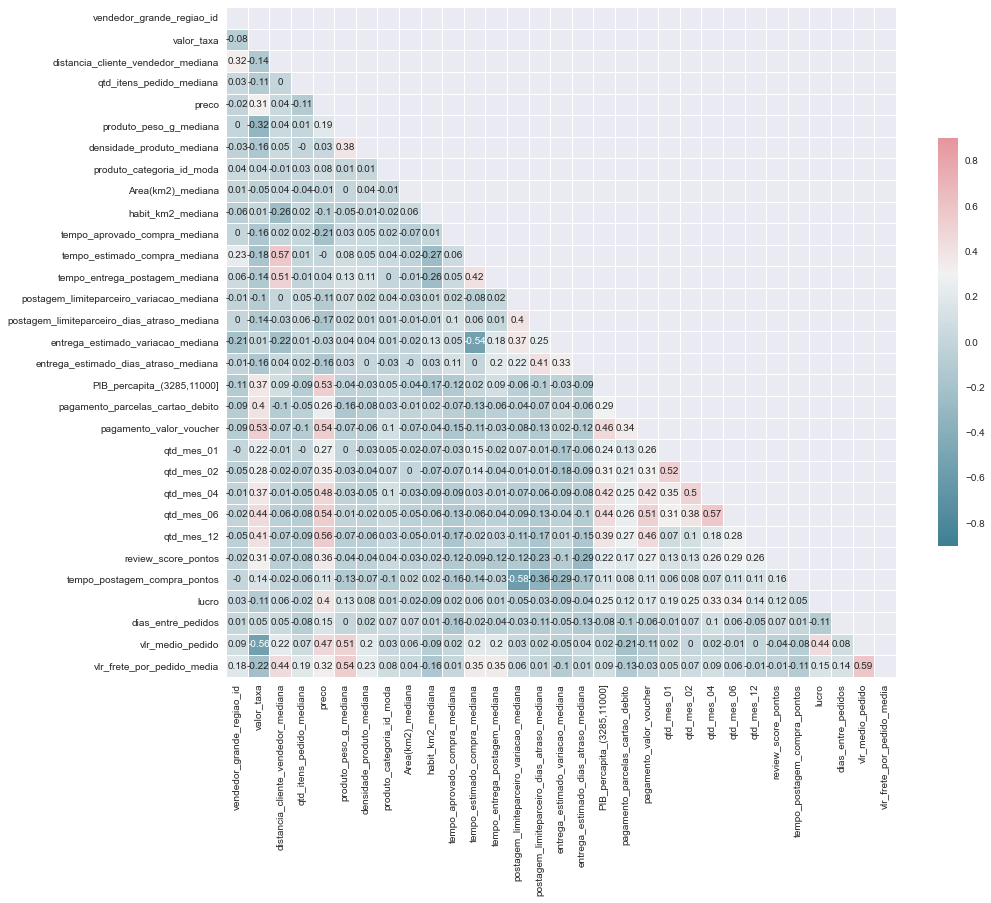

In [856]:
v_max=0.9
v_min=-0.9
v_centre=0.3
final_data_spearman=round(df_abt.corr(method='spearman'),2)
mask = np.triu(np.ones_like(final_data_spearman, dtype=np.bool))
f, ax = plt.subplots(figsize=(15, 15))

cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(final_data_spearman, mask=mask, cmap=cmap, vmax=v_max,vmin=v_min, center=v_centre,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)


## <a class="anchor" id="multcol">1.6 Multicolinearidade</a>
[Retorna ao Indice](#etapas)

In [857]:
features_corr_ult=df_abt.select_dtypes(include=['int64','float64']).columns
features_corr_ult

Index(['vendedor_grande_regiao_id', 'valor_taxa',
       'distancia_cliente_vendedor_mediana', 'qtd_itens_pedido_mediana',
       'preco', 'produto_peso_g_mediana', 'densidade_produto_mediana',
       'produto_categoria_id_moda', 'Area(km2)_mediana', 'habit_km2_mediana',
       'tempo_aprovado_compra_mediana', 'tempo_estimado_compra_mediana',
       'tempo_entrega_postagem_mediana',
       'postagem_limiteparceiro_variacao_mediana',
       'postagem_limiteparceiro_dias_atraso_mediana',
       'entrega_estimado_variacao_mediana',
       'entrega_estimado_dias_atraso_mediana', 'PIB_percapita_(3285,11000]',
       'pagamento_parcelas_cartao_debito', 'pagamento_valor_voucher',
       'qtd_mes_01', 'qtd_mes_02', 'qtd_mes_04', 'qtd_mes_06', 'qtd_mes_12',
       'review_score_pontos', 'tempo_postagem_compra_pontos', 'lucro',
       'dias_entre_pedidos', 'vlr_medio_pedido', 'vlr_frete_por_pedido_media'],
      dtype='object')

In [858]:
mf.vif_calculo(df_abt[features_corr_ult]).sort_values(by='VIF', ascending=False)


,features,VIF
11,tempo_estimado_compra_mediana,96.541918
15,entrega_estimado_variacao_mediana,41.335895
0,vendedor_grande_regiao_id,27.665876
12,tempo_entrega_postagem_mediana,23.054765
25,review_score_pontos,15.789953
4,preco,15.037138
26,tempo_postagem_compra_pontos,11.681636
30,vlr_frete_por_pedido_media,10.905847
3,qtd_itens_pedido_mediana,7.217986
1,valor_taxa,7.032133


In [859]:
df_abt.drop(['tempo_estimado_compra_mediana'], axis=1, inplace=True)
features_corr_ult=df_abt.select_dtypes(include=['int64','float64']).columns
mf.vif_calculo(df_abt[features_corr_ult]).sort_values(by='VIF', ascending=False)

,features,VIF
0,vendedor_grande_regiao_id,25.310783
24,review_score_pontos,15.077023
4,preco,15.015567
29,vlr_frete_por_pedido_media,10.901397
14,entrega_estimado_variacao_mediana,10.169395
11,tempo_entrega_postagem_mediana,9.881668
25,tempo_postagem_compra_pontos,9.079691
3,qtd_itens_pedido_mediana,7.128563
1,valor_taxa,7.031211
18,pagamento_valor_voucher,6.612771


In [860]:
df_abt.drop(['vendedor_grande_regiao_id'], axis=1, inplace=True)
features_corr_ult=df_abt.select_dtypes(include=['int64','float64']).columns
mf.vif_calculo(df_abt[features_corr_ult]).sort_values(by='VIF', ascending=False)

,features,VIF
3,preco,14.979063
23,review_score_pontos,12.209092
28,vlr_frete_por_pedido_media,10.811217
13,entrega_estimado_variacao_mediana,9.169785
10,tempo_entrega_postagem_mediana,9.082574
24,tempo_postagem_compra_pontos,8.743045
0,valor_taxa,7.019518
2,qtd_itens_pedido_mediana,6.774046
17,pagamento_valor_voucher,6.607381
11,postagem_limiteparceiro_variacao_mediana,6.253031


In [861]:
df_abt.drop(['review_score_pontos'], axis=1, inplace=True)
features_corr_ult=df_abt.select_dtypes(include=['int64','float64']).columns
mf.vif_calculo(df_abt[features_corr_ult]).sort_values(by='VIF', ascending=False)

,features,VIF
3,preco,14.823671
27,vlr_frete_por_pedido_media,10.692043
10,tempo_entrega_postagem_mediana,8.711197
13,entrega_estimado_variacao_mediana,8.463477
23,tempo_postagem_compra_pontos,7.650083
0,valor_taxa,7.006120
17,pagamento_valor_voucher,6.605299
2,qtd_itens_pedido_mediana,6.416593
11,postagem_limiteparceiro_variacao_mediana,6.219131
24,lucro,6.183900


In [862]:
df_abt.drop(['vlr_frete_por_pedido_media'], axis=1, inplace=True)
features_corr_ult=df_abt.select_dtypes(include=['int64','float64']).columns
mf.vif_calculo(df_abt[features_corr_ult]).sort_values(by='VIF', ascending=False)

,features,VIF
3,preco,14.681938
10,tempo_entrega_postagem_mediana,8.652279
13,entrega_estimado_variacao_mediana,8.429033
23,tempo_postagem_compra_pontos,7.637868
0,valor_taxa,6.987157
17,pagamento_valor_voucher,6.599376
11,postagem_limiteparceiro_variacao_mediana,6.219061
2,qtd_itens_pedido_mediana,6.165066
24,lucro,6.115182
15,"PIB_percapita_(3285,11000]",5.639623


In [863]:
df_abt.drop(['preco'], axis=1, inplace=True)
features_corr_ult=df_abt.select_dtypes(include=['int64','float64']).columns
mf.vif_calculo(df_abt[features_corr_ult]).sort_values(by='VIF', ascending=False)

,features,VIF
9,tempo_entrega_postagem_mediana,8.644372
12,entrega_estimado_variacao_mediana,8.428612
22,tempo_postagem_compra_pontos,7.634163
10,postagem_limiteparceiro_variacao_mediana,6.216150
2,qtd_itens_pedido_mediana,6.147955
0,valor_taxa,5.680735
14,"PIB_percapita_(3285,11000]",5.379529
16,pagamento_valor_voucher,5.372167
20,qtd_mes_06,4.855315
19,qtd_mes_04,4.609449


In [864]:
df_abt.drop(['tempo_entrega_postagem_mediana'], axis=1, inplace=True)
features_corr_ult=df_abt.select_dtypes(include=['int64','float64']).columns
mf.vif_calculo(df_abt[features_corr_ult]).sort_values(by='VIF', ascending=False)

,features,VIF
11,entrega_estimado_variacao_mediana,7.721669
21,tempo_postagem_compra_pontos,7.205599
9,postagem_limiteparceiro_variacao_mediana,6.119411
2,qtd_itens_pedido_mediana,5.676689
0,valor_taxa,5.676525
13,"PIB_percapita_(3285,11000]",5.379399
15,pagamento_valor_voucher,5.372133
19,qtd_mes_06,4.854440
18,qtd_mes_04,4.607533
20,qtd_mes_12,3.276448


In [865]:
df_abt.drop(['entrega_estimado_variacao_mediana'], axis=1, inplace=True)
features_corr_ult=df_abt.select_dtypes(include=['int64','float64']).columns
mf.vif_calculo(df_abt[features_corr_ult]).sort_values(by='VIF', ascending=False)

,features,VIF
20,tempo_postagem_compra_pontos,6.956355
0,valor_taxa,5.674927
2,qtd_itens_pedido_mediana,5.455001
12,"PIB_percapita_(3285,11000]",5.378076
14,pagamento_valor_voucher,5.366947
9,postagem_limiteparceiro_variacao_mediana,5.100540
18,qtd_mes_06,4.854204
17,qtd_mes_04,4.607044
19,qtd_mes_12,3.273992
23,vlr_medio_pedido,3.267396


In [866]:
df_abt.drop(['tempo_postagem_compra_pontos'], axis=1, inplace=True)
features_corr_ult=df_abt.select_dtypes(include=['int64','float64']).columns
mf.vif_calculo(df_abt[features_corr_ult]).sort_values(by='VIF', ascending=False)

,features,VIF
0,valor_taxa,5.664604
12,"PIB_percapita_(3285,11000]",5.375139
14,pagamento_valor_voucher,5.366873
18,qtd_mes_06,4.839138
2,qtd_itens_pedido_mediana,4.784273
17,qtd_mes_04,4.605821
9,postagem_limiteparceiro_variacao_mediana,3.688297
19,qtd_mes_12,3.263142
22,vlr_medio_pedido,3.258863
5,produto_categoria_id_moda,3.139434


In [867]:
df_abt.drop(['valor_taxa'], axis=1, inplace=True)
features_corr_ult=df_abt.select_dtypes(include=['int64','float64']).columns
mf.vif_calculo(df_abt[features_corr_ult]).sort_values(by='VIF', ascending=False)

,features,VIF
13,pagamento_valor_voucher,5.296205
11,"PIB_percapita_(3285,11000]",4.974886
1,qtd_itens_pedido_mediana,4.783766
17,qtd_mes_06,4.689711
16,qtd_mes_04,4.596918
8,postagem_limiteparceiro_variacao_mediana,3.688287
21,vlr_medio_pedido,3.257537
4,produto_categoria_id_moda,3.134074
18,qtd_mes_12,2.990934
0,distancia_cliente_vendedor_mediana,2.902917


In [868]:
df_abt.drop(['pagamento_valor_voucher'], axis=1, inplace=True)
features_corr_ult=df_abt.select_dtypes(include=['int64','float64']).columns
mf.vif_calculo(df_abt[features_corr_ult]).sort_values(by='VIF', ascending=False)

,features,VIF
1,qtd_itens_pedido_mediana,4.783376
11,"PIB_percapita_(3285,11000]",4.646444
15,qtd_mes_04,4.268535
16,qtd_mes_06,4.078946
8,postagem_limiteparceiro_variacao_mediana,3.688019
20,vlr_medio_pedido,3.257488
4,produto_categoria_id_moda,3.133740
0,distancia_cliente_vendedor_mediana,2.902530
14,qtd_mes_02,2.799315
17,qtd_mes_12,2.564465


In [869]:
len(features_corr_ult)

21

<AxesSubplot:>

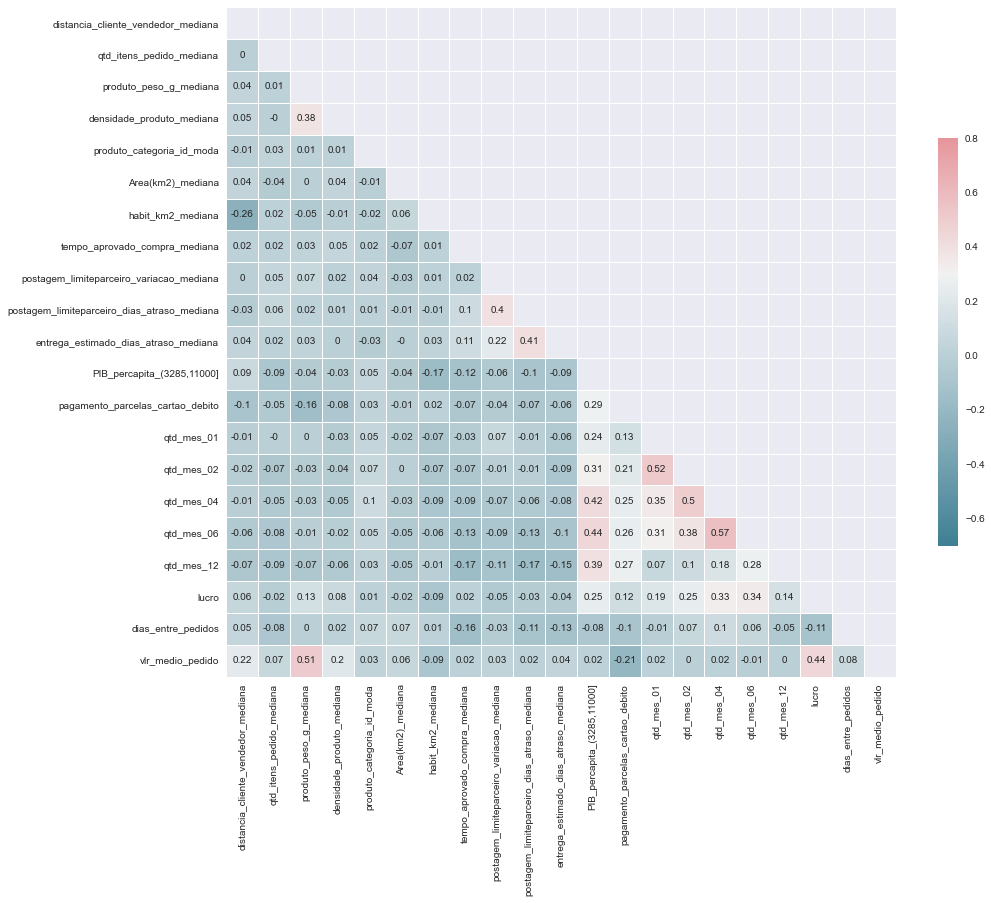

In [870]:
#Conferindo...
features_corr_=df_abt.select_dtypes(include=['int64','float64']).columns
v_max=0.8
v_min=-0.7
v_centre=0.3
final_data_spearman=round(df_abt.corr(method='spearman'),2)
mask = np.triu(np.ones_like(final_data_spearman, dtype=np.bool))
f, ax = plt.subplots(figsize=(15, 15))

cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(final_data_spearman, mask=mask, cmap=cmap, vmax=v_max,vmin=v_min, center=v_centre,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)

## <a class="anchor" id="variancia">1.7 Variância</a>
[Retorna ao Indice](#etapas)

In [873]:
df_features_= df_abt.select_dtypes(include=["int64", "float64"])
df_abt_=df_features_.copy(deep=True)

In [874]:
#Este método nos permite identificar as colunas com uma variância constante
#Isolar colunas com uma variação constante, ou seja, variação = 1
seletor3 = VarianceThreshold(threshold = 1)
seletor3.fit_transform(df_abt_)
seletor3.get_support()
df_abt_.columns[seletor3.get_support()]
colunas_var_1 = [column for column in df_abt_.columns if column 
                    not in df_abt_.columns[seletor3.get_support()]]
colunas_var_1


['qtd_itens_pedido_mediana',
 'densidade_produto_mediana',
 'tempo_aprovado_compra_mediana',
 'pagamento_parcelas_cartao_debito']

In [875]:
df_abt= df_abt.drop(colunas_var_1, axis = 1)
df_abt

,vendedor_id,vendedor_cidade,vendedor_estado,vendedor_grande_regiao_nome,plano,distancia_cliente_vendedor_mediana,produto_peso_g_mediana,produto_categoria_nome_moda,produto_categoria_id_moda,Area(km2)_mediana,habit_km2_mediana,postagem_limiteparceiro_variacao_mediana,postagem_limiteparceiro_dias_atraso_mediana,entrega_estimado_dias_atraso_mediana,"PIB_percapita_(3285,11000]",qtd_mes_01,qtd_mes_02,qtd_mes_04,qtd_mes_06,qtd_mes_12,lucro,dias_entre_pedidos,vlr_medio_pedido
0,0015a82c2db000af6aaaf3ae2ecb0532,santo andre,SP,Sudeste,Lite,687.8890,11800.0,eletroportateis,15,1234.5370,33.480,-5,0,0,0,0,0,0,0,0,280.63,7,916.02
1,001cca7ae9ae17fb1caed9dfb1094831,cariacica,ES,Sudeste,Pro,735.3060,9000.0,ferramentas_jardim,17,520.8070,1465.140,-5,0,0,4,0,5,12,21,12,-593.19,2,164.60
2,002100f778ceb8431b7a1020ff7ab48f,franca,SP,Sudeste,Basic,353.5575,300.0,moveis_decoracao,26,539.7165,843.435,-3,0,0,1,0,0,0,0,15,-552.66,3,36.19
3,003554e2dce176b5555353e4f3555ac8,goiania,GO,Centro-oeste,Lite,936.3580,1200.0,Outros,0,1200.1770,5432.750,-6,0,0,0,0,0,0,0,1,-98.68,1,139.38
4,004c9cd9d87a3c30c522c48c4fc07416,ibitinga,SP,Sudeste,Pro,543.4300,2146.0,cama_mesa_banho,7,779.2000,1488.140,-6,0,0,3,6,12,10,9,12,1386.54,3,146.93
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1653,ff82e8873fba613f2261a9acc896fd84,itabira,MG,Sudeste,Lite,523.0960,500.0,brinquedos_e_bebes,6,478.5210,291.910,-5,0,0,0,0,0,0,0,1,-121.06,1,31.01
1654,ffdd9f82b9a447f6f8d4b91554cc7dd3,curitiba,PR,Sul,Lite,547.8610,2350.0,utilidades_domesticas,33,935.4290,2989.720,-1,0,0,0,0,0,0,0,0,-132.25,38,159.03
1655,ffeee66ac5d5a62fe688b9d26f83f534,mirassol,SP,Sudeste,Lite,449.1380,7600.0,eletrodomesticos,13,794.5710,738.590,-3,0,0,0,0,0,0,0,4,-279.17,10,168.85
1656,fffd5413c0700ac820c7069d66d98c89,amparo,SP,Sudeste,Lite,425.6365,7500.0,utilidades_domesticas,33,1472.4920,327.040,-5,0,0,0,0,0,0,0,4,-302.79,10,199.67


## <a class="anchor" id="testeh">1.8 Teste de Hopkins</a>
[Retorna ao Indice](#etapas)

In [876]:
#fonte:https://sushildeore99.medium.com/really-what-is-hopkins-statistic-bad1265df4b
def hopkins(X):
    d = X.shape[1]
    #d = len(vars) # columns
    n = len(X) # rows
    m = int(0.1 * n) 
    nbrs = NearestNeighbors(n_neighbors=1).fit(X.values)
 
    rand_X = sample(range(0, n, 1), m)
 
    ujd = []
    wjd = []
    for j in range(0, m):
        u_dist, _ = nbrs.kneighbors(uniform(np.amin(X,axis=0),np.amax(X,axis=0),d).reshape(1, -1), 2, True)
        ujd.append(u_dist[0][1])
        w_dist, _ = nbrs.kneighbors(X.iloc[rand_X[j]].values.reshape(1, -1), 2, return_distance=True)
        wjd.append(w_dist[0][1])
 
    H = sum(ujd) / (sum(ujd) + sum(wjd))
    if isnan(H):
        print(ujd, wjd)
        H = 0
 
    return H


In [877]:
%%time
acumula=0
df_features_= df_abt.select_dtypes(include=["int64", "float64"])
for i in range(40):
    calculo = hopkins(df_features_)
    acumula = acumula + calculo
    print(calculo)
print("Média estatística de Hopkins= {}".format(round(acumula/40,3)))                      

0.9613785111846155
0.9543718107748342
0.9571373948399875
0.957847377982162
0.9585795300794024
0.9592260806828704
0.9640496969270363
0.9587346035944889
0.9566973358494141
0.9650378927886991
0.9621422445666078
0.9608122515198316
0.9581959779902269
0.961413849375584
0.9604722450523911
0.959951193212618
0.9580142598071174
0.9542922598333472
0.9596594138246823
0.9555856484506421
0.9583356954436386
0.9586115735734494
0.9631336831624335
0.9622962461034988
0.9635568998046998
0.9602521508402974
0.9606466407123284
0.9599187165176528
0.9543806291249819
0.9630745679216078
0.9600827436306357
0.9609505218906484
0.9581830894071707
0.954651708067725
0.9696722814248542
0.9539900044665517
0.966446262308871
0.9610006675754182
0.9618814259926178
0.9510418557928088
Média estatística de Hopkins= 0.96
Wall time: 18.3 s


In [878]:
df_abt.to_excel(caminho_temp+'02_Coleta_Processamento_df_abt_sem_correlacao.xlsx', index=False)